[![Roboflow Notebooks](https://media.roboflow.com/notebooks/template/bannertest2-2.png?ik-sdk-version=javascript-1.4.3&updatedAt=1672932710194)](https://github.com/roboflow/notebooks)

# Fine-tuning Florence-2 on Object Detection Dataset

---

[![Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/roboflow-ai/notebooks/blob/main/notebooks/how-to-finetune-florence-2-on-detection-dataset.ipynb)
[![Roboflow](https://raw.githubusercontent.com/roboflow-ai/notebooks/main/assets/badges/roboflow-blogpost.svg)](https://blog.roboflow.com/florence-2/)
[![arXiv](https://img.shields.io/badge/arXiv-2311.06242-b31b1b.svg)](https://arxiv.org/abs/2311.06242)

This google notebook is an adaptation of the one found at the links above, published through Roboflow. I have removed the parts of the code unnecessary to our project.

In order to be reproducable, this notebook requires Roboflow and HuggingFace API Tokens.

## Downloading necessary libraries


In [ ]:
!pip install bitsandbytes transformers accelerate peft datasets safetensors roboflow supervision

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.4/59.4 MB 44.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.9/89.9 kB 9.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 47.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 212.4/212.4 kB 18.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 86.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.2/4.2 MB 117.5 MB/s eta 0:00:00
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.12.0.88
    Uninstalling opencv-python-headless-4.12.0.88:
      Successfully uninstalled opencv-python-headless-4.12.0.88
  Attempting uninstall: idna
    Found existing installation: idna 3.11
    Uninstalling idna-3.11:
      Successfully uninstalled idna-3.11


In [ ]:
# @title Imports

import io
import os
import re
import json
import torch
import html
import base64
import itertools

import numpy as np
import supervision as sv

from google.colab import userdata
from IPython.core.display import display, HTML
from torch.utils.data import Dataset, DataLoader
from transformers import (
    AutoModelForCausalLM,
    AutoProcessor,
    get_scheduler
)
from torch.optim import AdamW
from tqdm import tqdm
from typing import List, Dict, Any, Tuple, Generator
from peft import LoraConfig, get_peft_model
from PIL import Image
from roboflow import Roboflow



#My stuff. May have redundancies
import torch
from transformers import (
    AutoProcessor,
    AutoModelForCausalLM,
    BitsAndBytesConfig,
    TrainerCallback,
    Trainer,
    DataCollatorForLanguageModeling,
)
from peft import (
    prepare_model_for_kbit_training,
    LoraConfig,
    get_peft_model,
)
import matplotlib.pyplot as plt

Load the model using `AutoModelForCausalLM` and the processor using `AutoProcessor` classes from the transformers library. Note that you need to pass `trust_remote_code` as `True` since this model is not a standard transformers model.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
#workaround for unnecessary flash_attn requirement
#workaround attribute to James Braza https://huggingface.co/jamesbraza

CHECKPOINT = "microsoft/Florence-2-base-ft"
REVISION = 'refs/pr/6'
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

from unittest.mock import patch
from transformers.dynamic_module_utils import get_imports

from transformers import AutoProcessor, AutoModelForCausalLM
import torch

import os

model_path = "microsoft/Florence-2-base"

def fixed_get_imports(filename: str | os.PathLike) -> list[str]:
    if not str(filename).endswith("modeling_florence2.py"):
        return get_imports(filename)
    imports = get_imports(filename)
    if "flash_attn" in imports:
      imports.remove("flash_attn")
    return imports

with patch("transformers.dynamic_module_utils.get_imports", fixed_get_imports): #workaround for unnecessary flash_attn requirement
    model = AutoModelForCausalLM.from_pretrained(model_path,
                                                 attn_implementation="eager",
                                                 torch_dtype=torch.float32,
                                                 trust_remote_code=True,
                                                 force_download = True)
    processor = AutoProcessor.from_pretrained(
      model_path,
      trust_remote_code=True,
      force_download = True
    )
#end attribute to James Braza

config.json: 0.00B [00:00, ?B/s]

config.json: 0.00B [00:00, ?B/s]

configuration_florence2.py: 0.00B [00:00, ?B/s]

A new version of the following files was downloaded from https://huggingface.co/microsoft/Florence-2-base:
- configuration_florence2.py
. Make sure to double-check they do not contain any added malicious code. To avoid downloading new versions of the code file, you can pin a revision.


config.json: 0.00B [00:00, ?B/s]

`torch_dtype` is deprecated! Use `dtype` instead!


modeling_florence2.py: 0.00B [00:00, ?B/s]

A new version of the following files was downloaded from https://huggingface.co/microsoft/Florence-2-base:
- modeling_florence2.py
. Make sure to double-check they do not contain any added malicious code. To avoid downloading new versions of the code file, you can pin a revision.


model.safetensors:   0%|          | 0.00/463M [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

processing_florence2.py: 0.00B [00:00, ?B/s]

A new version of the following files was downloaded from https://huggingface.co/microsoft/Florence-2-base:
- processing_florence2.py
. Make sure to double-check they do not contain any added malicious code. To avoid downloading new versions of the code file, you can pin a revision.


preprocessor_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/34.0 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

tokenizer_config.json:   0%|          | 0.00/34.0 [00:00<?, ?B/s]

In [ ]:
model.image_projection.data = model.image_projection.data.to("cuda")

for name, param in model.named_parameters():
    if param.device.type != "cuda":
        print("CPU module:", name, param.device)
        break

CPU module: vision_tower.convs.0.proj.weight cpu


In [ ]:
#Sends all parts to CUDA!

DEVICE = torch.device("cuda")

#image = Image.open(EXAMPLE_IMAGE_PATH)
task = "<OD>"
text = "<OD>"

# Make sure inputs are on CUDA
#inputs = processor(
    #text=text,
    #images=image,
    #return_tensors="pt"
#).to(DEVICE)

# Florence 2 requires explicit moves of internal towers
model.to(DEVICE)

model.image_projection.data = model.image_projection.data.to("cuda") #Catches the last one hiding on the CPU

if hasattr(model, "vision_tower"):
    model.vision_tower.to(DEVICE)

if hasattr(model, "text_encoder"):
    model.text_encoder.to(DEVICE)

if hasattr(model, "decoder"):
    model.decoder.to(DEVICE)

if hasattr(model, "vae"):
    model.vae.to(DEVICE)

## Fine-tune Florence-2 on custom dataset

### Download dataset from Roboflow Universe

In [ ]:
ROBOFLOW_API_KEY = userdata.get('ROBOFLOW_API_KEY')
rf = Roboflow(api_key=ROBOFLOW_API_KEY)

project = rf.workspace("ec523-final-project").project("bounding-box-qfdtu")
version = project.version(6)
dataset = version.download("florence2-od") #This is not the name of the version, but it is the way it shall be configured

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Bounding-Box-6 in florence2-od:: 100%|██████████| 821/821 [00:00<00:00, 7978.86it/s]


In [ ]:
!head -n 5 {dataset.location}/train/annotations.jsonl

{"image":"IMG_3926_png.rf.2a6485a3871df6419cf5e17555b8bbb5.jpg","prefix":"<OD>","suffix":"Door Panel<loc_70><loc_85><loc_995><loc_764>"}
{"image":"IMG_2317_png.rf.b7ff770f96687c9c9f3180eff9cb1c40.jpg","prefix":"<OD>","suffix":"Door Panel<loc_401><loc_463><loc_519><loc_607>"}
{"image":"IMG_2230_png.rf.8d75e9b9d1d18a41c5f811c5a9ee3448.jpg","prefix":"<OD>","suffix":"Door Panel<loc_405><loc_282><loc_526><loc_434>Door Panel<loc_486><loc_140><loc_599><loc_268>"}
{"image":"IMG_2157_png.rf.49f72d21ea7ceb06b3ffdefb81e40b93.jpg","prefix":"<OD>","suffix":"Door Panel<loc_425><loc_354><loc_680><loc_619>"}
{"image":"IMG_3956_png.rf.a091654da3547c266fc42057c0ced30c.jpg","prefix":"<OD>","suffix":"Door Panel<loc_395><loc_206><loc_869><loc_877>"}


In [ ]:
# @title Define `DetectionsDataset` class

class JSONLDataset:
    def __init__(self, jsonl_file_path: str, image_directory_path: str):
        self.jsonl_file_path = jsonl_file_path
        self.image_directory_path = image_directory_path
        self.entries = self._load_entries()

    def _load_entries(self) -> List[Dict[str, Any]]:
        entries = []
        with open(self.jsonl_file_path, 'r') as file:
            for line in file:
                data = json.loads(line)
                entries.append(data)
        return entries

    def __len__(self) -> int:
        return len(self.entries)

    def __getitem__(self, idx: int) -> Tuple[Image.Image, Dict[str, Any]]:
        if idx < 0 or idx >= len(self.entries):
            raise IndexError("Index out of range")

        entry = self.entries[idx]
        image_path = os.path.join(self.image_directory_path, entry['image'])
        try:
            image = Image.open(image_path)
            return (image, entry)
        except FileNotFoundError:
            raise FileNotFoundError(f"Image file {image_path} not found.")


class DetectionDataset(Dataset):
    def __init__(self, jsonl_file_path: str, image_directory_path: str):
        self.dataset = JSONLDataset(jsonl_file_path, image_directory_path)

    def __len__(self):
        return len(self.dataset)

    def __getitem__(self, idx):
        image, data = self.dataset[idx]
        prefix = data['prefix']
        suffix = data['suffix']
        return prefix, suffix, image

In [ ]:
# @title Initiate `DetectionsDataset` and `DataLoader` for train and validation subsets

BATCH_SIZE = 6
NUM_WORKERS = 0

def collate_fn(batch):
    questions, answers, images = zip(*batch)
    inputs = processor(text=list(questions), images=list(images), return_tensors="pt", padding=True).to(DEVICE)
    return inputs, answers

train_dataset = DetectionDataset(
    jsonl_file_path = f"{dataset.location}/train/annotations.jsonl",
    image_directory_path = f"{dataset.location}/train/"
)
val_dataset = DetectionDataset(
    jsonl_file_path = f"{dataset.location}/valid/annotations.jsonl",
    image_directory_path = f"{dataset.location}/valid/"
)

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, collate_fn=collate_fn, num_workers=NUM_WORKERS, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, collate_fn=collate_fn, num_workers=NUM_WORKERS)

In [ ]:
# @title Setup LoRA Florence-2 model

config = LoraConfig(
    r=8,
    lora_alpha=8,
    target_modules=["q_proj", "o_proj", "k_proj", "v_proj", "linear", "Conv2d", "lm_head", "fc2"],
    task_type="CAUSAL_LM",
    lora_dropout=0.05,
    bias="none",
    inference_mode=False,
    use_rslora=True,
    init_lora_weights="gaussian",
    revision=REVISION
)

peft_model = get_peft_model(model, config)
peft_model.print_trainable_parameters()

trainable params: 1,929,928 || all params: 233,343,944 || trainable%: 0.8271


Model with `tie_word_embeddings=True` and the tied_target_modules=['language_model.lm_head'] are part of the adapter. This can lead to complications, for example when merging the adapter or converting your model to formats other than safetensors. See for example https://github.com/huggingface/peft/issues/2018.


In [ ]:
torch.cuda.empty_cache()

from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response
failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.



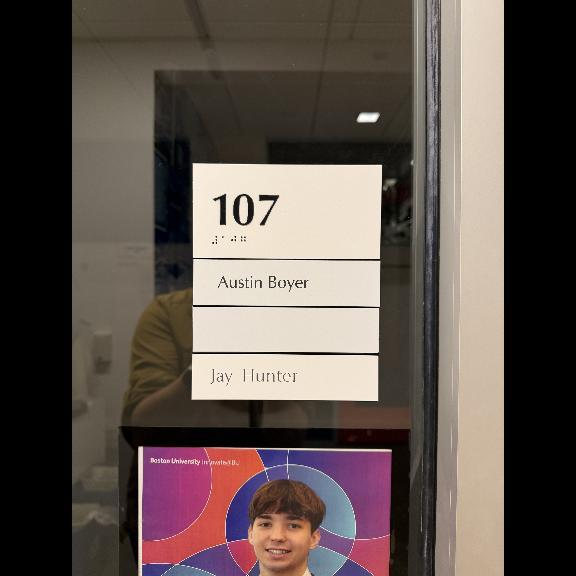
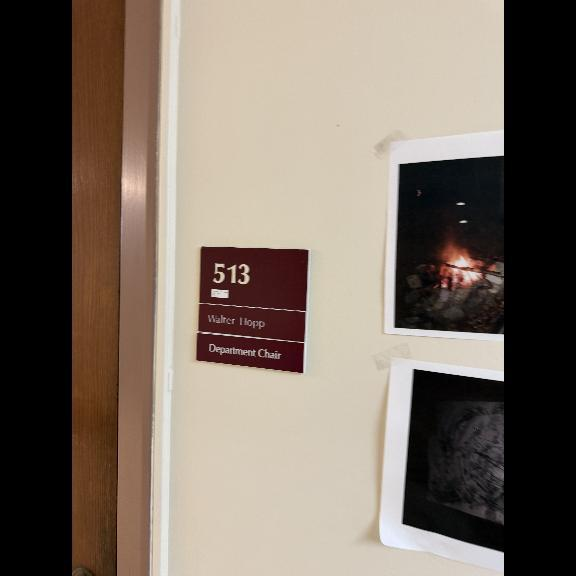
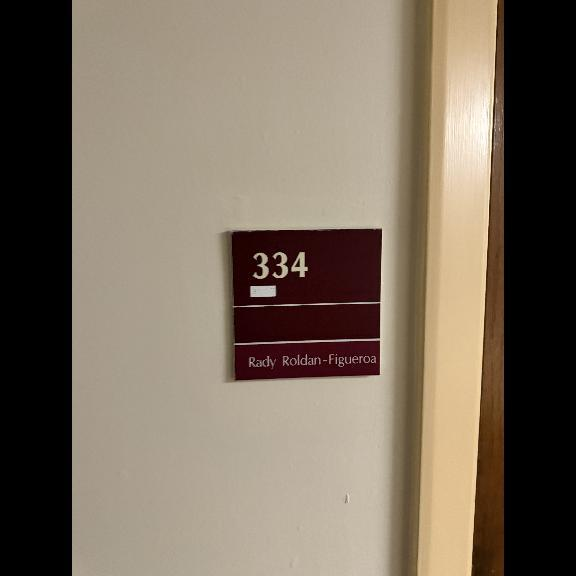
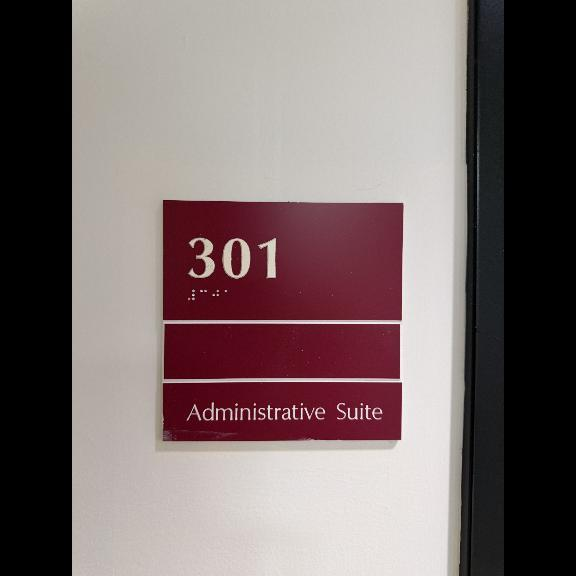

In [ ]:
# @title Run inference with pre-trained Florence-2 model on validation dataset

def render_inline(image: Image.Image, resize=(128, 128)):
    """Convert image into inline html."""
    image.resize(resize)
    with io.BytesIO() as buffer:
        image.save(buffer, format='jpeg')
        image_b64 = str(base64.b64encode(buffer.getvalue()), "utf-8")
        return f"data:image/jpeg;base64,{image_b64}"


def render_example(image: Image.Image, response):
    try:
        detections = sv.Detections.from_lmm(sv.LMM.FLORENCE_2, response, resolution_wh=image.size)
        #Only Search for Door Panels
        mask = [cls == "Door Panel" for cls in detections.class_name]
        detections = detections[mask]

        image = sv.BoundingBoxAnnotator(color_lookup=sv.ColorLookup.INDEX).annotate(image.copy(), detections)
        image = sv.LabelAnnotator(color_lookup=sv.ColorLookup.INDEX).annotate(image, detections)
    except:
        print('failed to render model response')
    return f"""
<div style="display: inline-flex; align-items: center; justify-content: center;">
    <img style="width:256px; height:256px;" src="{render_inline(image, resize=(128, 128))}" />
    <p style="width:512px; margin:10px; font-size:small;">{html.escape(json.dumps(response))}</p>
</div>
"""


def render_inference_results(model, dataset: DetectionDataset, count: int):
    html_out = ""
    count = min(count, len(dataset))
    for i in range(count):
        image, data = dataset.dataset[i]
        prefix = data['prefix']
        suffix = data['suffix']
        inputs = processor(text=prefix, images=image, return_tensors="pt").to(DEVICE)
        generated_ids = model.generate(
            input_ids=inputs["input_ids"],
            pixel_values=inputs["pixel_values"],
            max_new_tokens=1024,
            num_beams=3,
            use_cache=False
        )
        generated_text = processor.batch_decode(generated_ids, skip_special_tokens=False)[0]
        answer = processor.post_process_generation(generated_text, task='<OD>', image_size=image.size)
        html_out += render_example(image, answer)

    display(HTML(html_out))

render_inference_results(peft_model, val_dataset, 4)

## Fine-tune Florence-2 on custom object detection dataset

In [ ]:
# @title Define train loop

def train_model(train_loader, val_loader, model, processor, epochs=10, lr=1e-6, loss_per_epoch=[]):
    optimizer = AdamW(model.parameters(), lr=lr)
    num_training_steps = epochs * len(train_loader)
    lr_scheduler = get_scheduler(
        name="linear",
        optimizer=optimizer,
        num_warmup_steps=0,
        num_training_steps=num_training_steps,
    )

    render_inference_results(peft_model, val_loader.dataset, 6)

    for epoch in range(epochs):
        model.train()
        train_loss = 0
        train_loss_per_epoch = []
        for inputs, answers in tqdm(train_loader, desc=f"Training Epoch {epoch + 1}/{epochs}"):

            input_ids = inputs["input_ids"]
            pixel_values = inputs["pixel_values"]
            labels = processor.tokenizer(
                text=answers,
                return_tensors="pt",
                padding=True,
                return_token_type_ids=False
            ).input_ids.to(DEVICE)

            outputs = model(input_ids=input_ids, pixel_values=pixel_values, labels=labels)
            loss = outputs.loss

            loss.backward(), optimizer.step(), lr_scheduler.step(), optimizer.zero_grad()

            train_loss_per_epoch.append(loss.item())
            train_loss += loss.item()

        avg_train_loss = train_loss / len(train_loader)
        #loss_per_epoch.append(avg_train_loss)
        print(f"Average Training Loss: {avg_train_loss}")

        model.eval()
        val_loss = 0
        val_loss_per_epoch = []
        with torch.no_grad():
            for inputs, answers in tqdm(val_loader, desc=f"Validation Epoch {epoch + 1}/{epochs}"):

                input_ids = inputs["input_ids"]
                pixel_values = inputs["pixel_values"]
                labels = processor.tokenizer(
                    text=answers,
                    return_tensors="pt",
                    padding=True,
                    return_token_type_ids=False
                ).input_ids.to(DEVICE)

                outputs = model(input_ids=input_ids, pixel_values=pixel_values, labels=labels)
                loss = outputs.loss

                val_loss += loss.item()
                val_loss_per_epoch.append(loss.item())

            avg_val_loss = val_loss / len(val_loader)
            #loss_per_epoch.append(avg_val_loss)
            print(f"Average Validation Loss: {avg_val_loss}")

            render_inference_results(peft_model, val_loader.dataset, 6)

        loss_per_epoch.append((avg_train_loss, avg_val_loss))

        output_dir = f"./model_checkpoints/epoch_{epoch+1}"
        os.makedirs(output_dir, exist_ok=True)
        model.save_pretrained(output_dir)
        processor.save_pretrained(output_dir)
        plt.figure()
        plt.plot(val_loss_per_epoch, label='Validation Loss')
        plt.plot(train_loss_per_epoch, label='Training Loss')
        plt.xlabel('Batch')
        plt.ylabel('Loss')
        plt.title(f'Training and Validation Loss, Epoch: {epoch}')
        plt.legend()
        plt.savefig(f"train_val_{epoch}_{len(loss_per_epoch)}.png") #Adds loss_per_epoch to make sure it doesn't save over old versions and error out
        plt.close()
    return loss_per_epoch

from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response
failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.



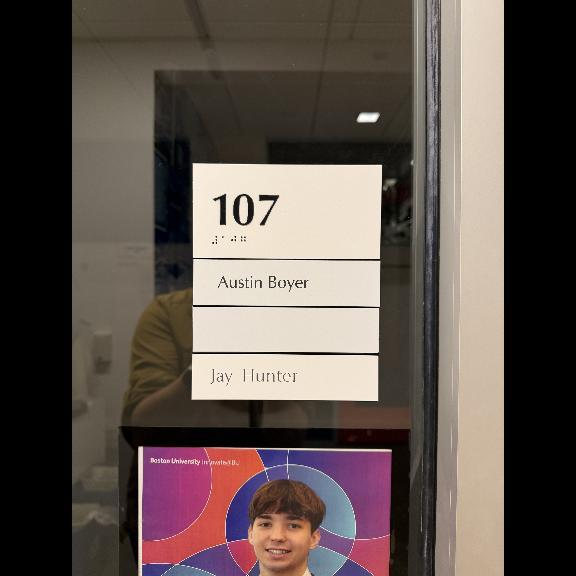
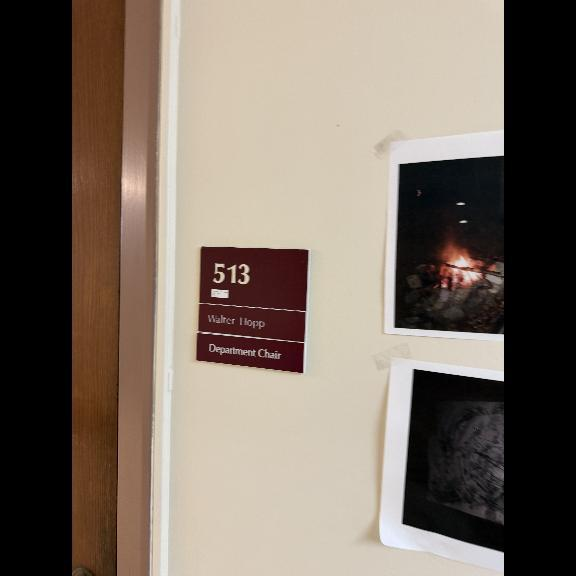
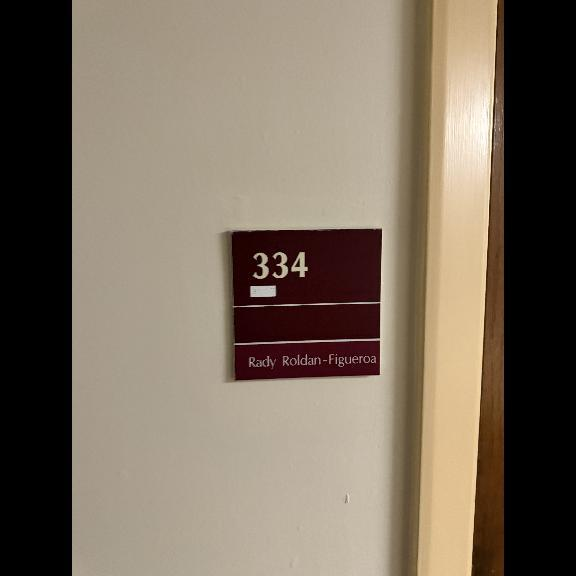
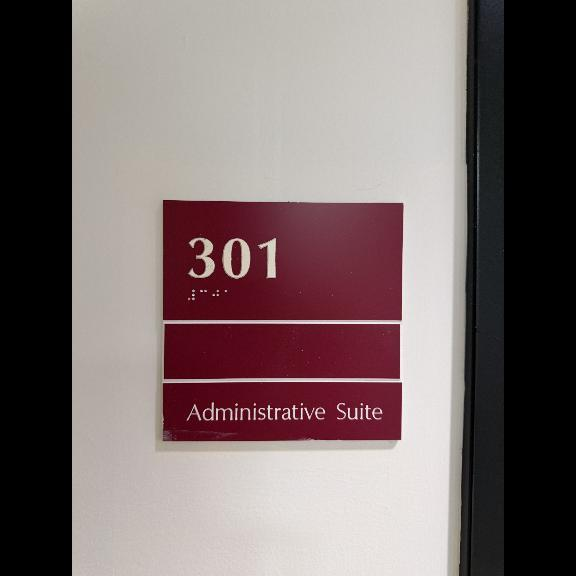
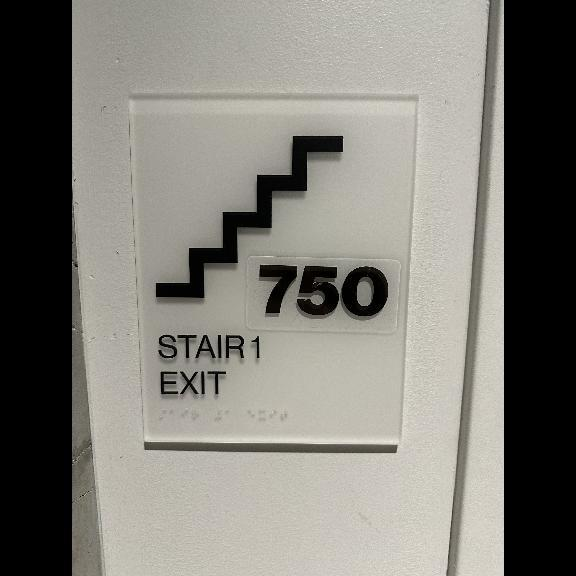
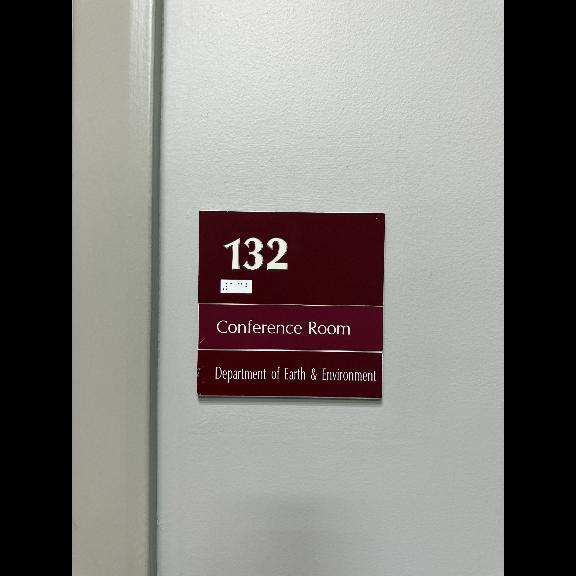

Training Epoch 1/10: 100%|██████████| 95/95 [02:31<00:00,  1.60s/it]


Average Training Loss: 2.0071769381824294


Validation Epoch 1/10: 100%|██████████| 27/27 [00:20<00:00,  1.29it/s]


Average Validation Loss: 1.1601671554424144


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response
failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.



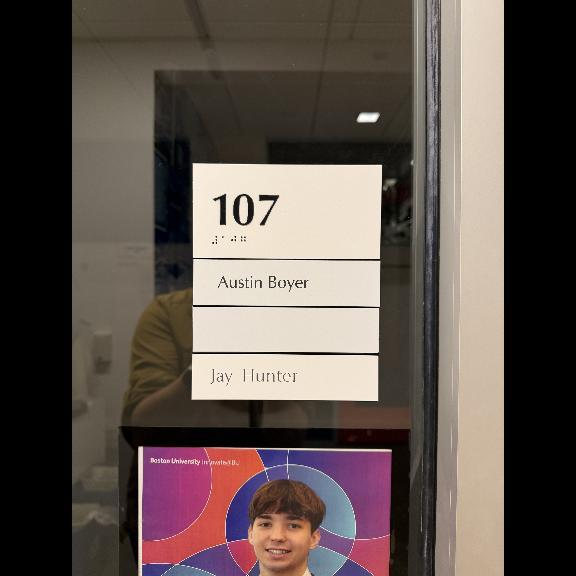
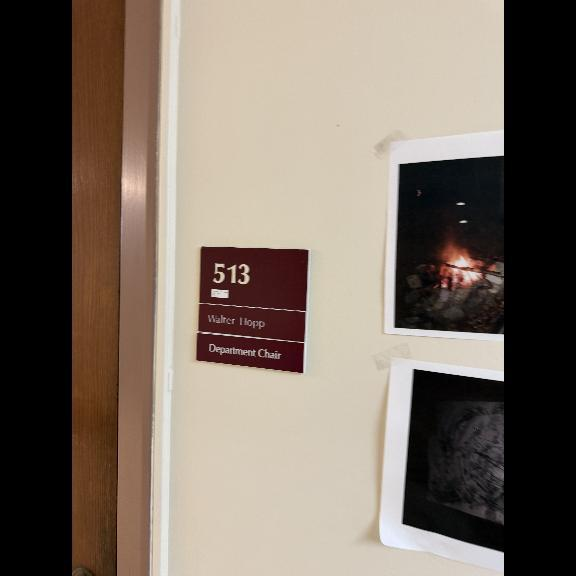
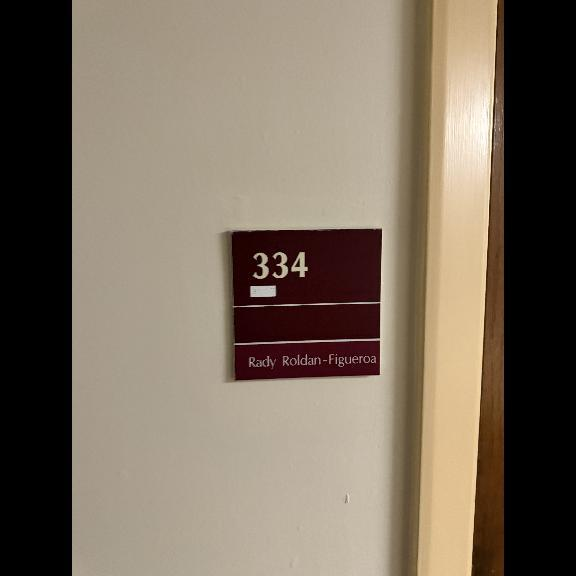
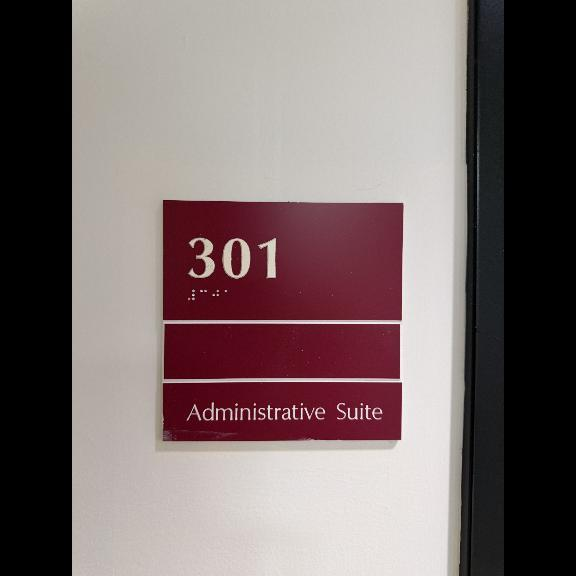
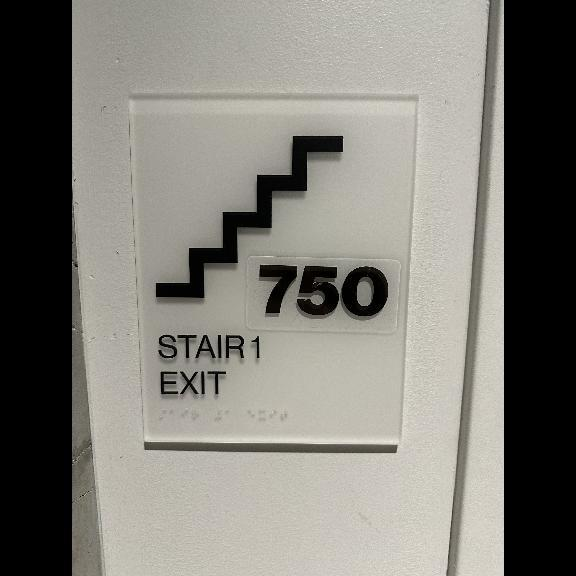
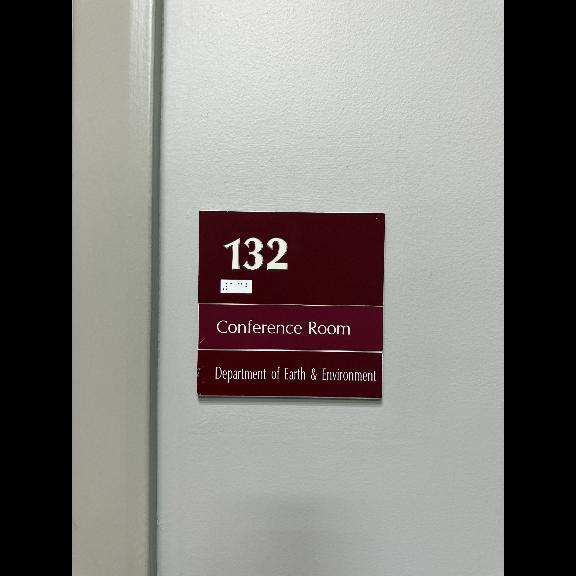

Setting `save_embedding_layers` to `True` as embedding layers found in `target_modules`.
Training Epoch 2/10: 100%|██████████| 95/95 [02:27<00:00,  1.55s/it]


Average Training Loss: 1.1018818140029907


Validation Epoch 2/10: 100%|██████████| 27/27 [00:20<00:00,  1.31it/s]


Average Validation Loss: 1.1565129889382257


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response
failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.



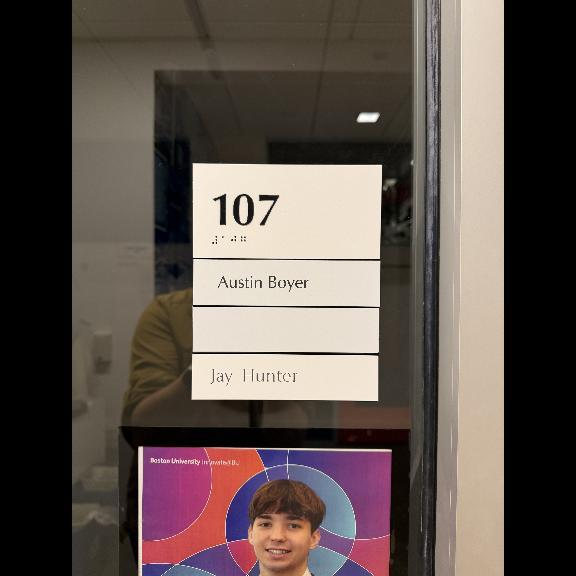
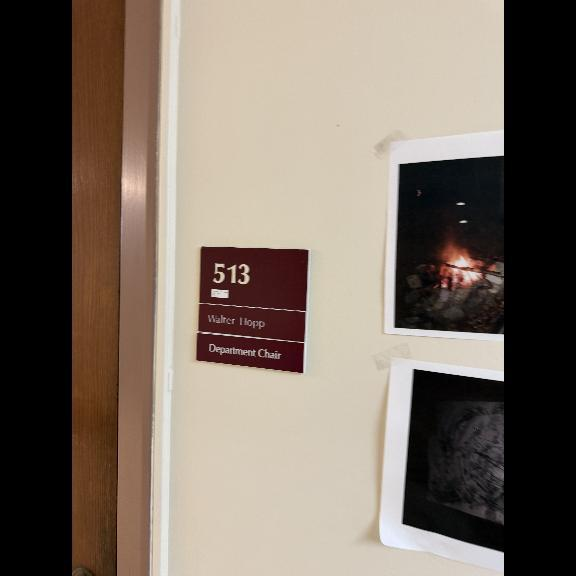
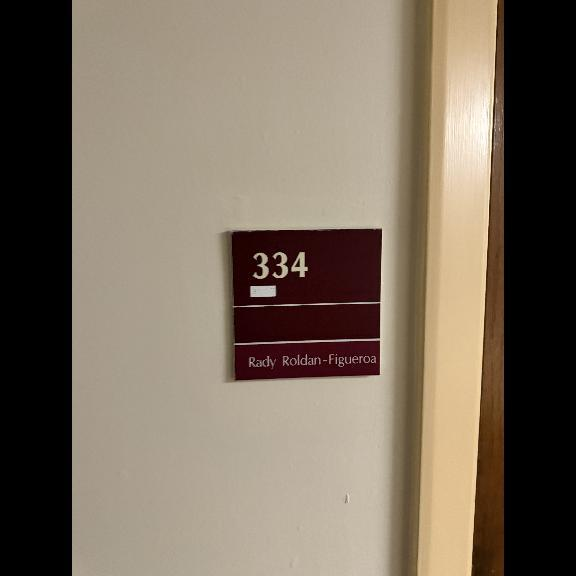
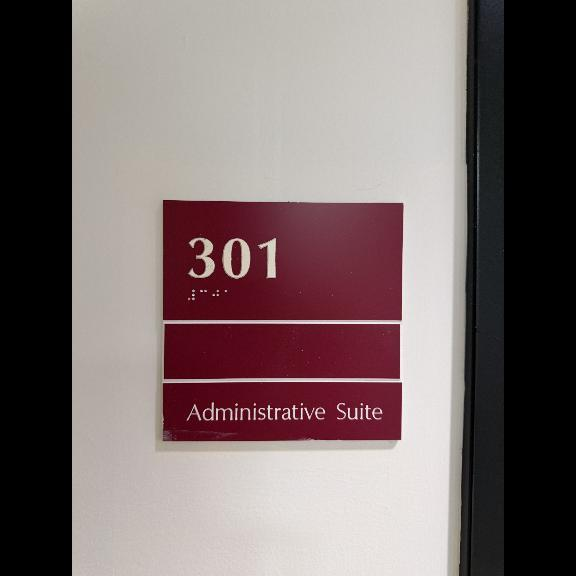
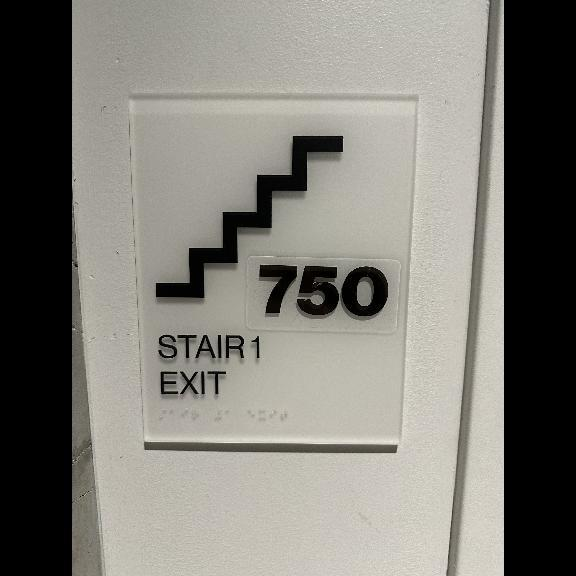
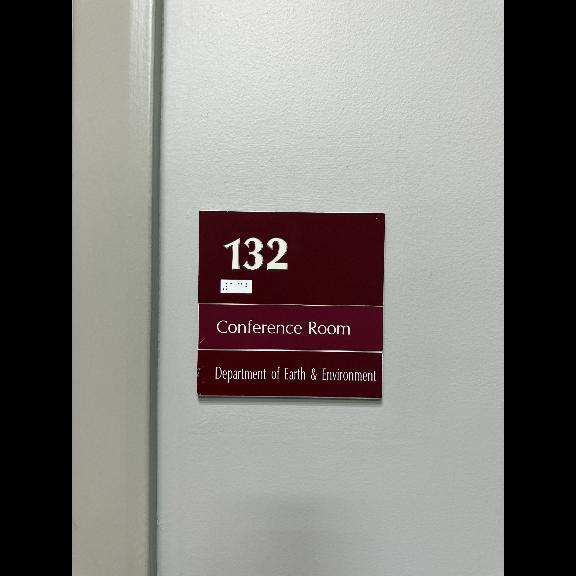

Training Epoch 3/10: 100%|██████████| 95/95 [02:28<00:00,  1.56s/it]


Average Training Loss: 1.0122899695446617


Validation Epoch 3/10: 100%|██████████| 27/27 [00:20<00:00,  1.29it/s]


Average Validation Loss: 1.1865068409177992


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response
failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.



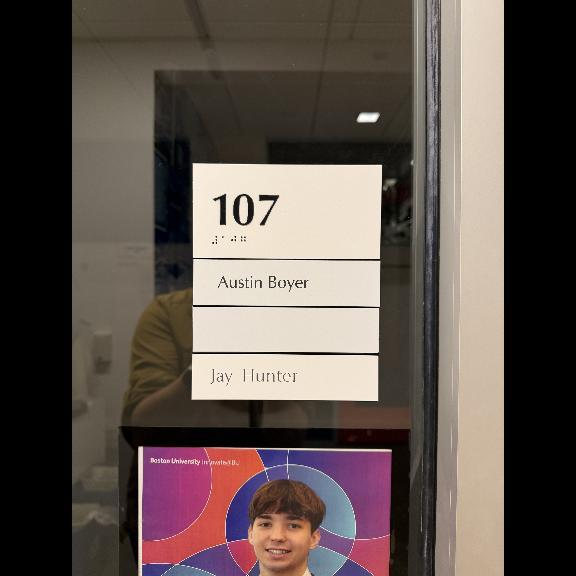
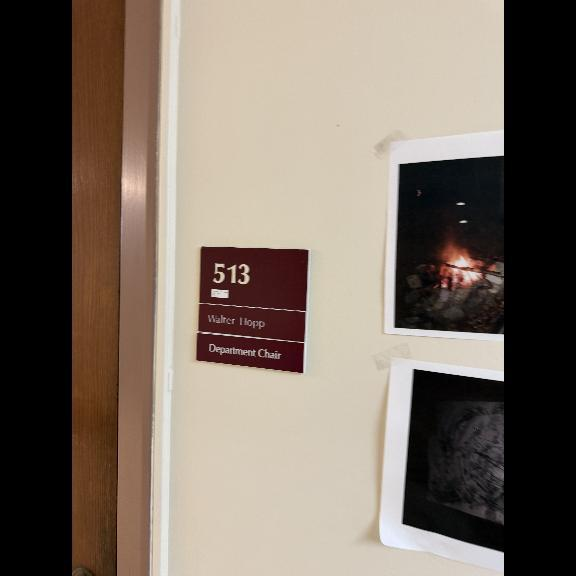
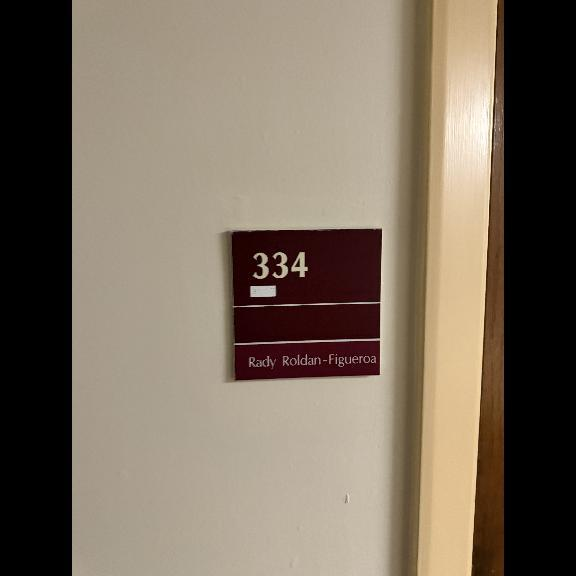
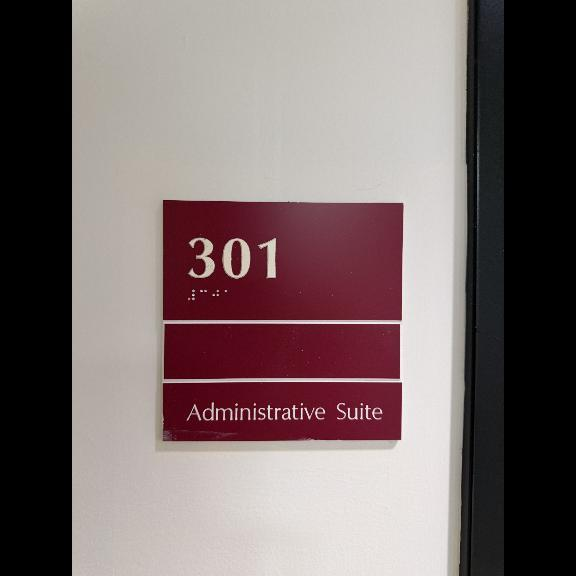
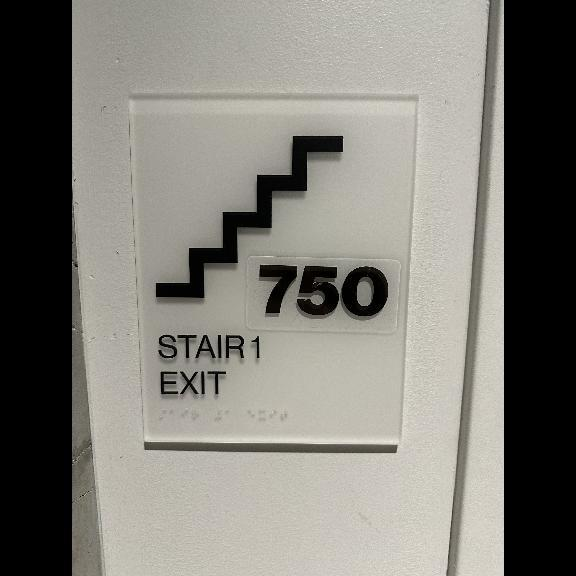
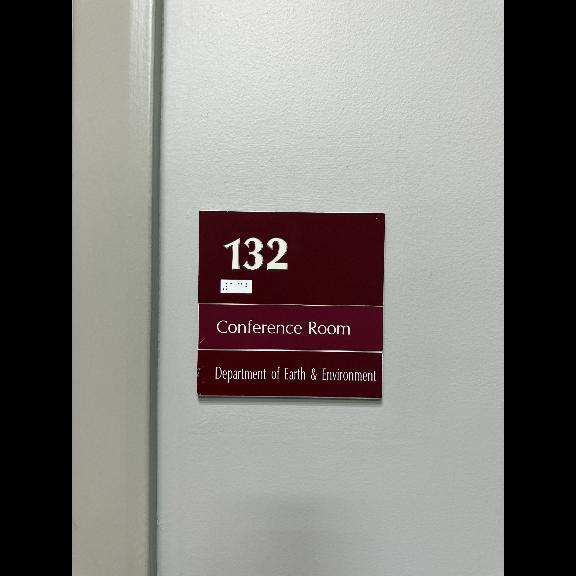

Training Epoch 4/10: 100%|██████████| 95/95 [02:28<00:00,  1.57s/it]


Average Training Loss: 0.9666330111654181


Validation Epoch 4/10: 100%|██████████| 27/27 [00:21<00:00,  1.28it/s]


Average Validation Loss: 1.2203340552471302


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response
failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.



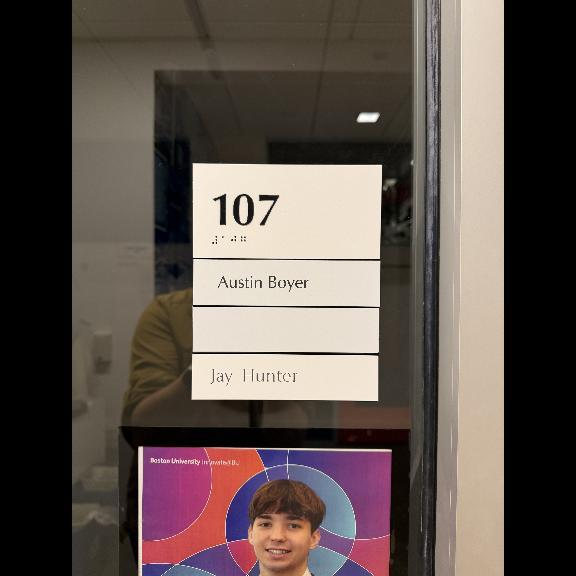
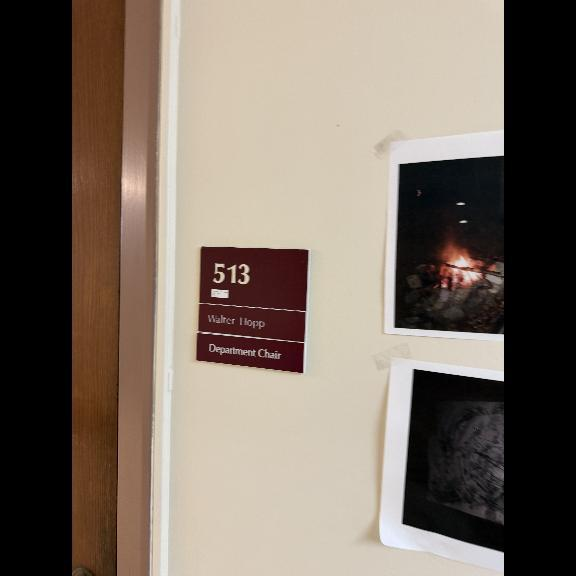
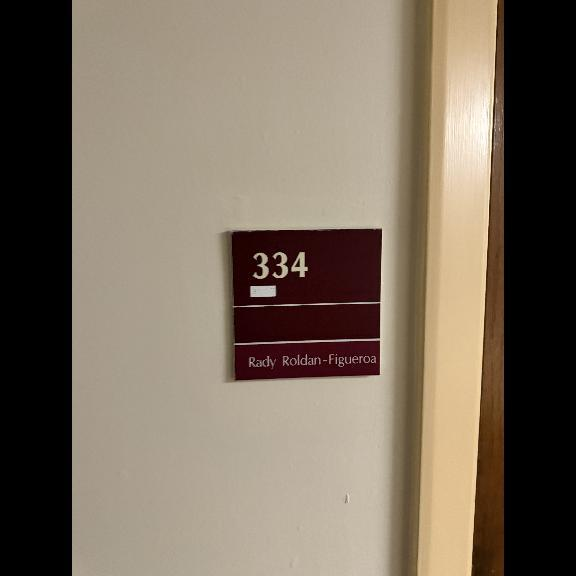
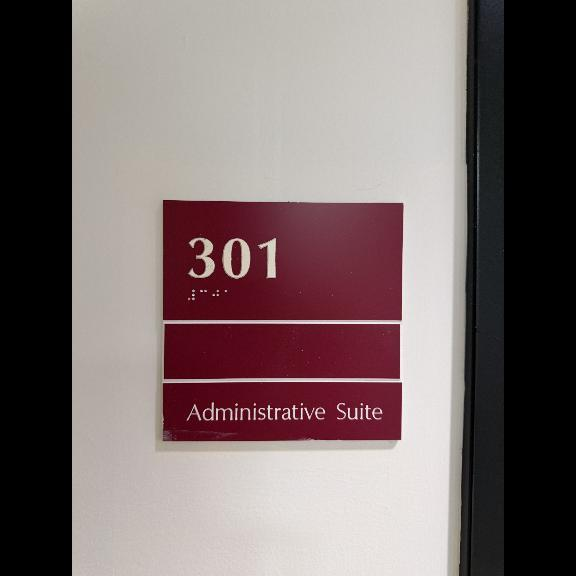
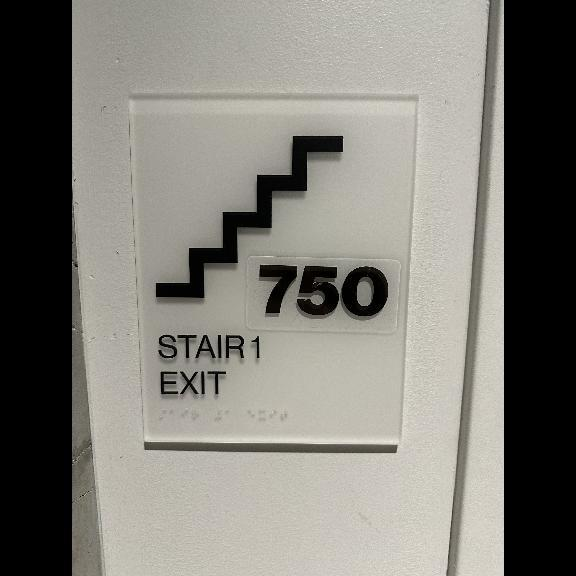
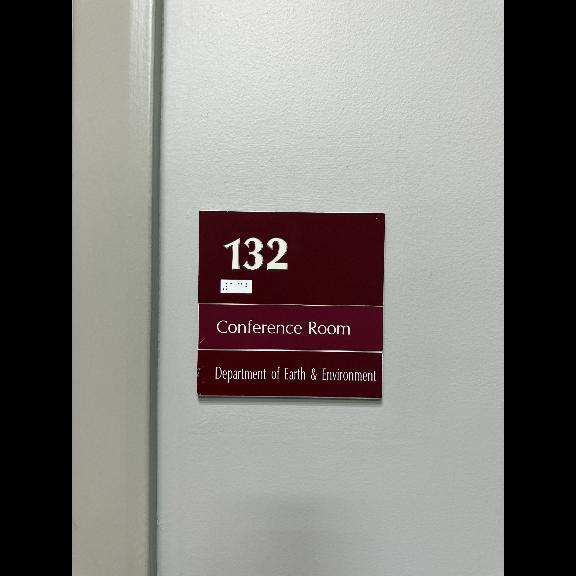

Training Epoch 5/10: 100%|██████████| 95/95 [02:28<00:00,  1.57s/it]


Average Training Loss: 0.9291087319976405


Validation Epoch 5/10: 100%|██████████| 27/27 [00:21<00:00,  1.29it/s]


Average Validation Loss: 1.2239184158819694


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response
failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.



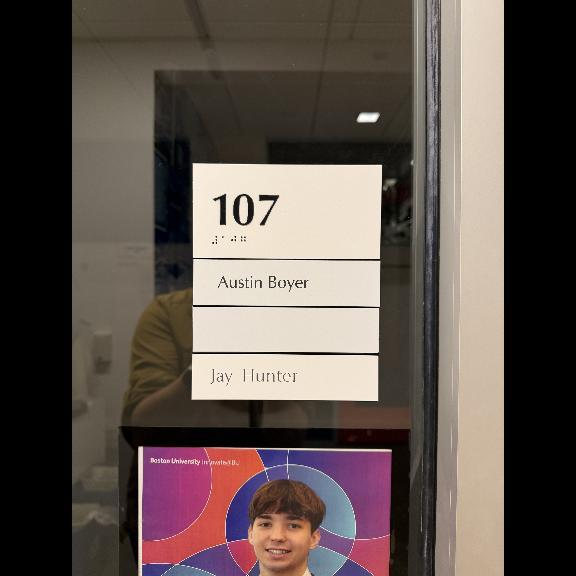
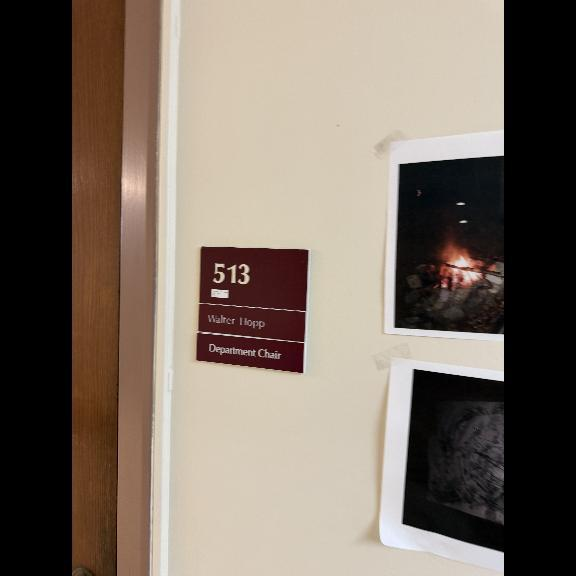
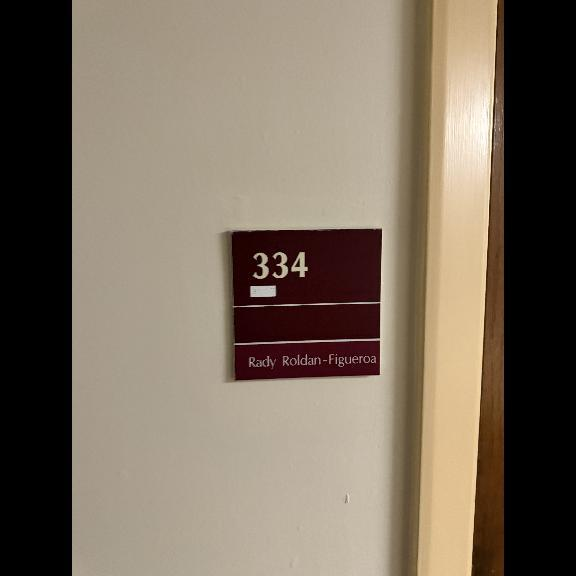
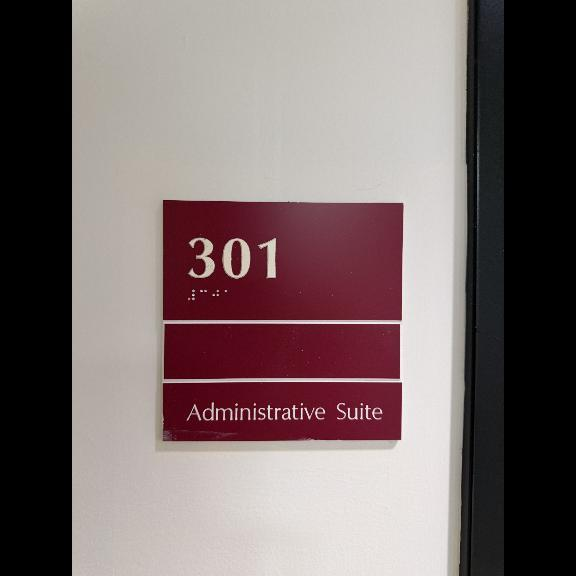
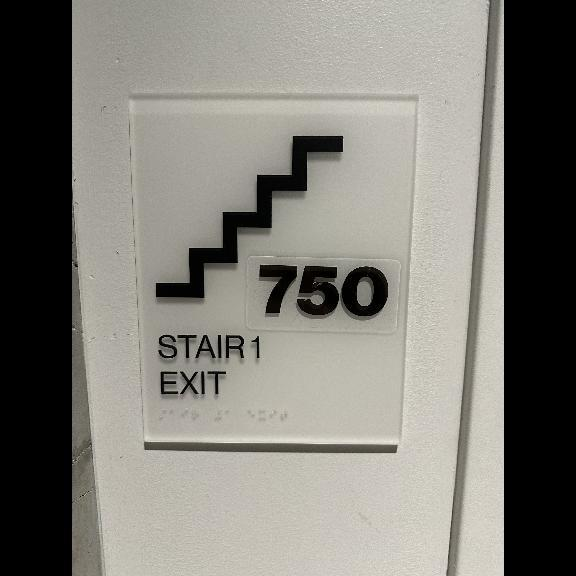
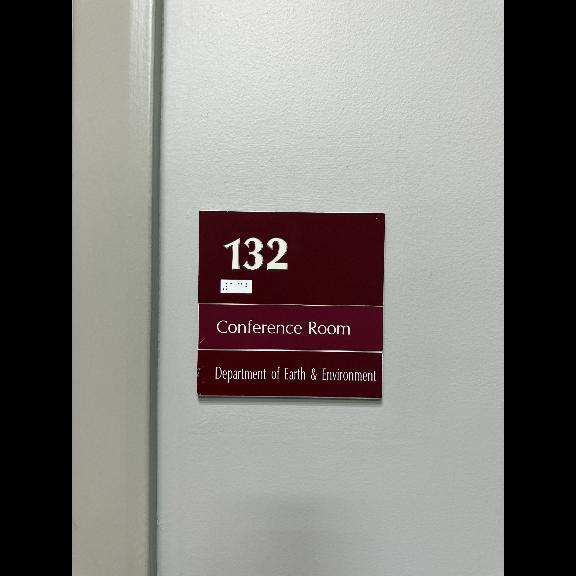

Training Epoch 6/10: 100%|██████████| 95/95 [02:28<00:00,  1.56s/it]


Average Training Loss: 0.9025580371681012


Validation Epoch 6/10: 100%|██████████| 27/27 [00:20<00:00,  1.29it/s]


Average Validation Loss: 1.2746615167017337


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response
failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.



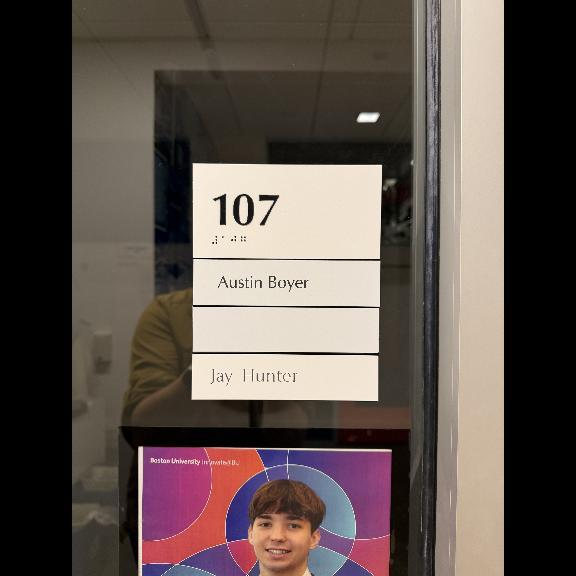
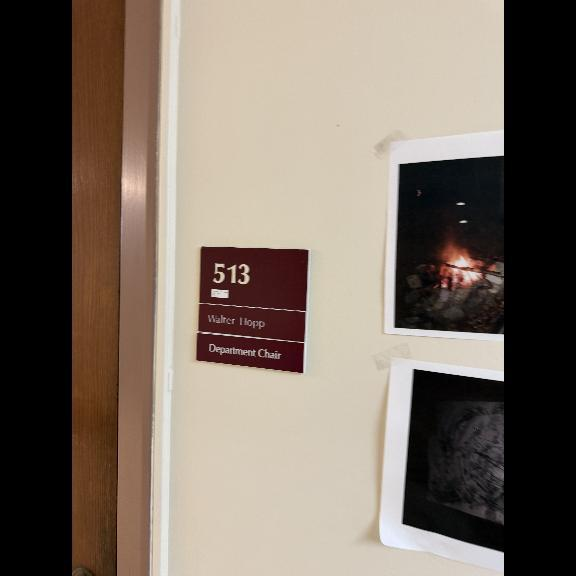
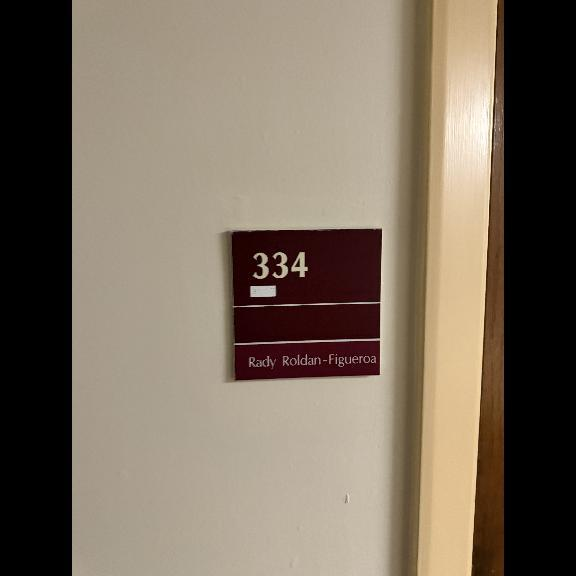
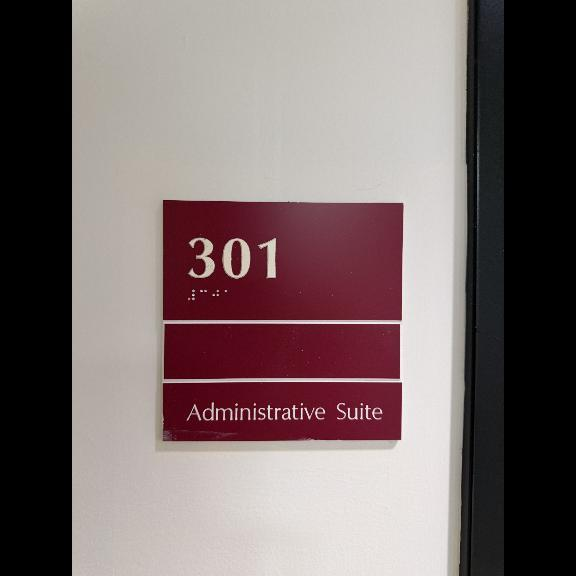
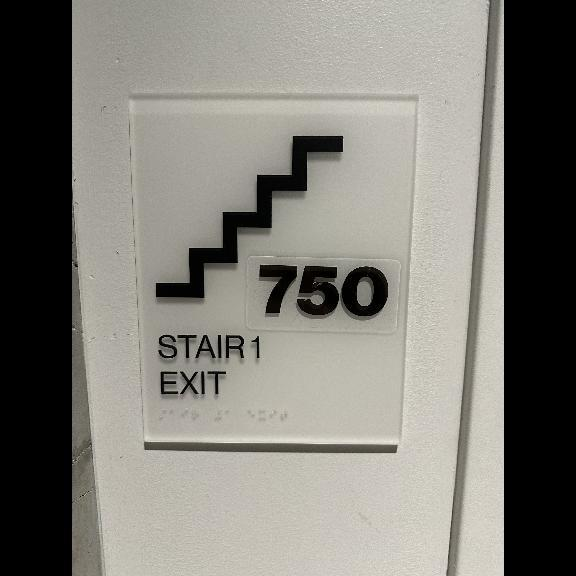
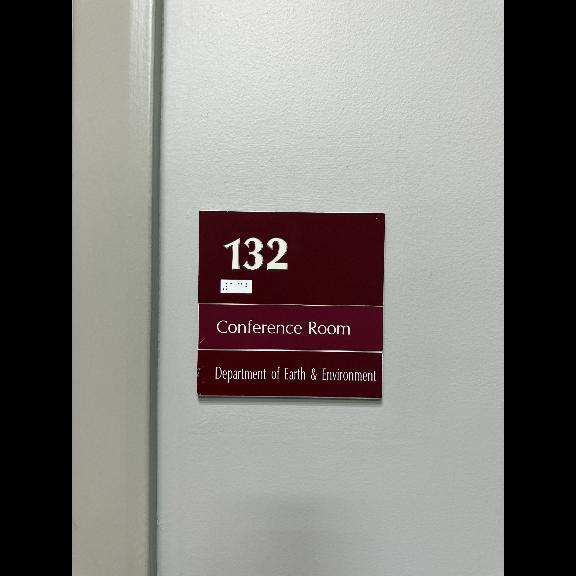

Training Epoch 7/10: 100%|██████████| 95/95 [02:28<00:00,  1.57s/it]


Average Training Loss: 0.8724158061178107


Validation Epoch 7/10: 100%|██████████| 27/27 [00:21<00:00,  1.29it/s]


Average Validation Loss: 1.2830640806092157


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response
failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.



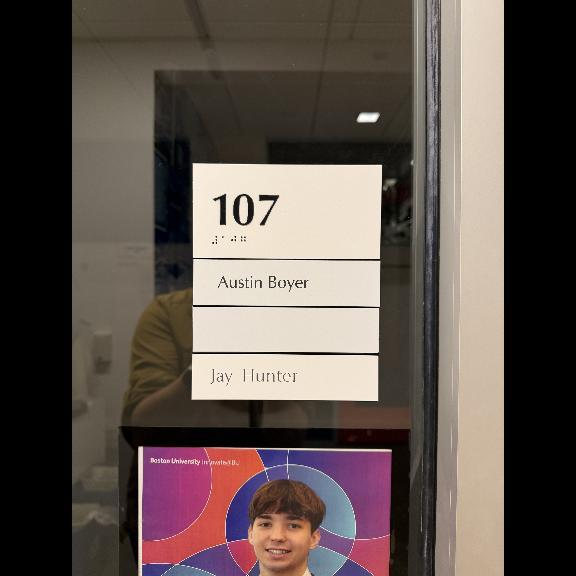
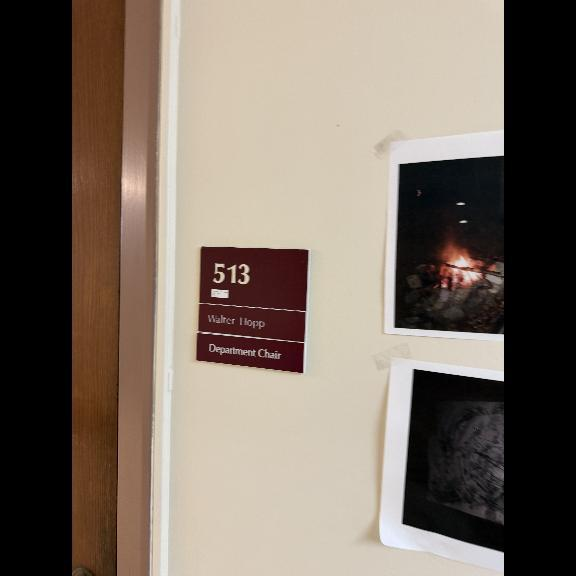
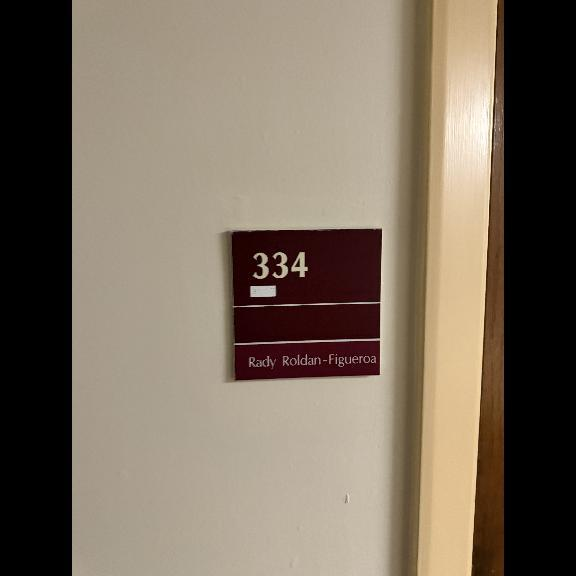
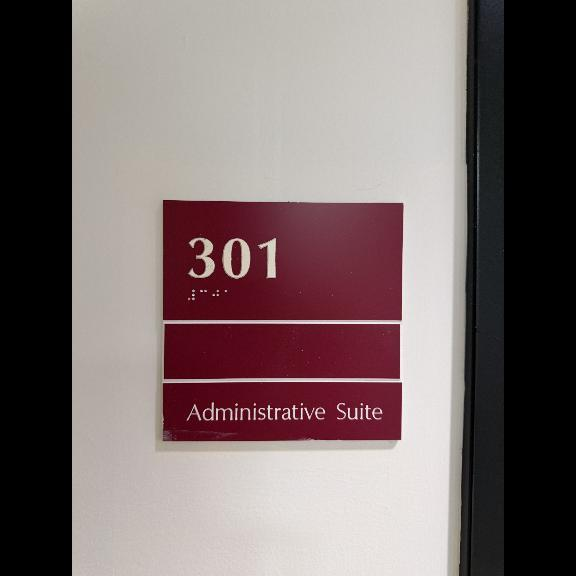
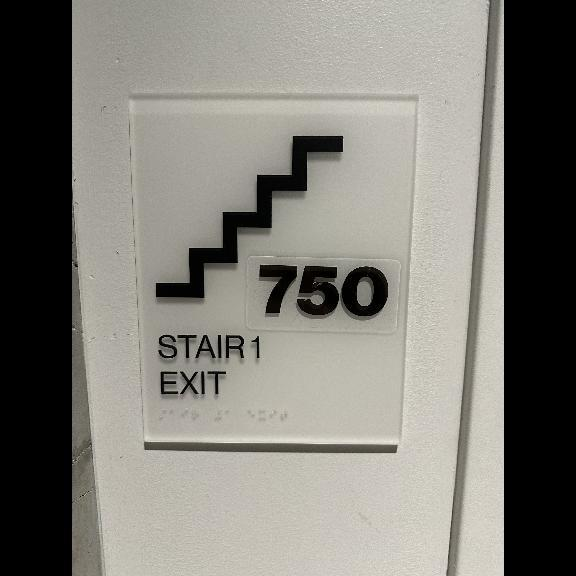
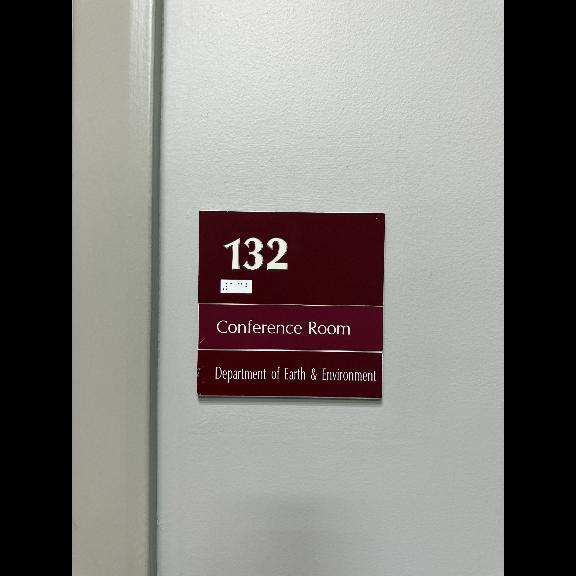

Training Epoch 8/10: 100%|██████████| 95/95 [02:28<00:00,  1.57s/it]


Average Training Loss: 0.8553347336618524


Validation Epoch 8/10: 100%|██████████| 27/27 [00:21<00:00,  1.28it/s]


Average Validation Loss: 1.3079335512938324


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response
failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.



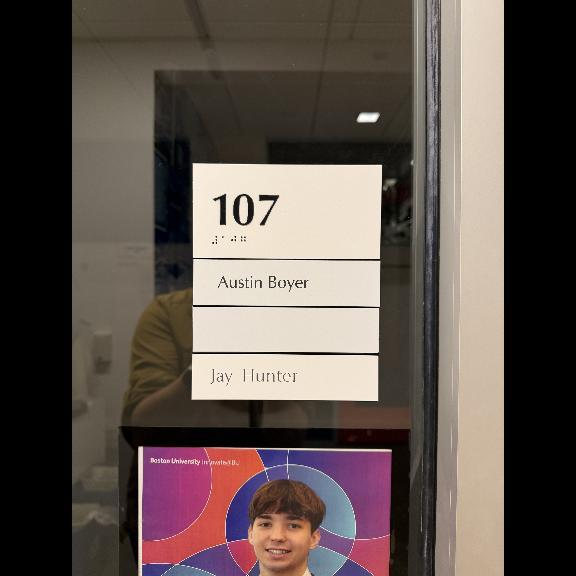
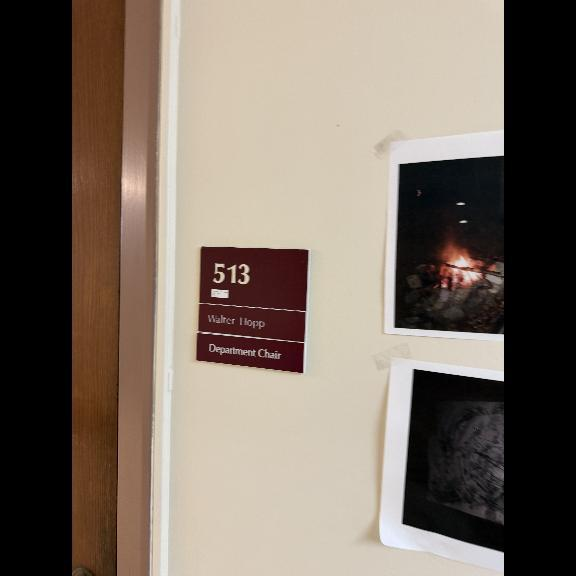
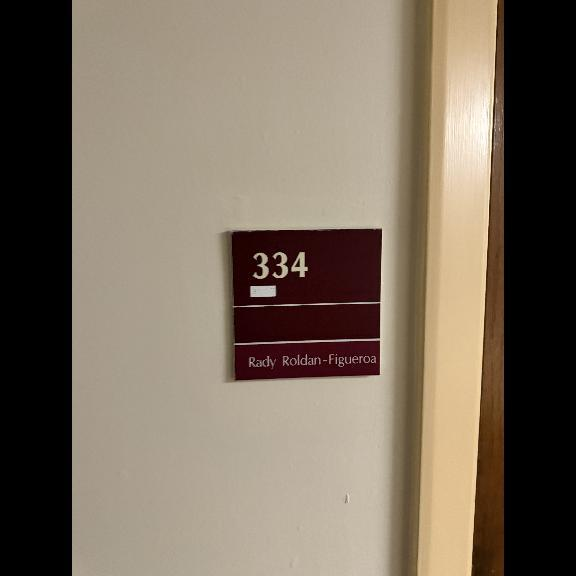
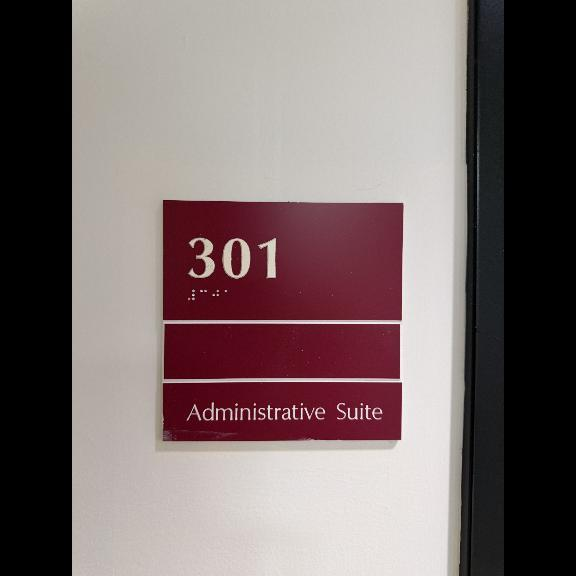
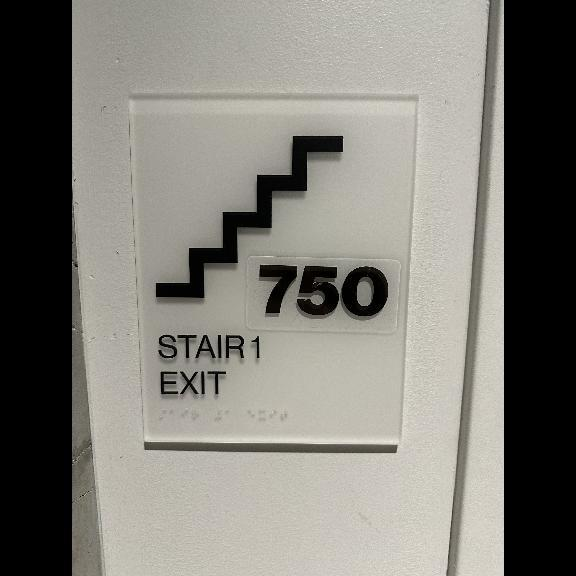
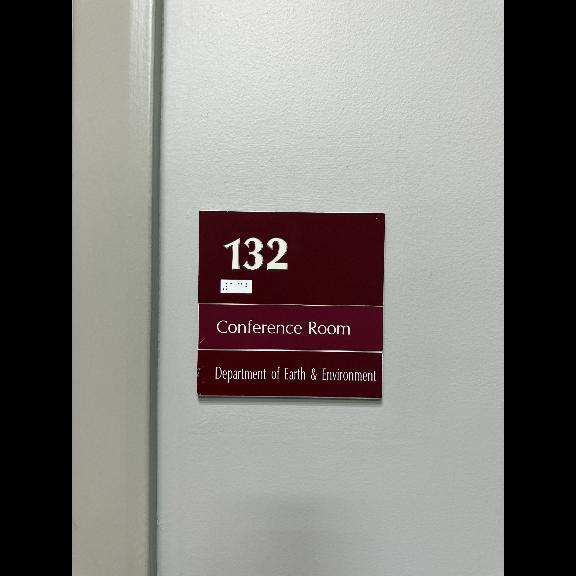

Training Epoch 9/10: 100%|██████████| 95/95 [02:28<00:00,  1.57s/it]


Average Training Loss: 0.8430803606384679


Validation Epoch 9/10: 100%|██████████| 27/27 [00:21<00:00,  1.28it/s]


Average Validation Loss: 1.3217434264995434


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response
failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.



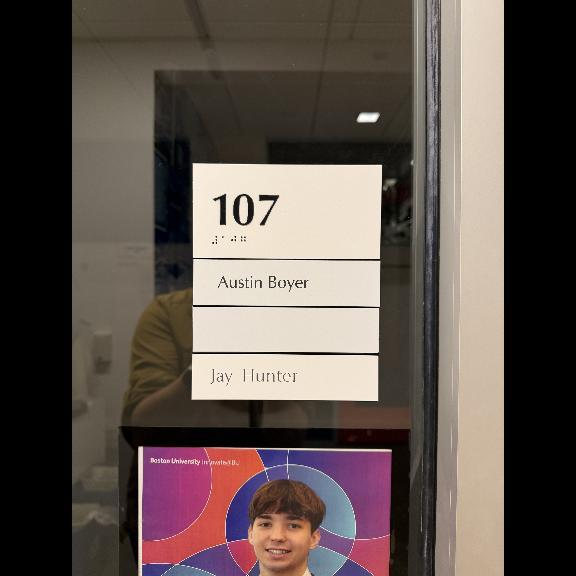
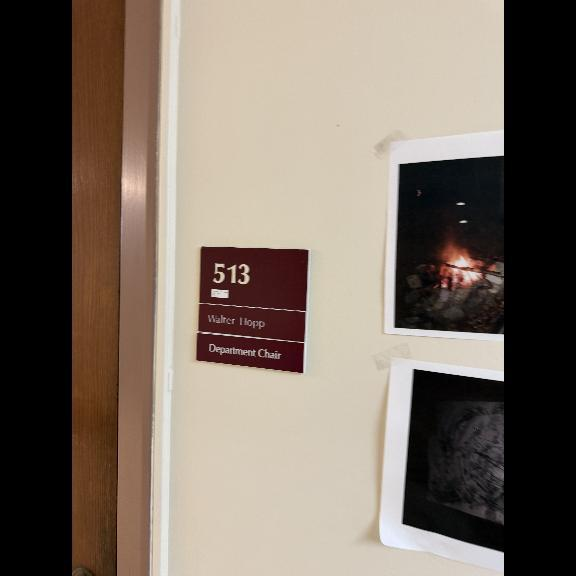
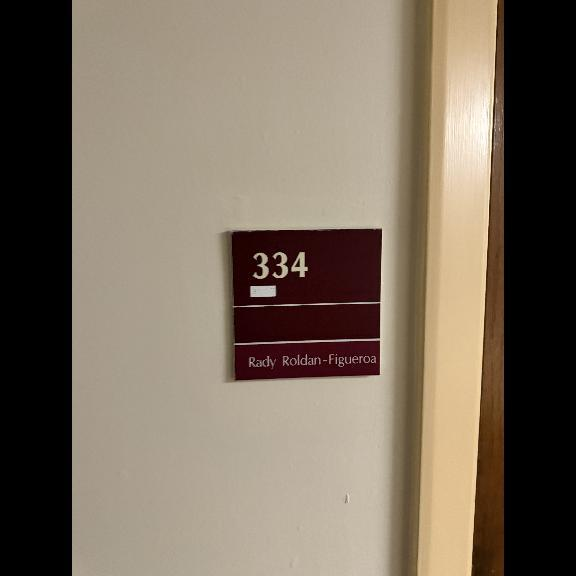
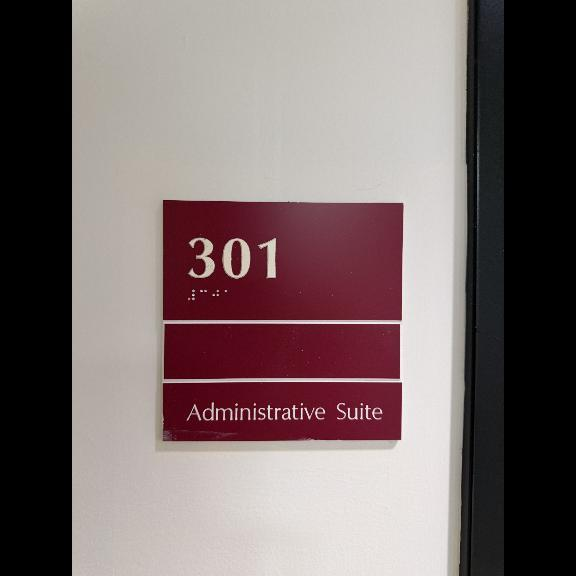
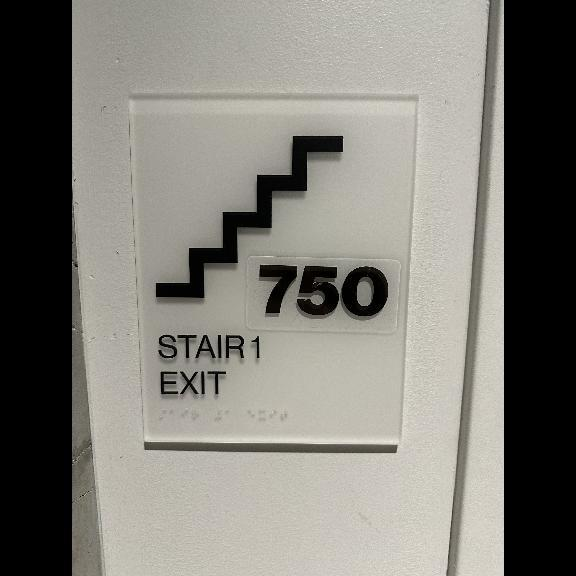
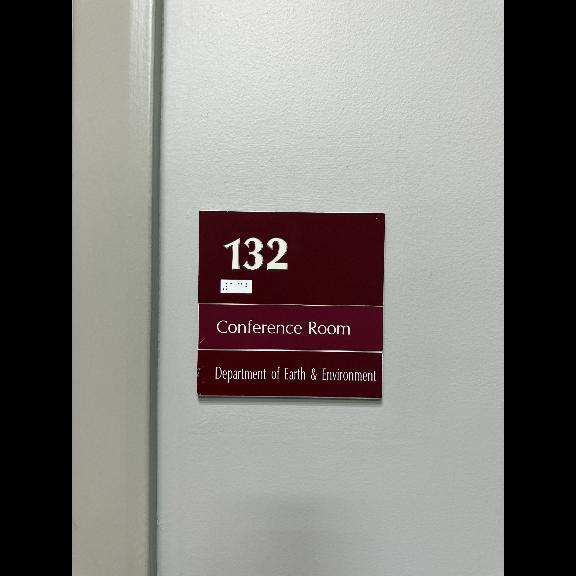

Training Epoch 10/10: 100%|██████████| 95/95 [02:28<00:00,  1.57s/it]


Average Training Loss: 0.8241476648732236


Validation Epoch 10/10: 100%|██████████| 27/27 [00:21<00:00,  1.28it/s]


Average Validation Loss: 1.3289751829924408


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response
failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.



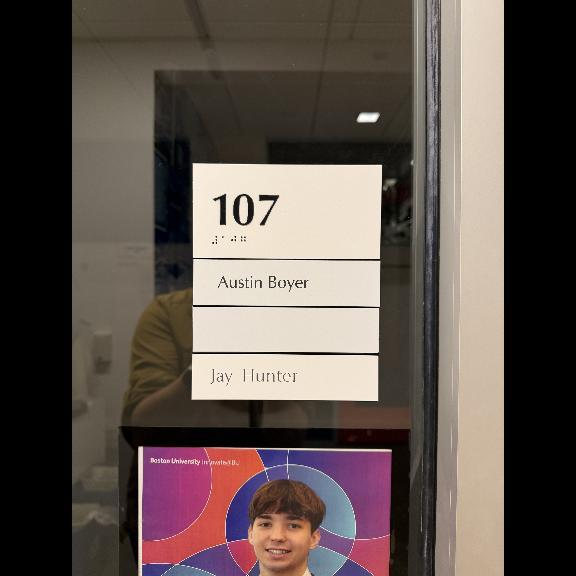
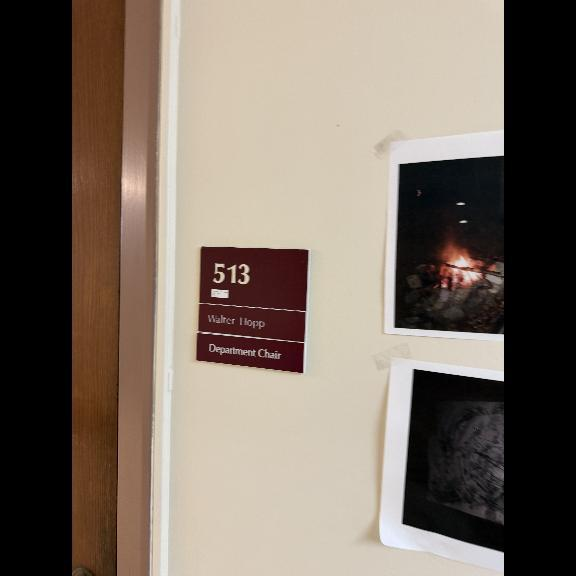
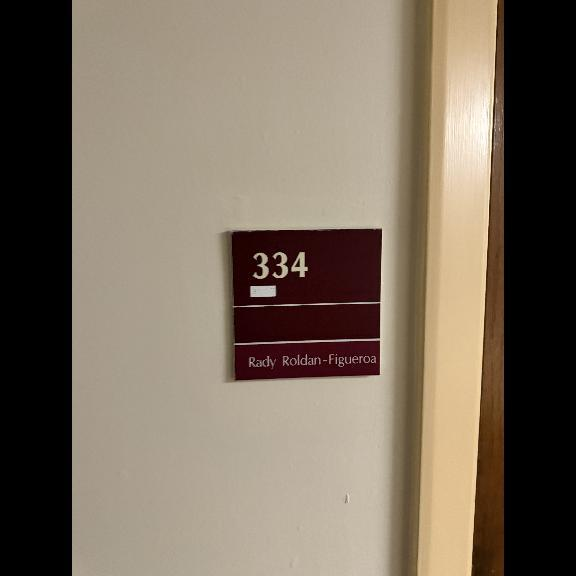
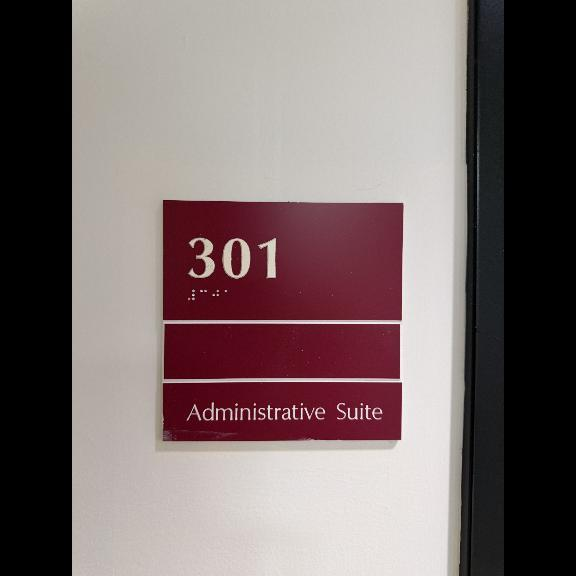
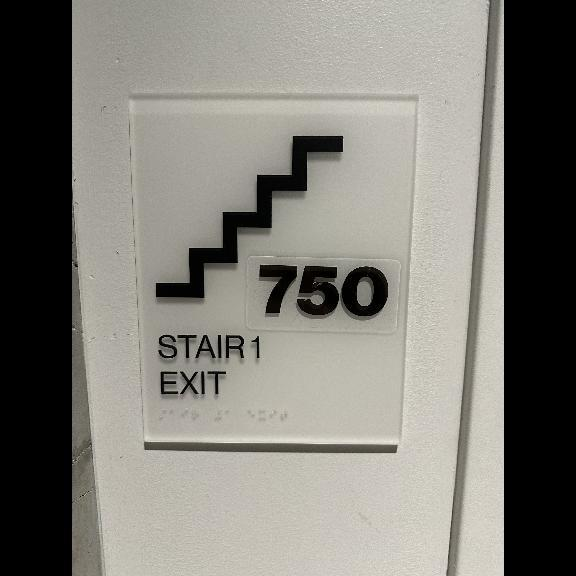
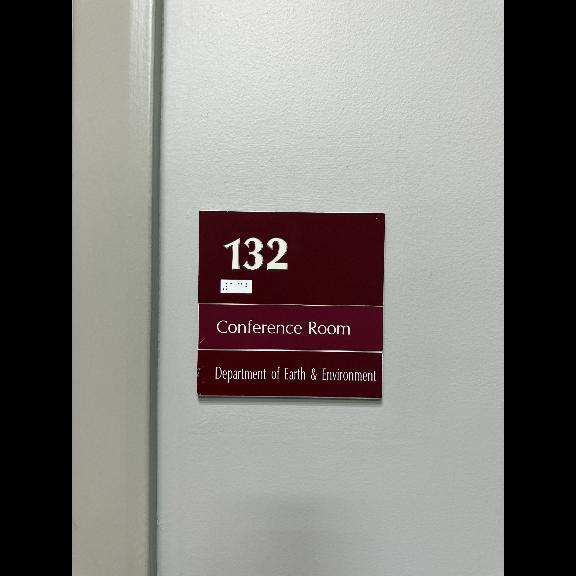

from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response
failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.



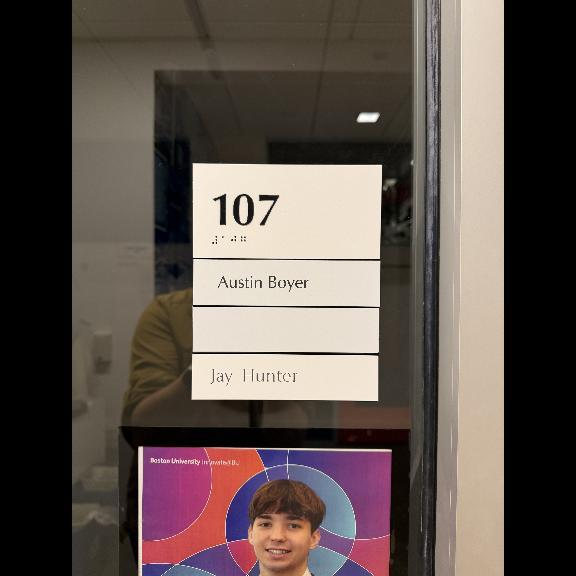
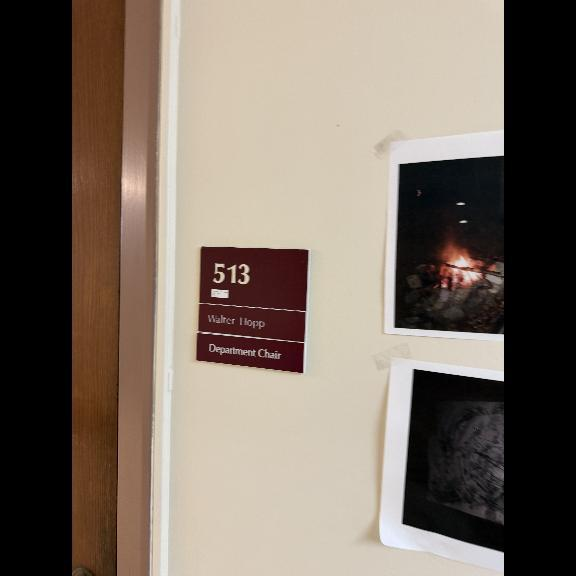
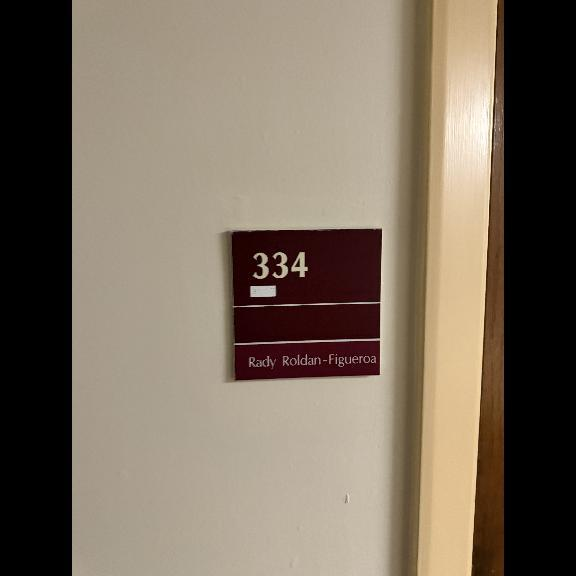
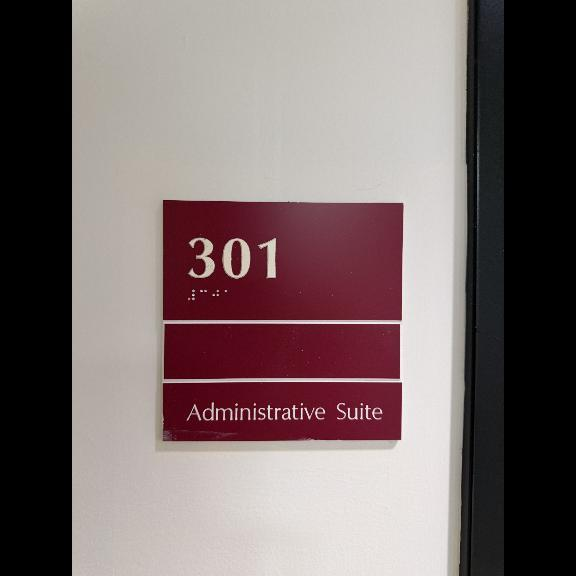
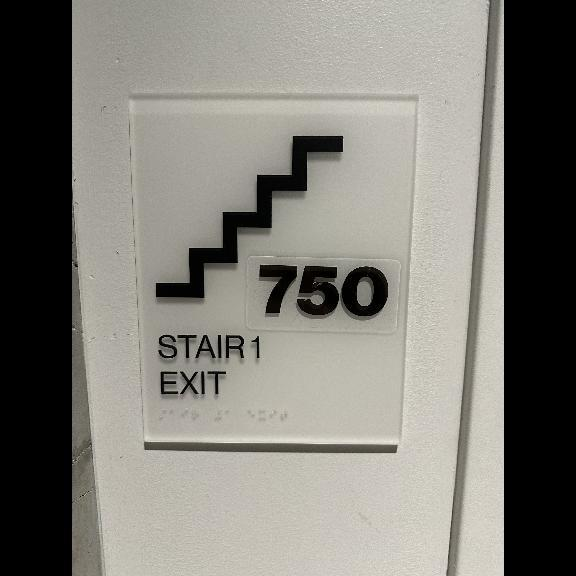
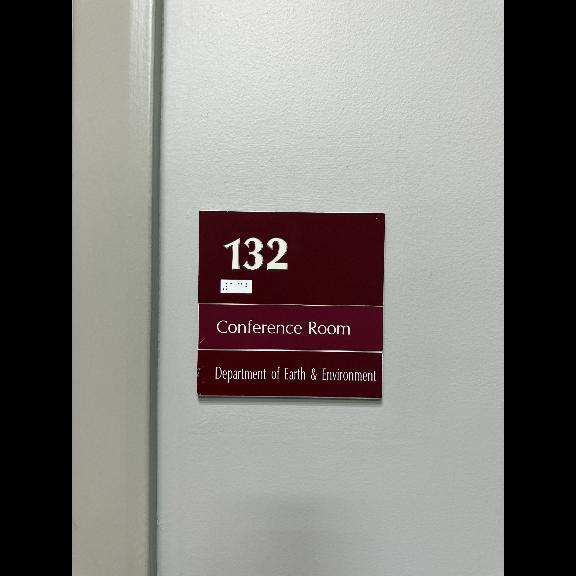

Training Epoch 1/10: 100%|██████████| 95/95 [02:28<00:00,  1.57s/it]


Average Training Loss: 1.1326487754520618


Validation Epoch 1/10: 100%|██████████| 27/27 [00:21<00:00,  1.28it/s]


Average Validation Loss: 1.2738825171082109


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response
failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.



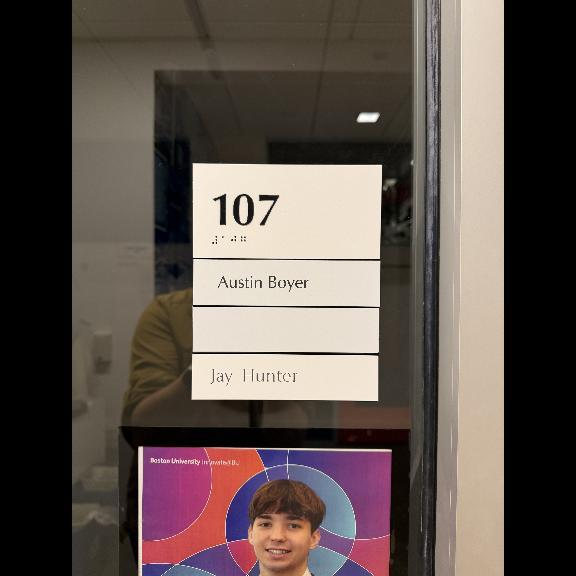
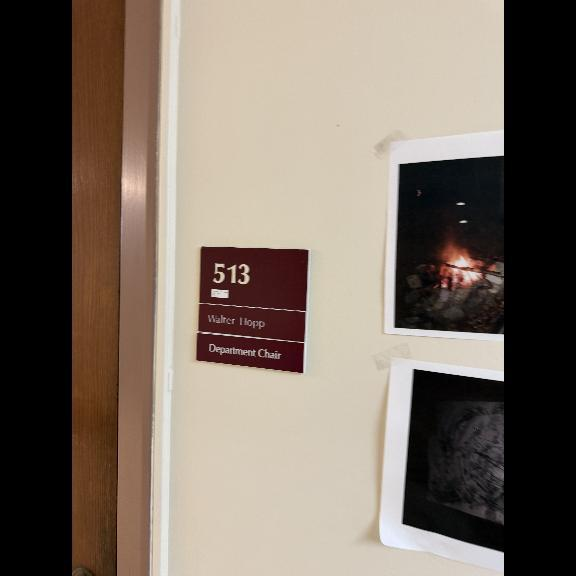
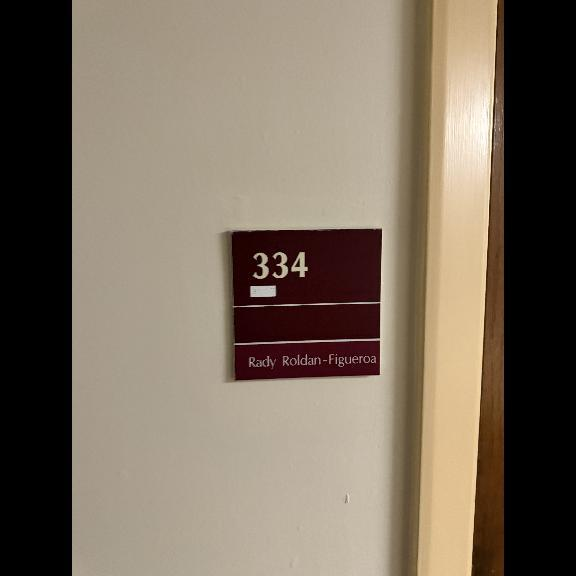
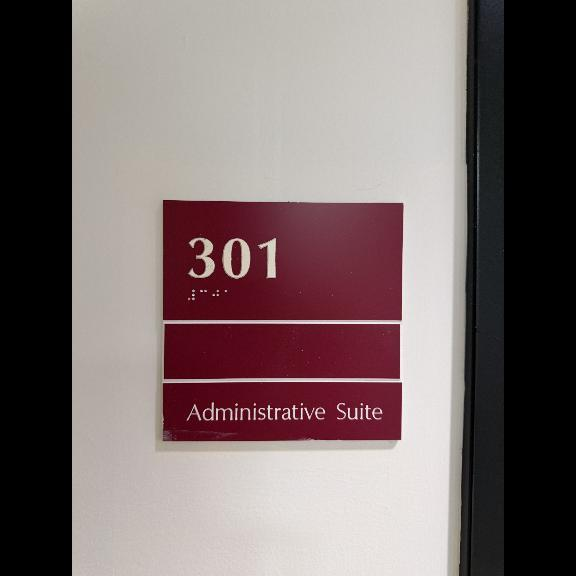
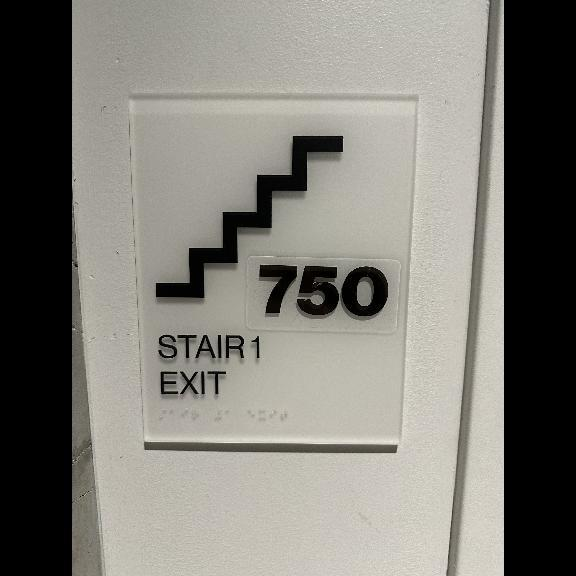
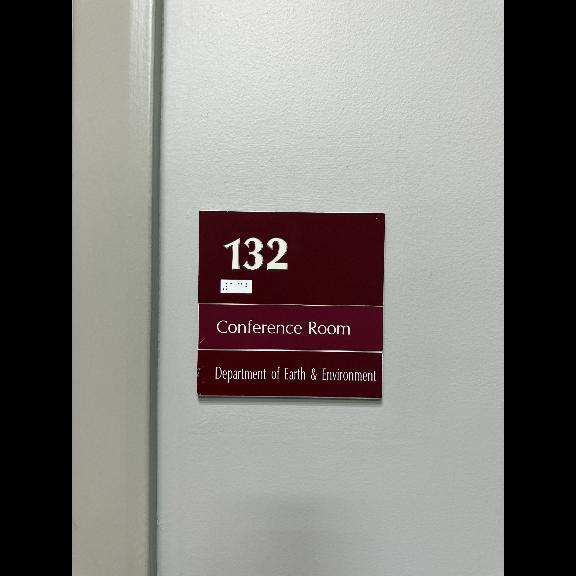

Training Epoch 2/10: 100%|██████████| 95/95 [02:28<00:00,  1.57s/it]


Average Training Loss: 1.0214648654586391


Validation Epoch 2/10: 100%|██████████| 27/27 [00:21<00:00,  1.28it/s]


Average Validation Loss: 1.2615868316756353


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response
failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.



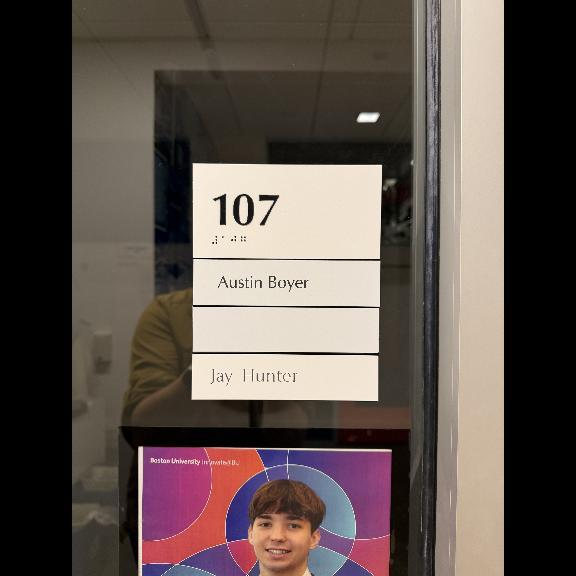
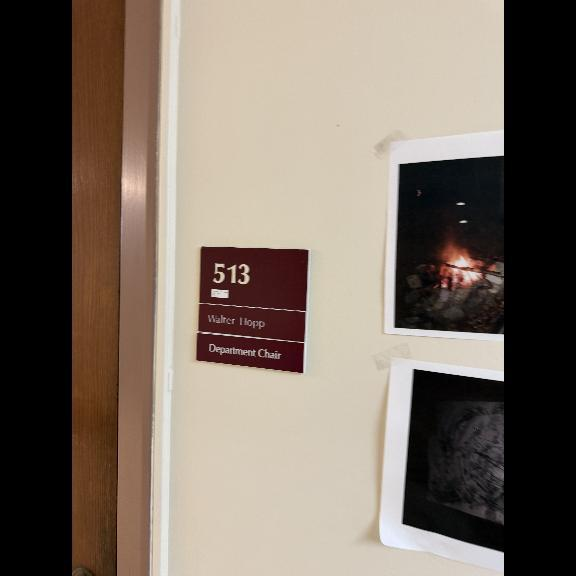
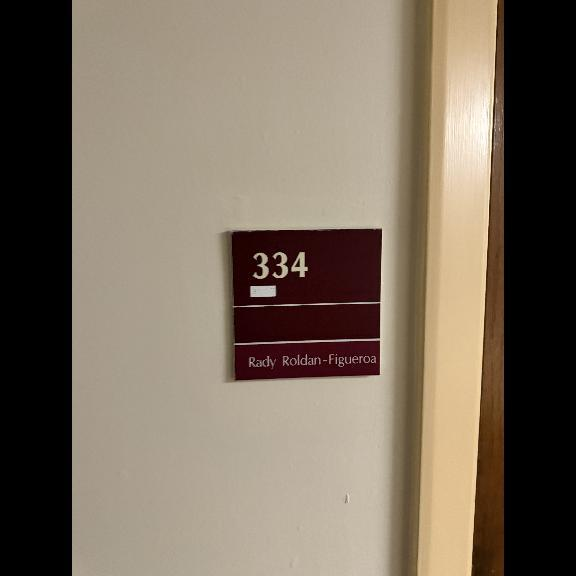
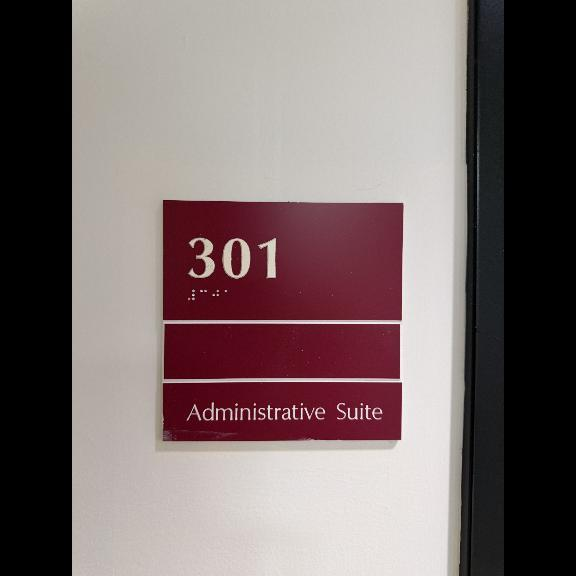
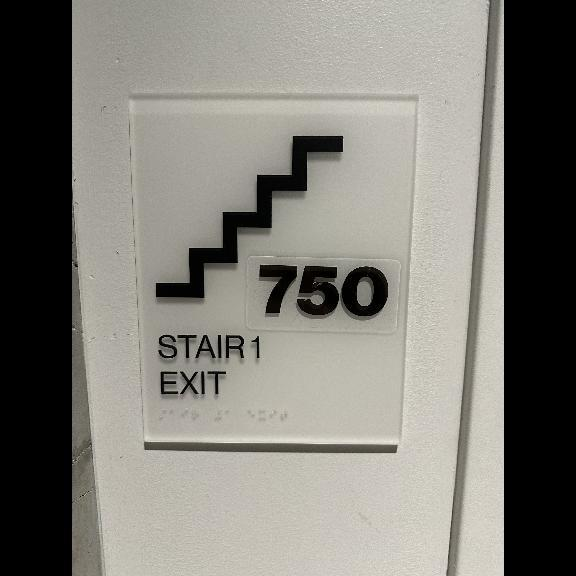
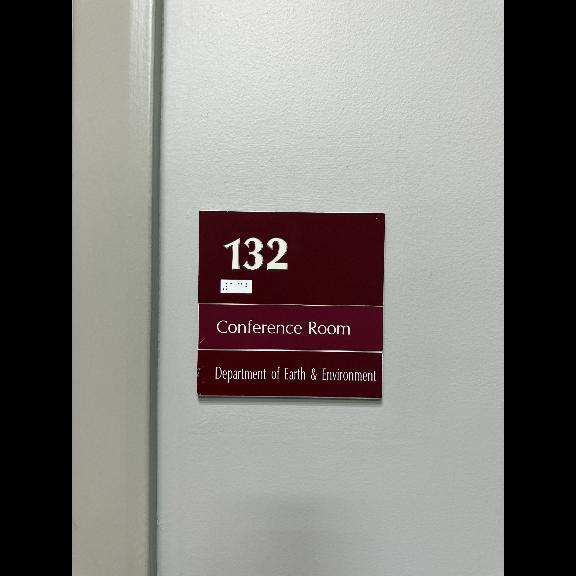

Training Epoch 3/10: 100%|██████████| 95/95 [02:28<00:00,  1.57s/it]


Average Training Loss: 0.9439002783674942


Validation Epoch 3/10: 100%|██████████| 27/27 [00:21<00:00,  1.28it/s]


Average Validation Loss: 1.2978006932470534


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response
failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.



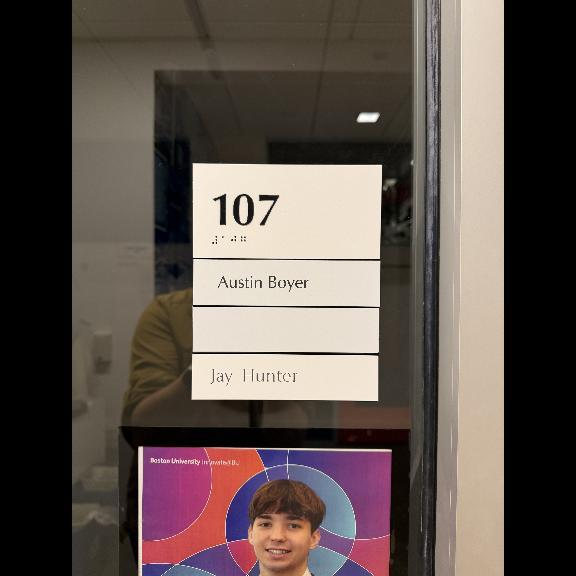
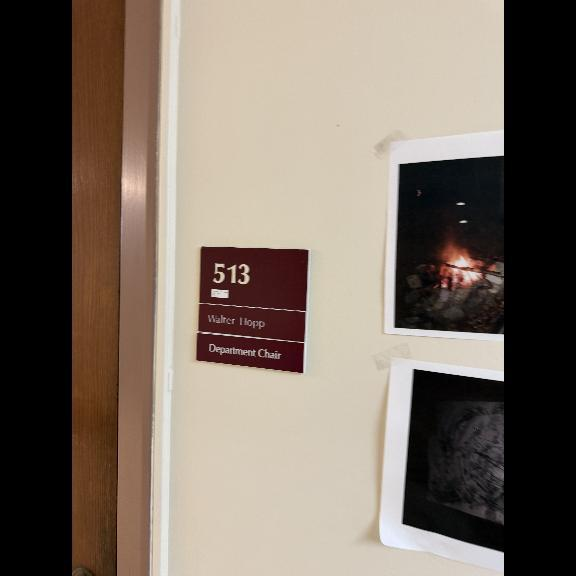
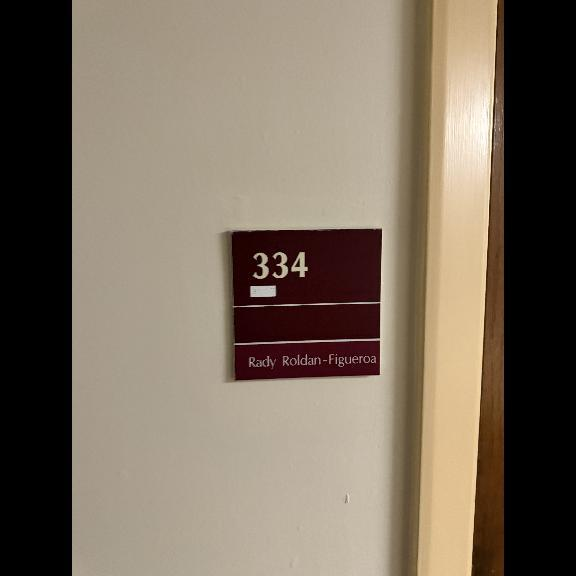
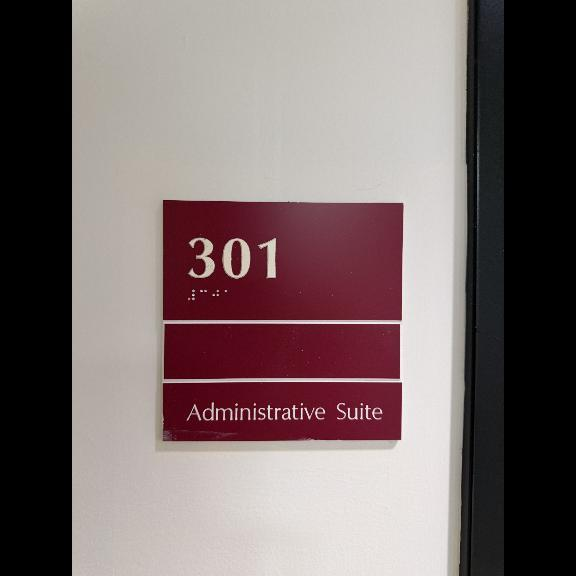
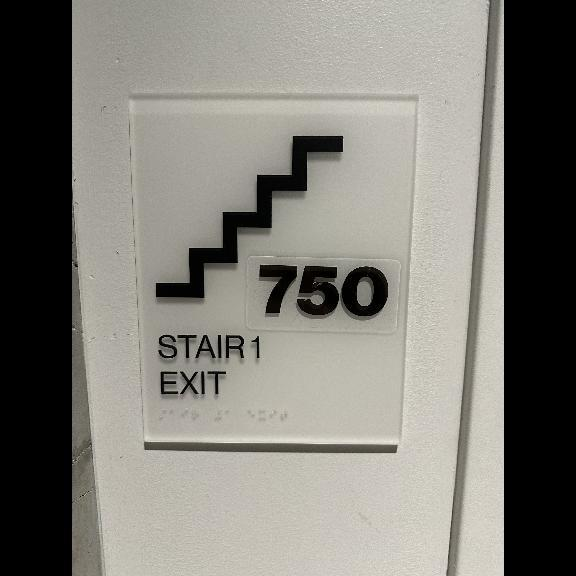
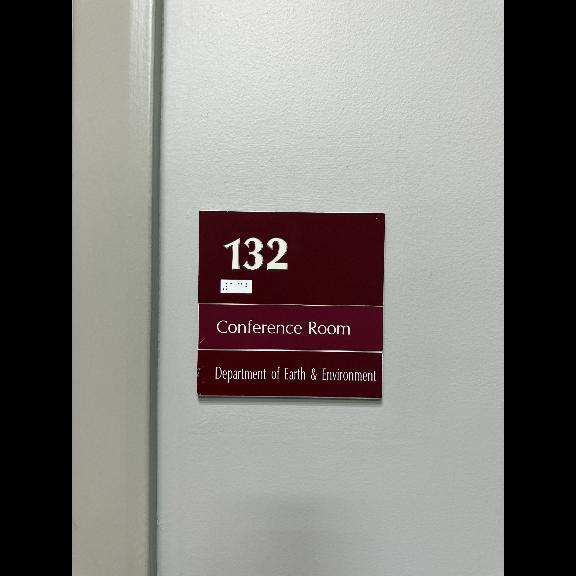

Training Epoch 4/10: 100%|██████████| 95/95 [02:28<00:00,  1.57s/it]


Average Training Loss: 0.8093416835132398


Validation Epoch 4/10: 100%|██████████| 27/27 [00:20<00:00,  1.29it/s]


Average Validation Loss: 1.4501760866906908


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response
failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.



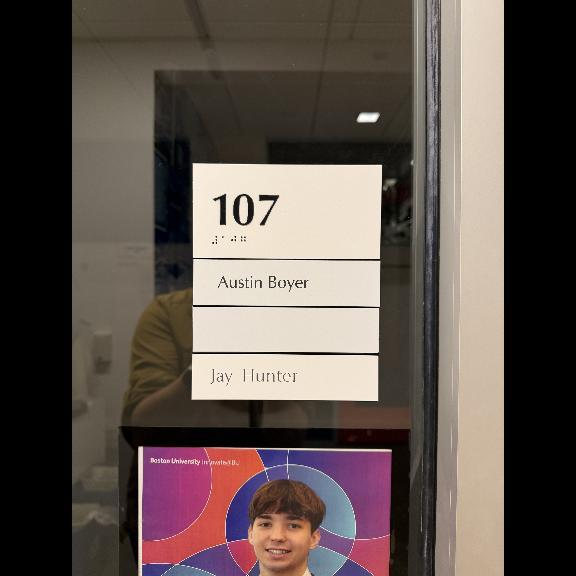
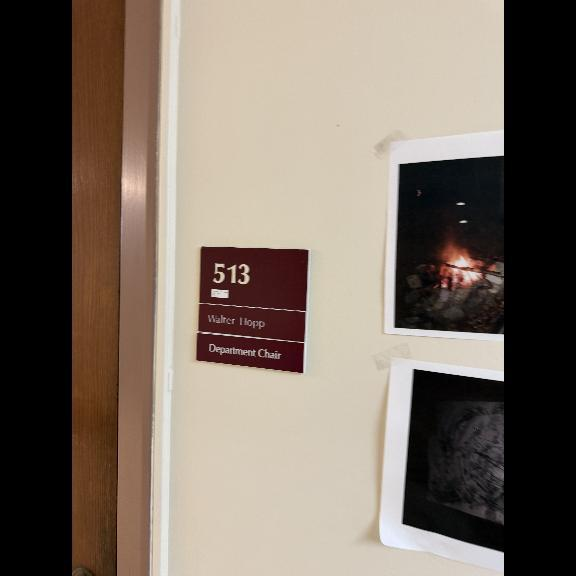
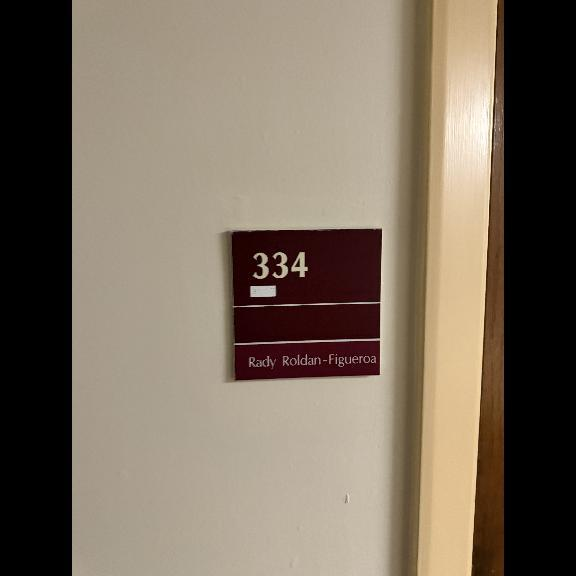
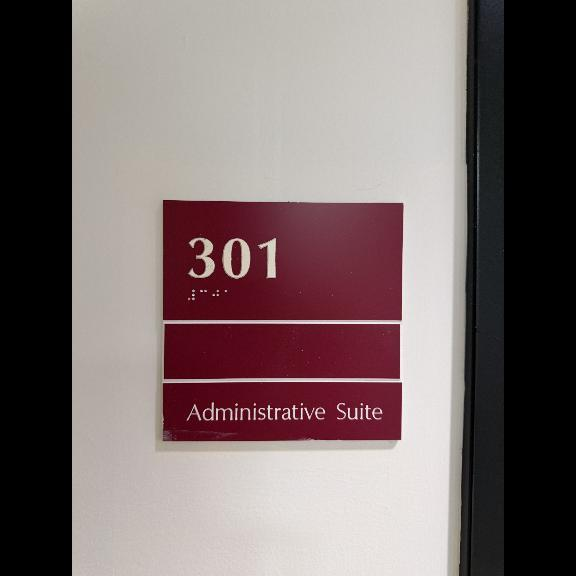
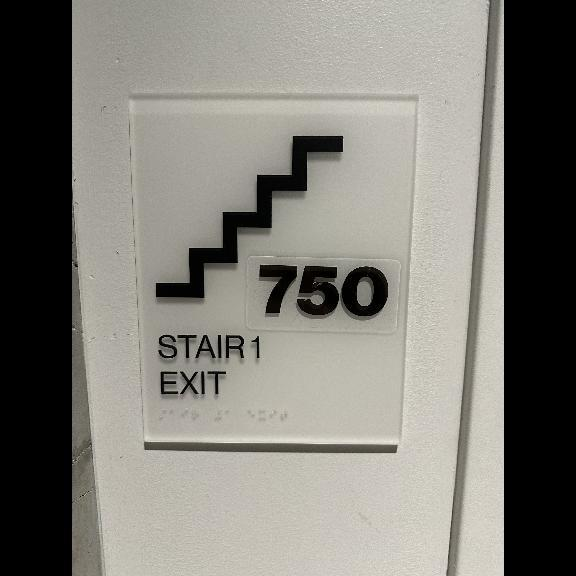
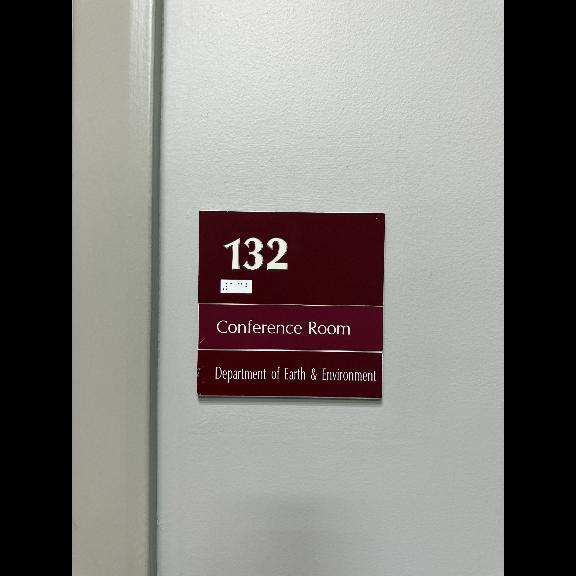

Training Epoch 5/10: 100%|██████████| 95/95 [02:28<00:00,  1.57s/it]


Average Training Loss: 0.7097498184756229


Validation Epoch 5/10: 100%|██████████| 27/27 [00:21<00:00,  1.28it/s]


Average Validation Loss: 1.611859416520154


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response
failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.



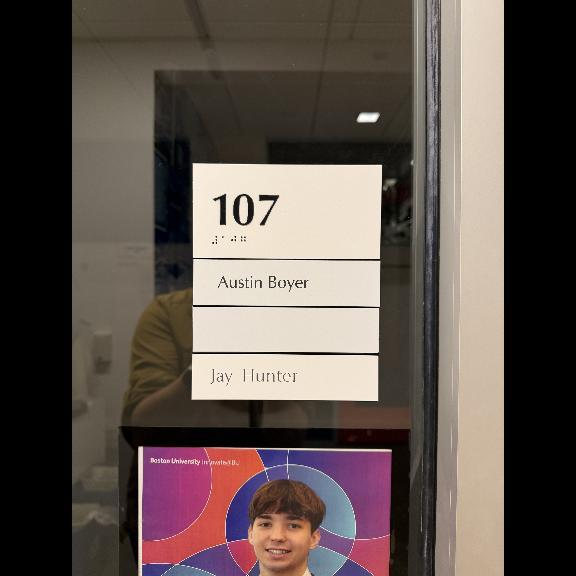
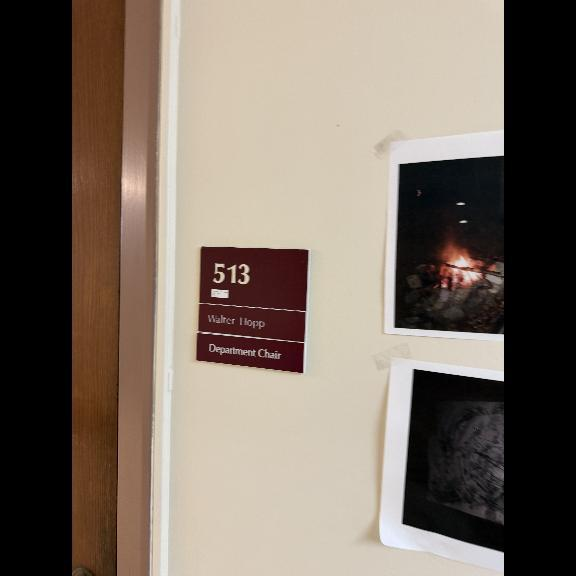
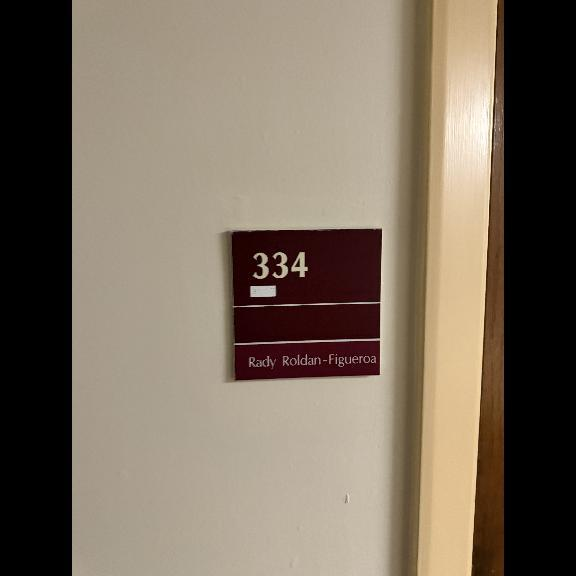
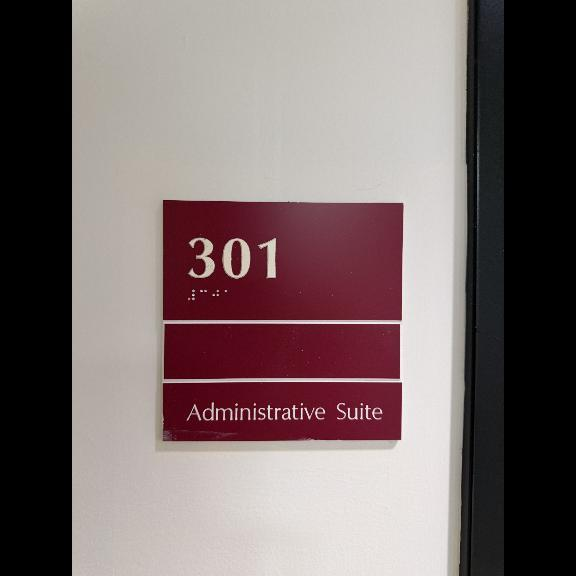
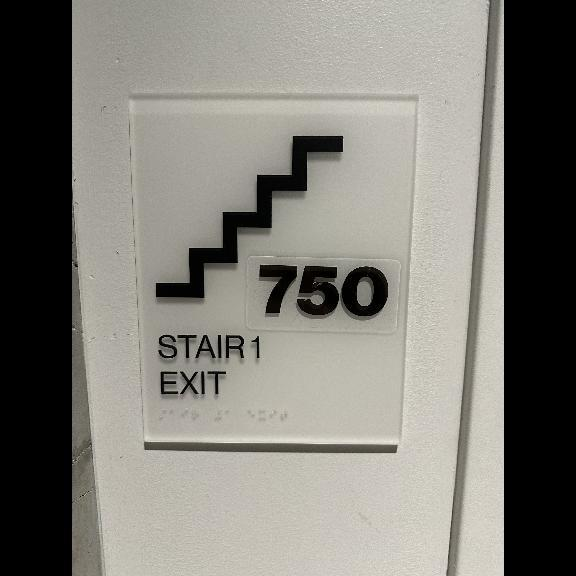
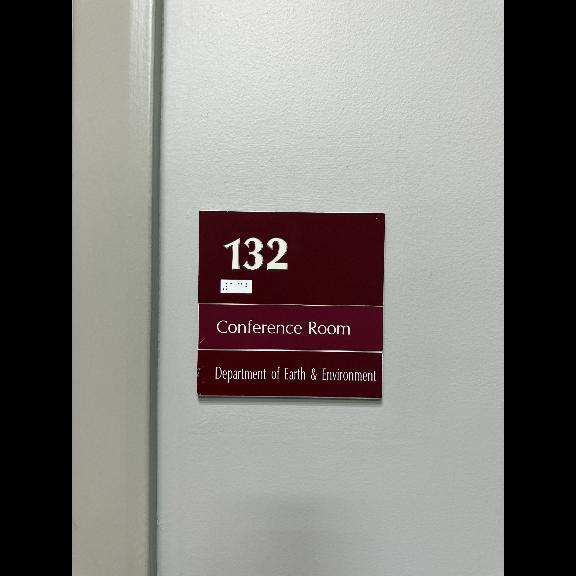

Training Epoch 6/10: 100%|██████████| 95/95 [02:28<00:00,  1.57s/it]


Average Training Loss: 0.6020115720598321


Validation Epoch 6/10: 100%|██████████| 27/27 [00:20<00:00,  1.29it/s]


Average Validation Loss: 1.6982586979866028


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response
failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.



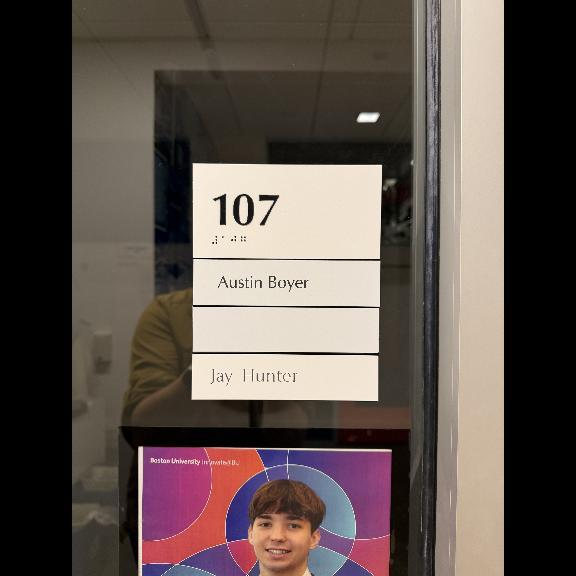
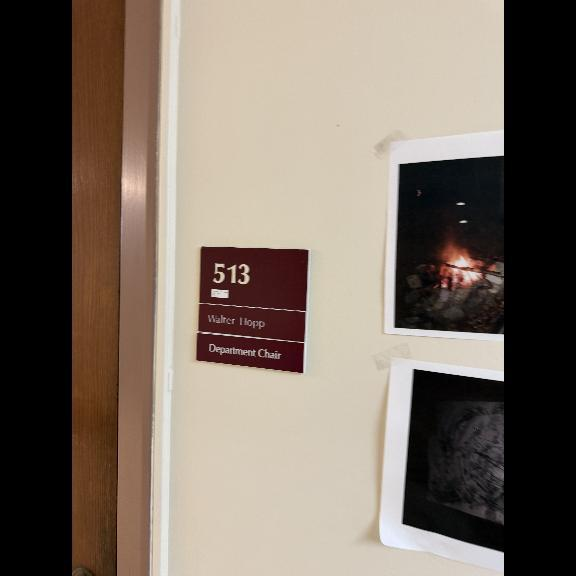
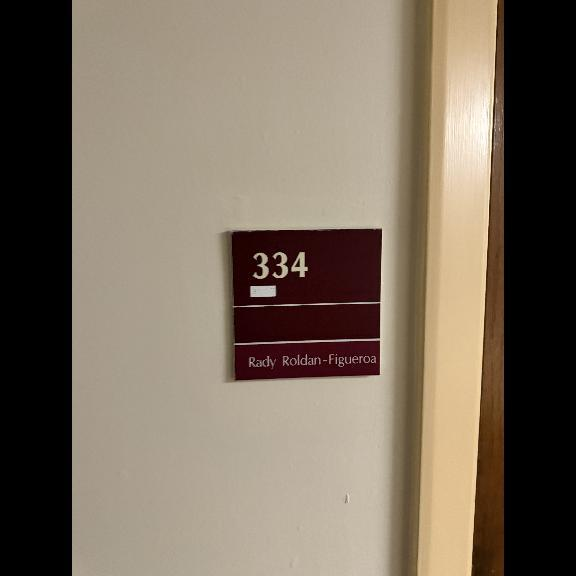
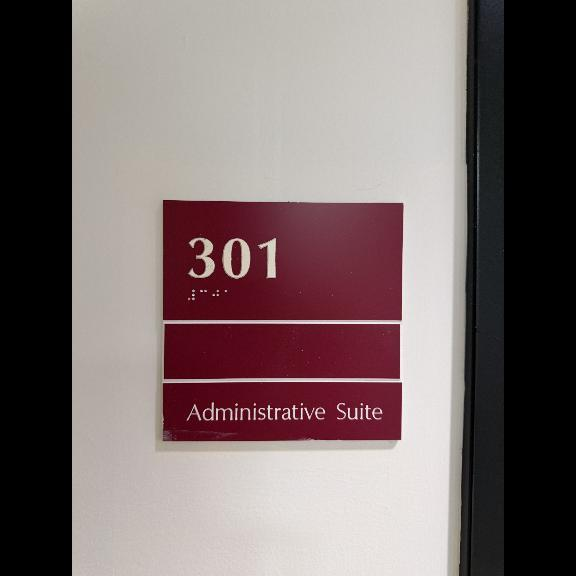
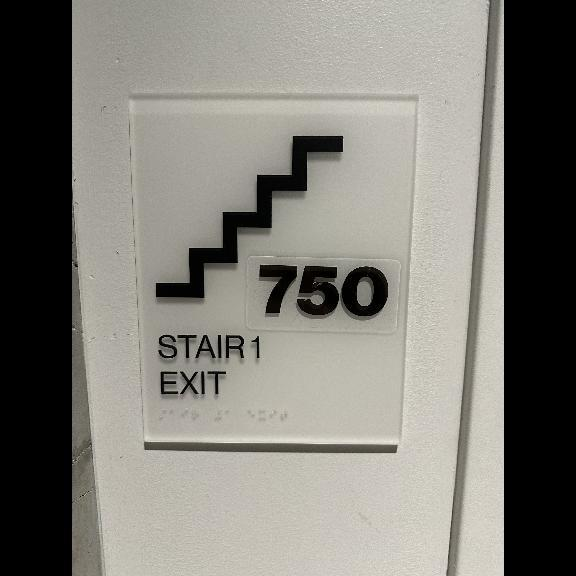
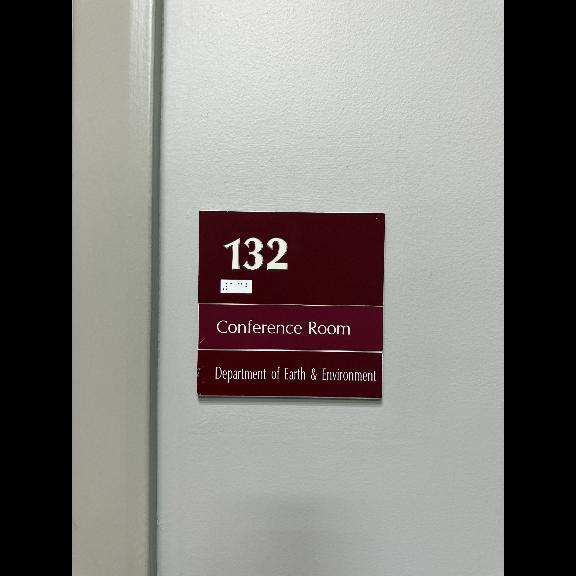

Training Epoch 7/10: 100%|██████████| 95/95 [02:28<00:00,  1.56s/it]


Average Training Loss: 0.4930594819156747


Validation Epoch 7/10: 100%|██████████| 27/27 [00:20<00:00,  1.29it/s]


Average Validation Loss: 1.9638979744028162


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response
failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.



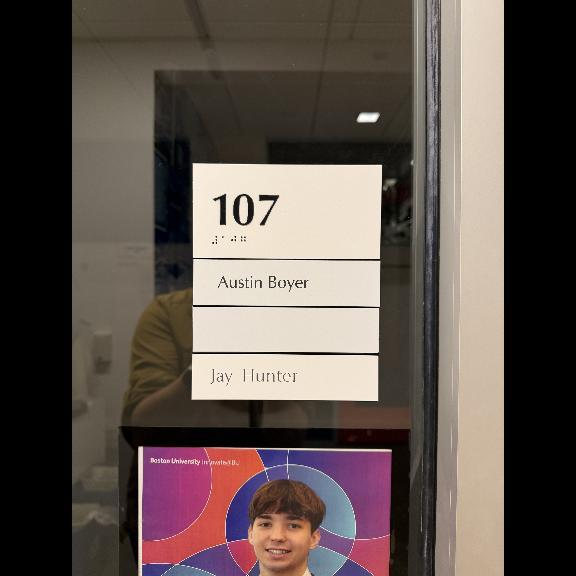
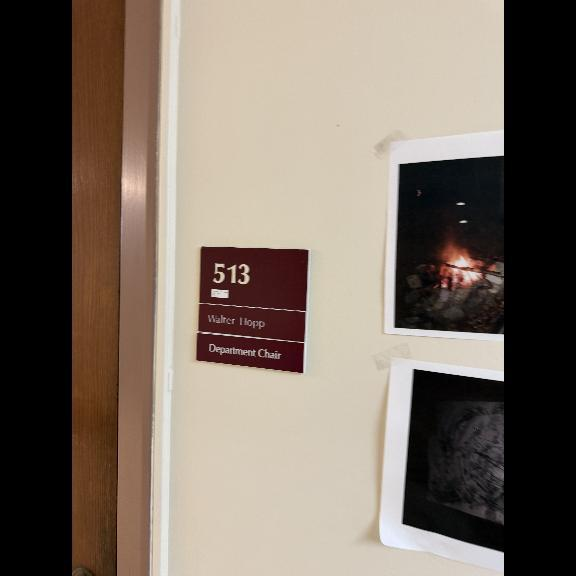
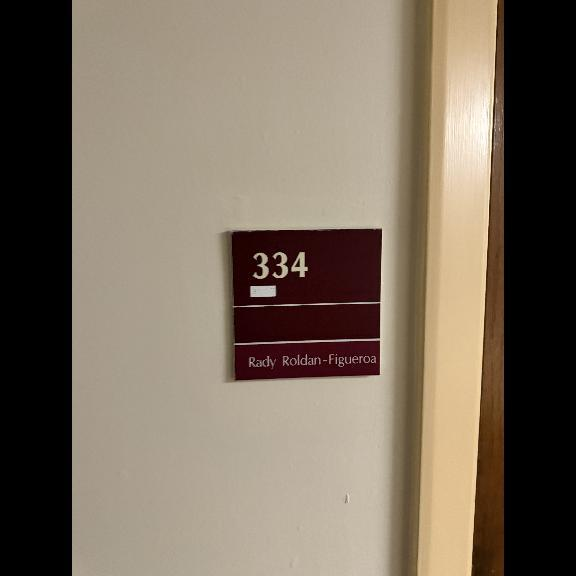
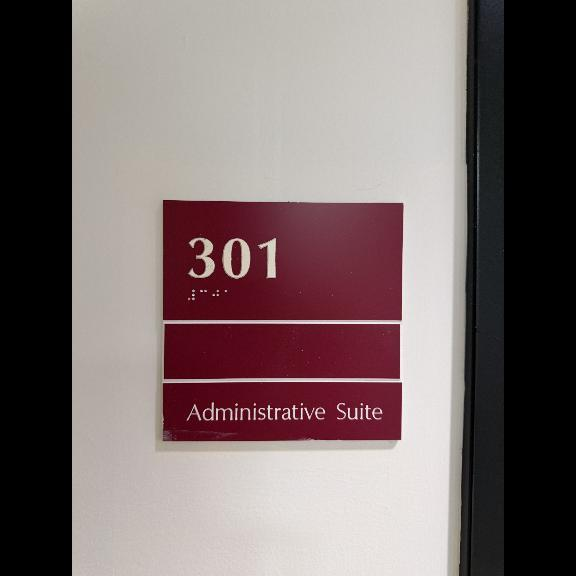
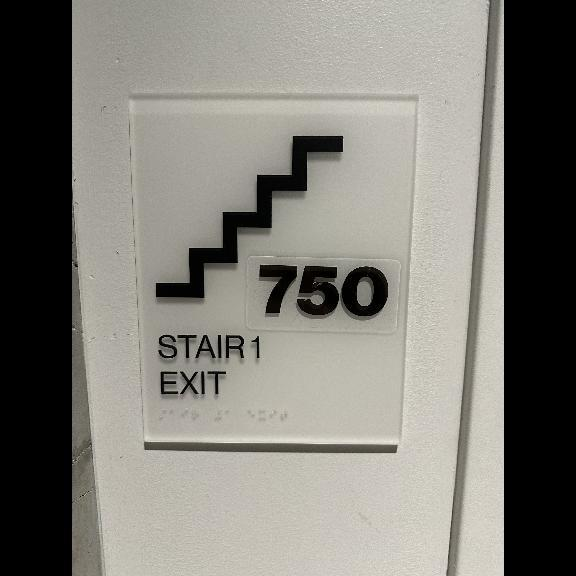
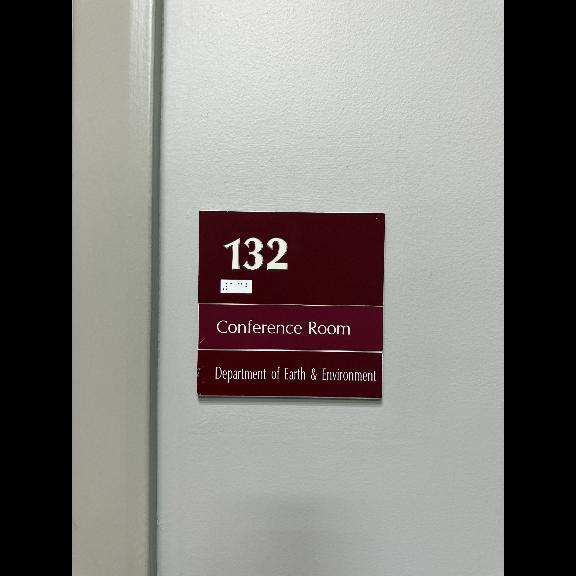

Training Epoch 8/10: 100%|██████████| 95/95 [02:28<00:00,  1.57s/it]


Average Training Loss: 0.37165876540698506


Validation Epoch 8/10: 100%|██████████| 27/27 [00:21<00:00,  1.28it/s]


Average Validation Loss: 2.155383485334891


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response
failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.



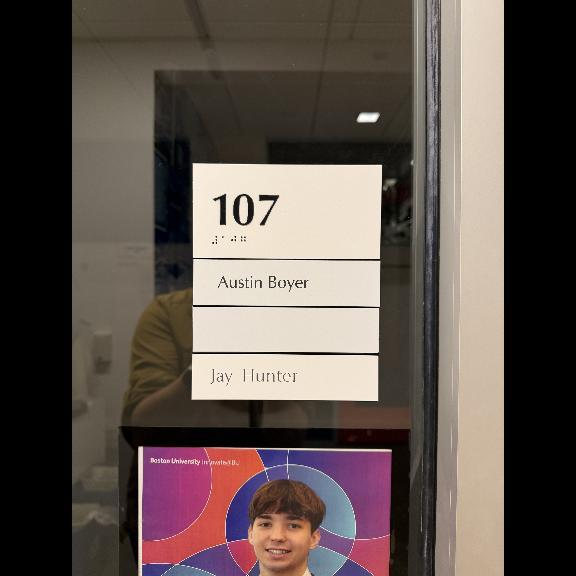
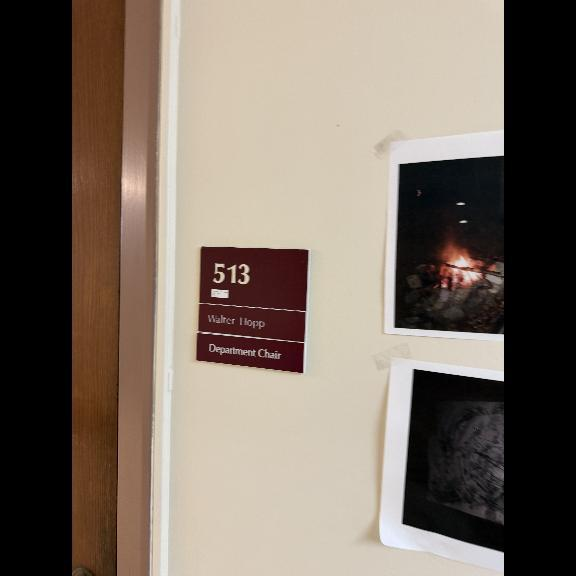
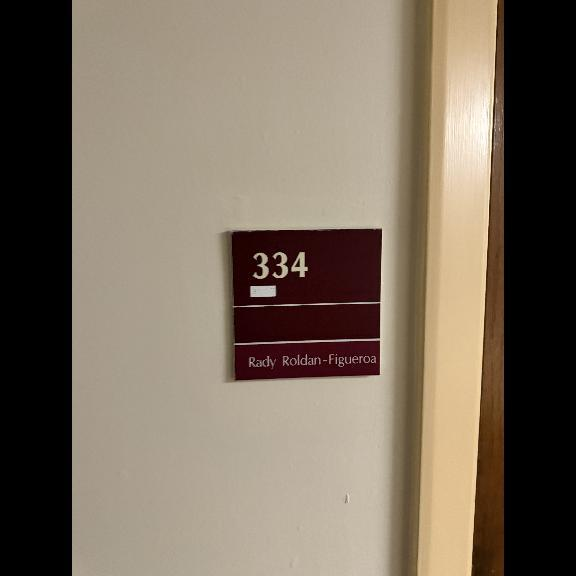
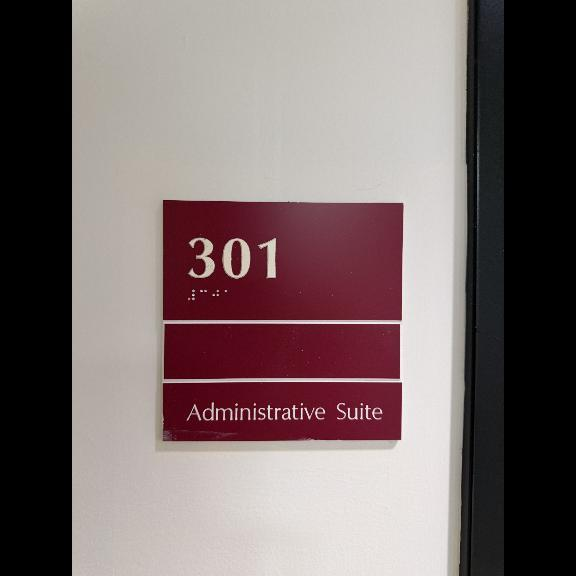
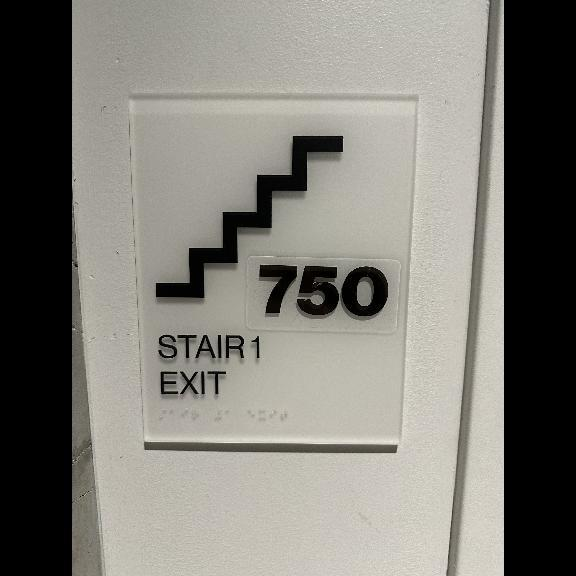
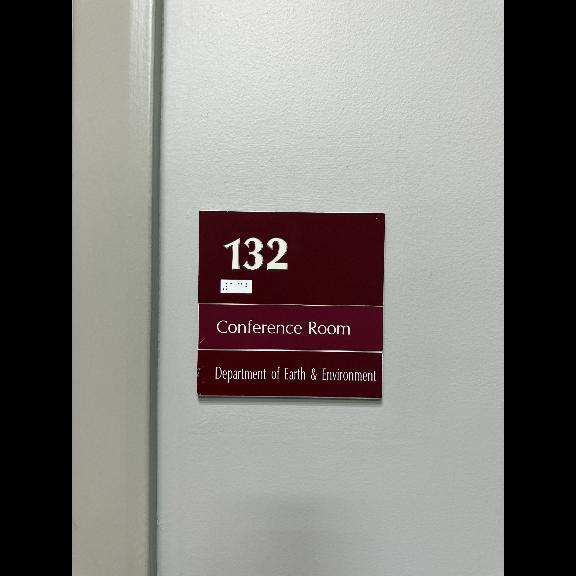

Training Epoch 9/10: 100%|██████████| 95/95 [02:29<00:00,  1.57s/it]


Average Training Loss: 0.28448220852174255


Validation Epoch 9/10: 100%|██████████| 27/27 [00:21<00:00,  1.28it/s]


Average Validation Loss: 2.3935737433256925


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response
failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.



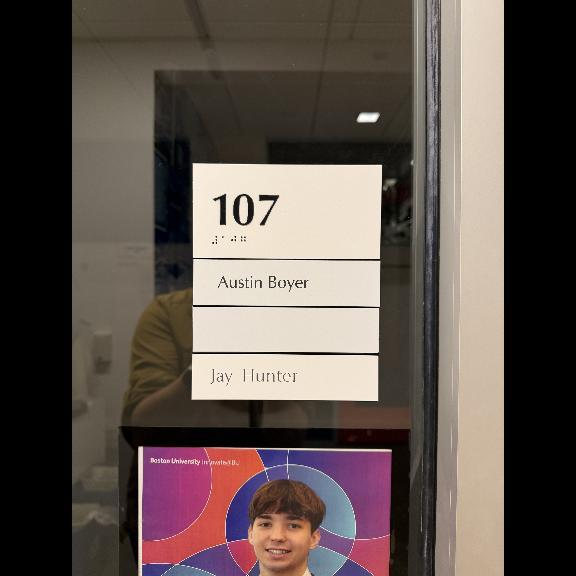
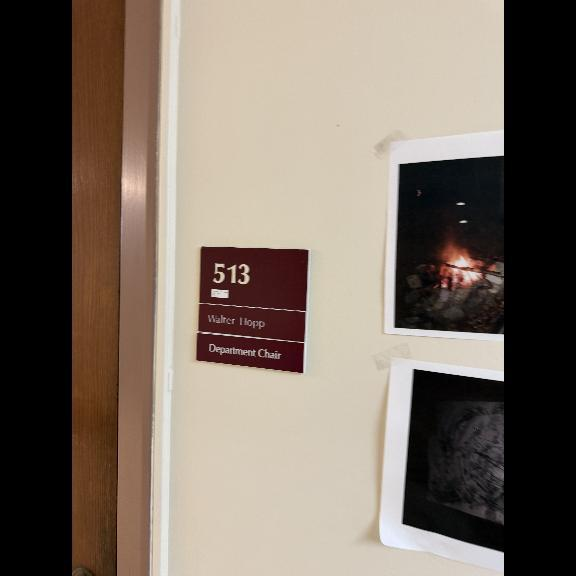
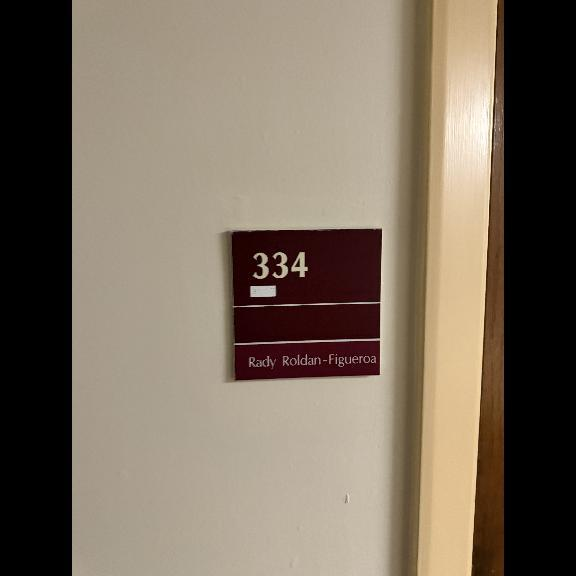
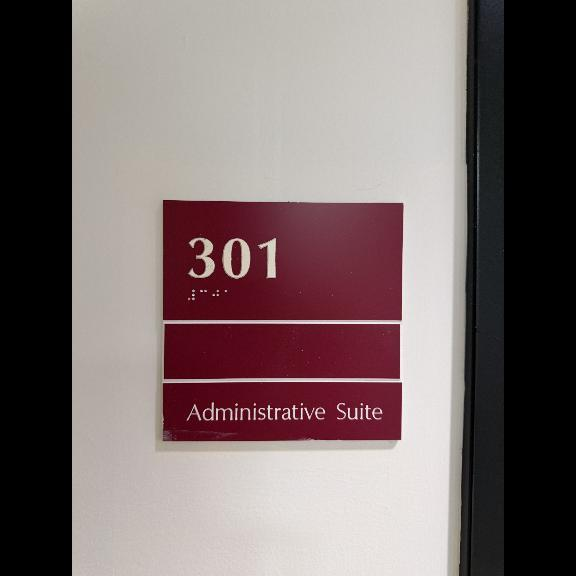
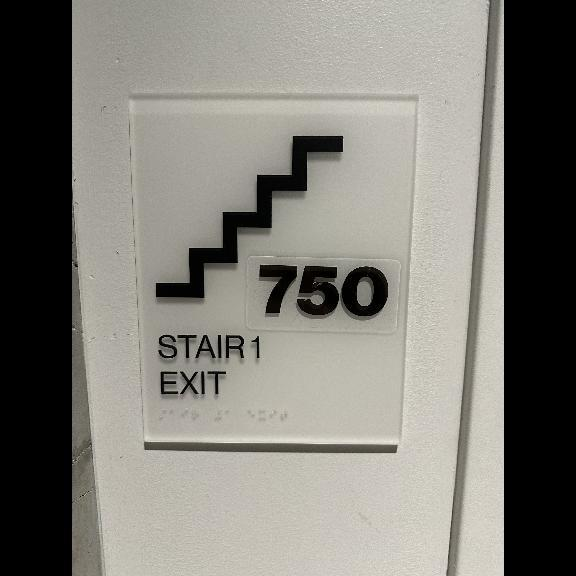
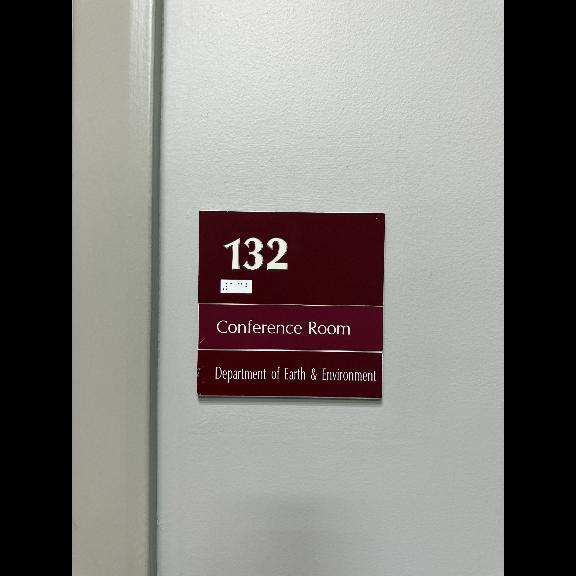

Training Epoch 10/10: 100%|██████████| 95/95 [02:28<00:00,  1.57s/it]


Average Training Loss: 0.23199545317574552


Validation Epoch 10/10: 100%|██████████| 27/27 [00:21<00:00,  1.27it/s]


Average Validation Loss: 2.4208534646917275


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response
failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.



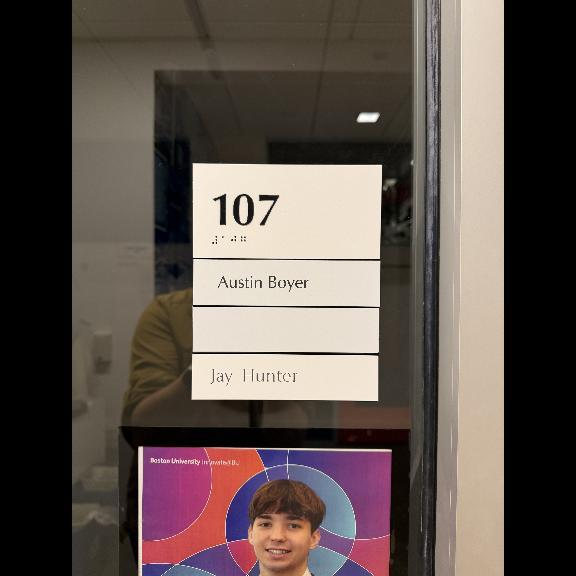
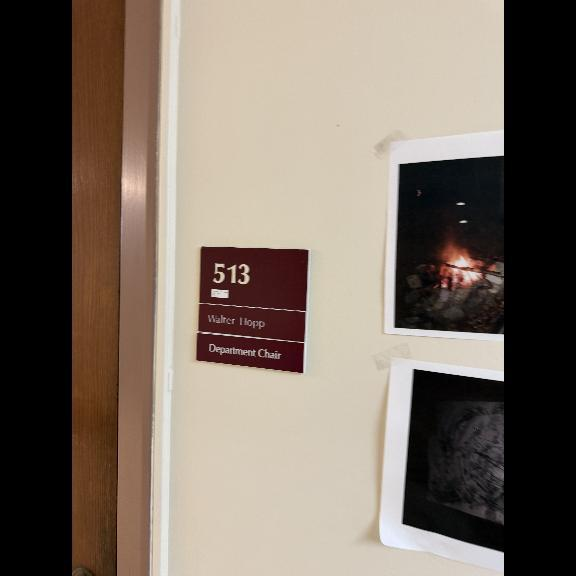
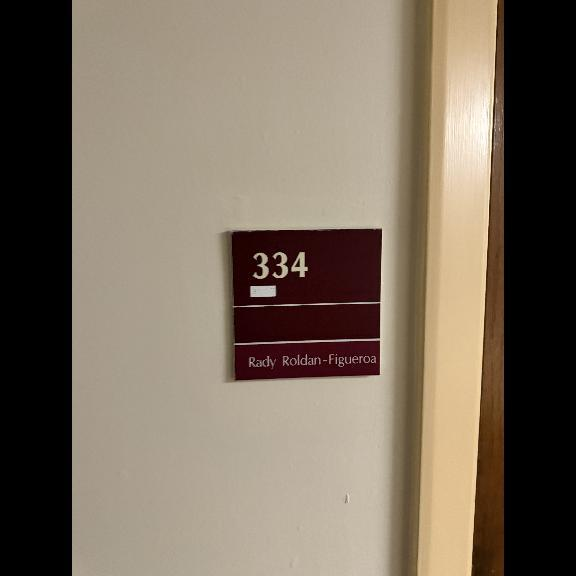
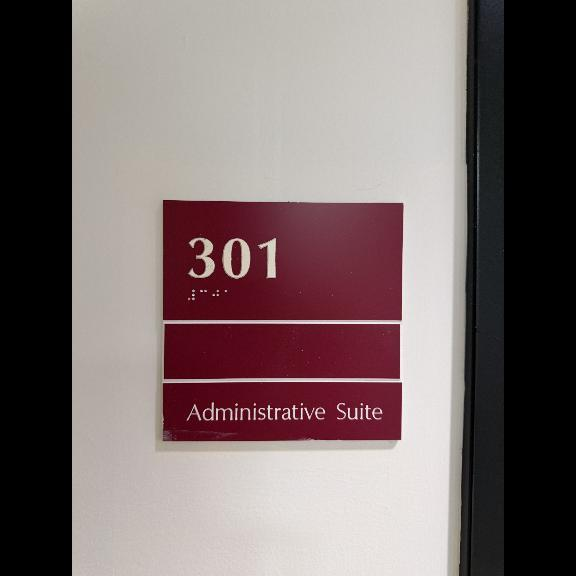
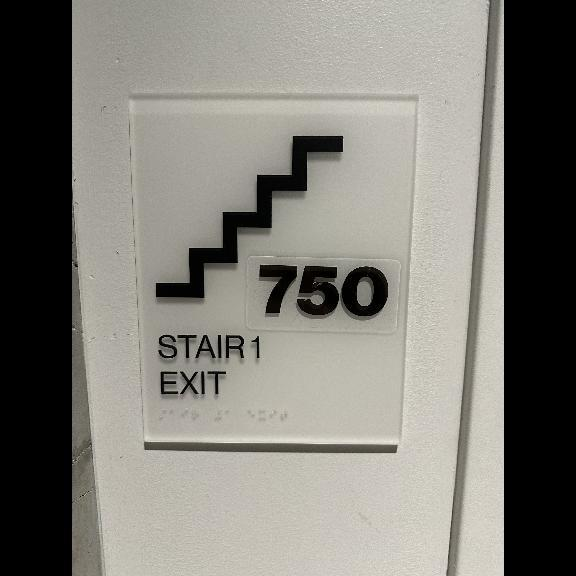
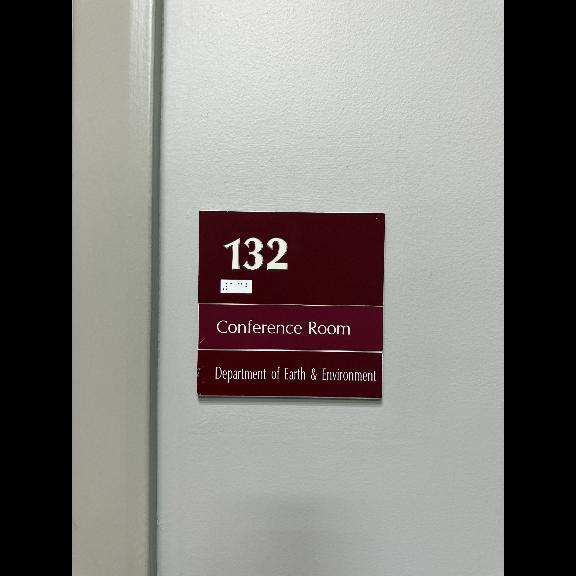

from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response
failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.



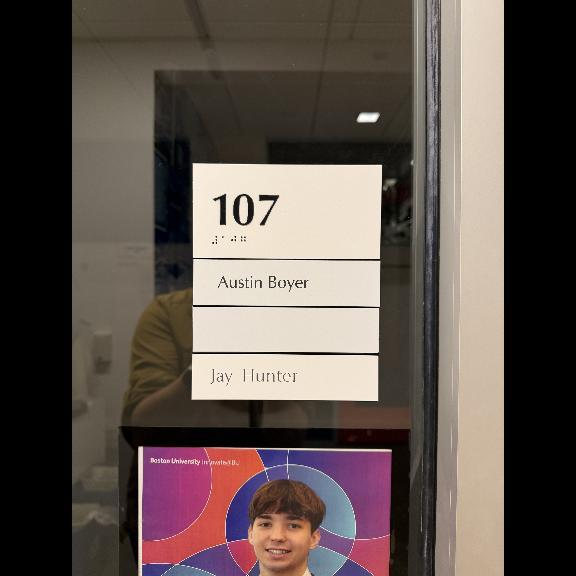
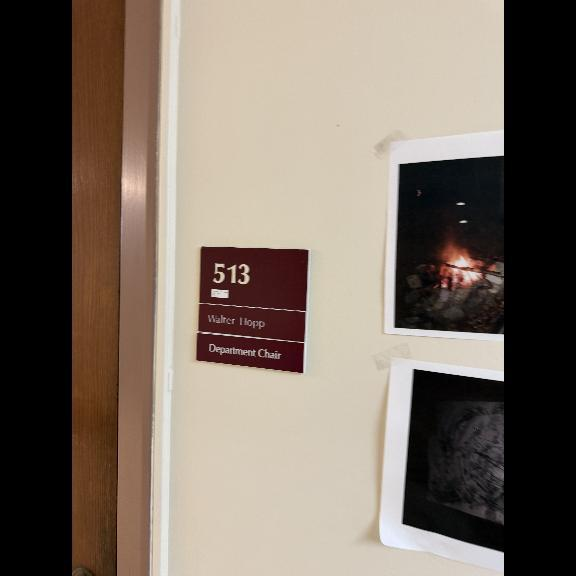
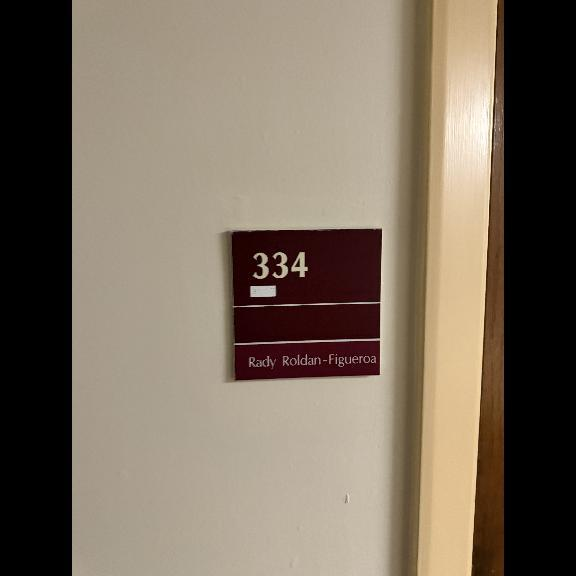
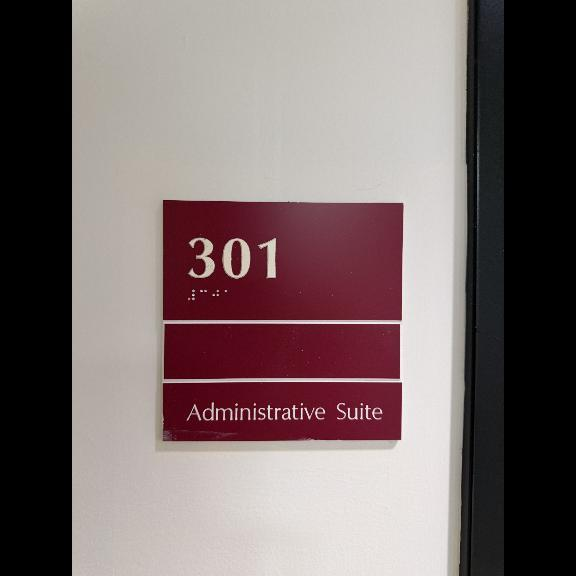
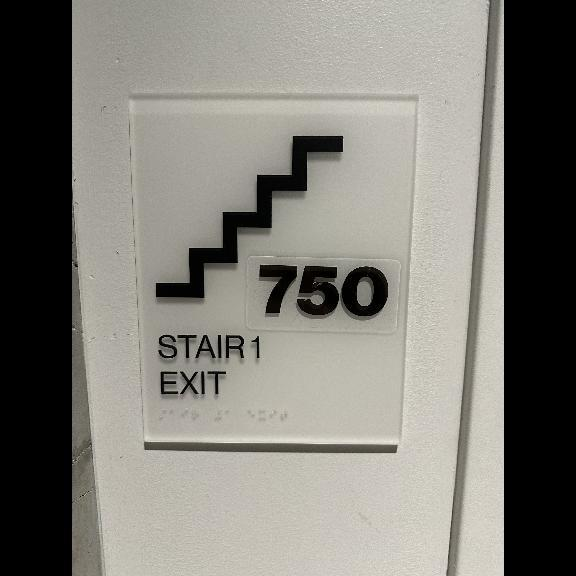
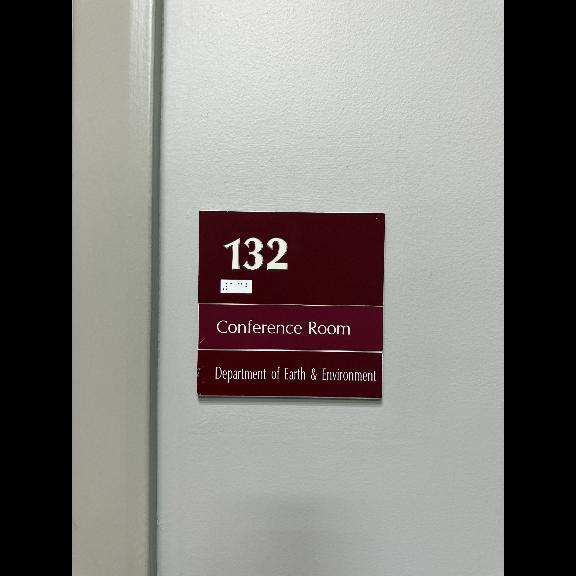

Training Epoch 1/10: 100%|██████████| 95/95 [02:27<00:00,  1.56s/it]


Average Training Loss: 7.013690008772047


Validation Epoch 1/10: 100%|██████████| 27/27 [00:20<00:00,  1.30it/s]
from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


Average Validation Loss: 4.827779434345387
failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.
from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response
failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.
from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response
failed to render model response
failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.



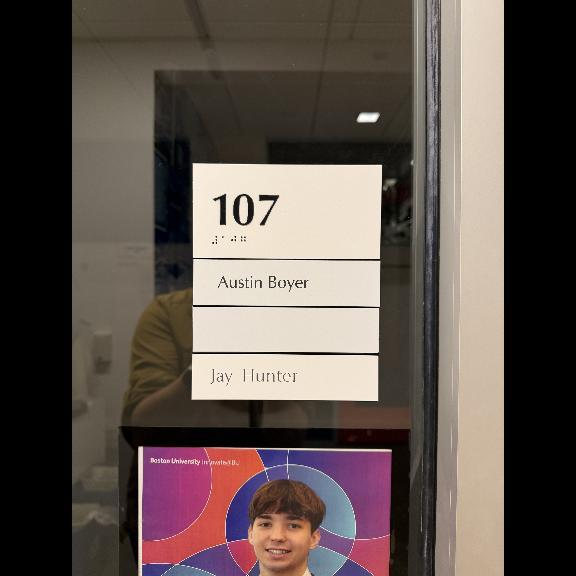
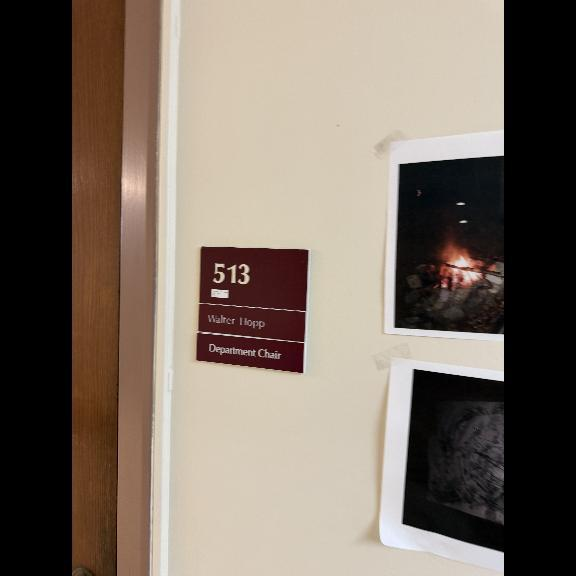
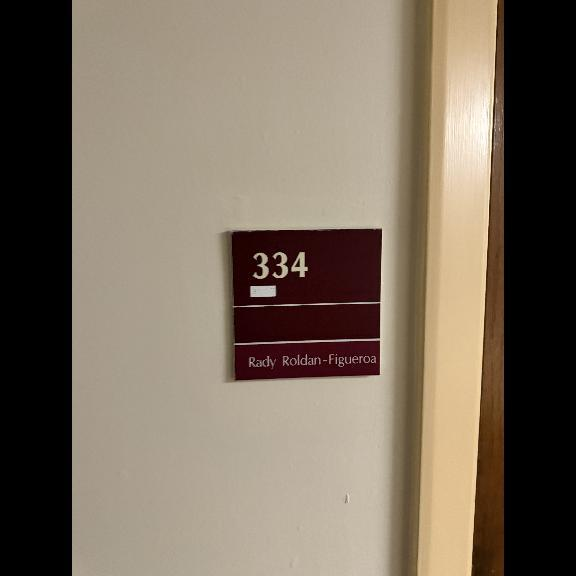
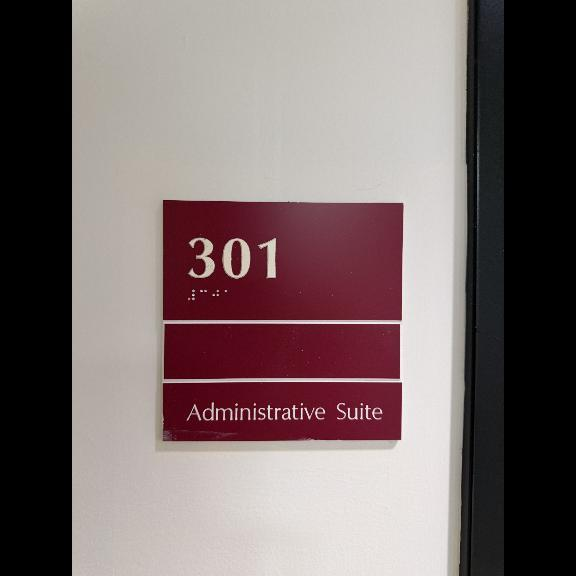
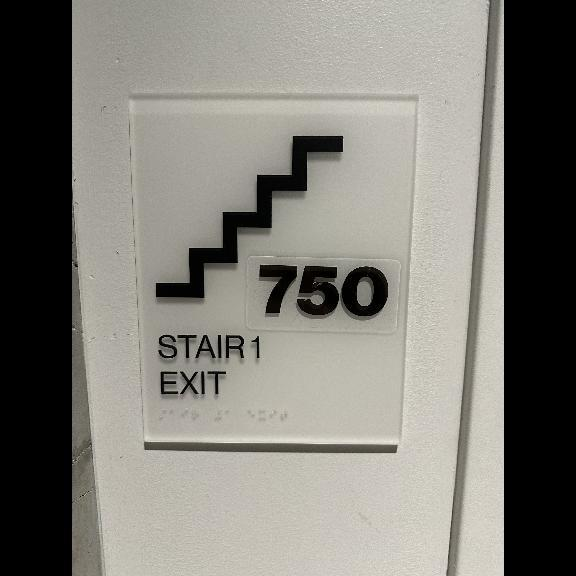
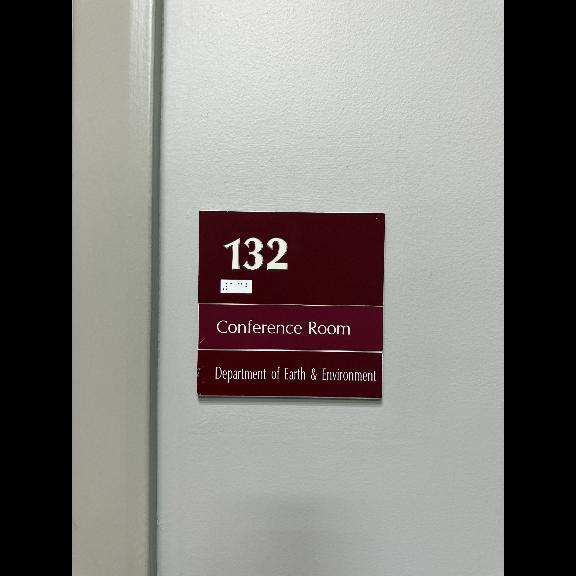

Training Epoch 2/10: 100%|██████████| 95/95 [02:27<00:00,  1.55s/it]


Average Training Loss: 4.926807539086592


Validation Epoch 2/10: 100%|██████████| 27/27 [00:20<00:00,  1.31it/s]


Average Validation Loss: 4.779771928434019


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response
failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.



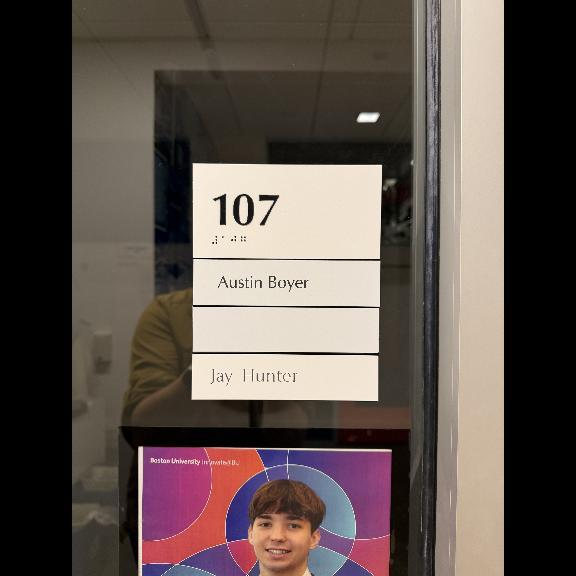
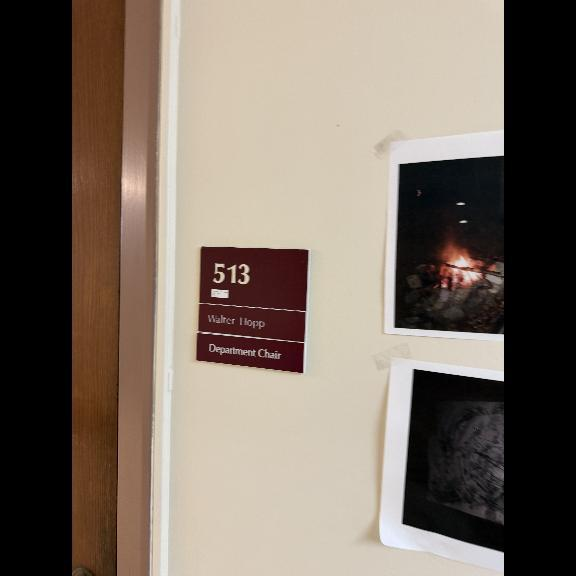
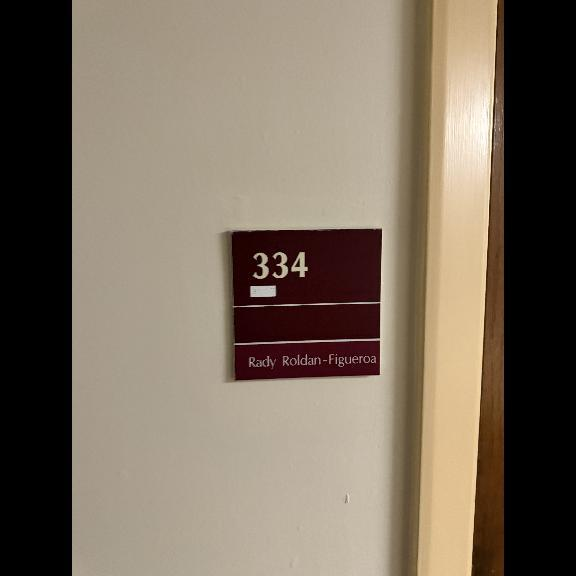
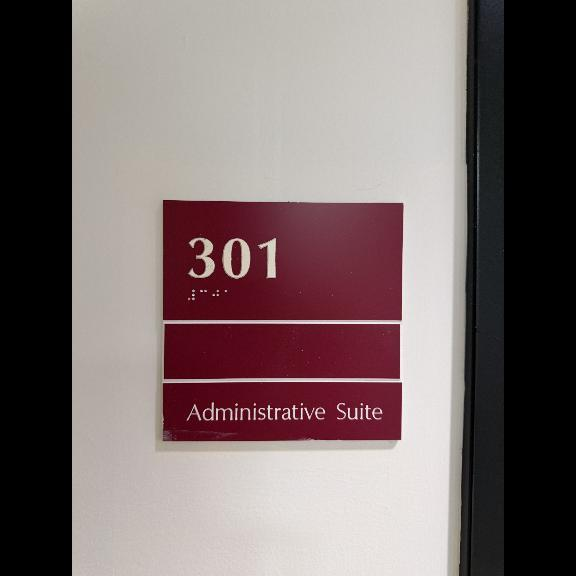
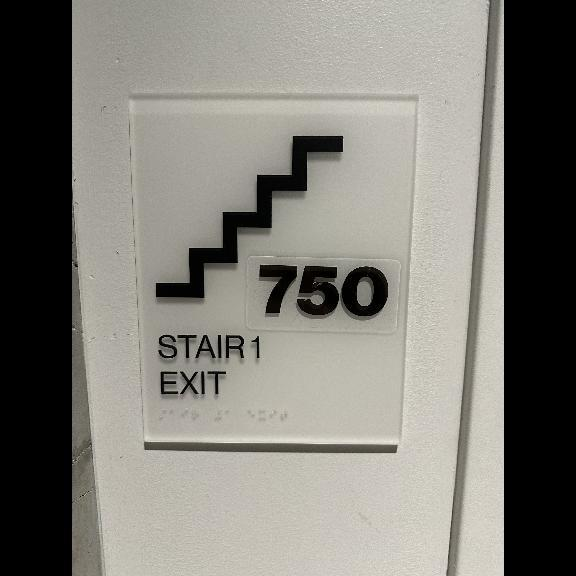
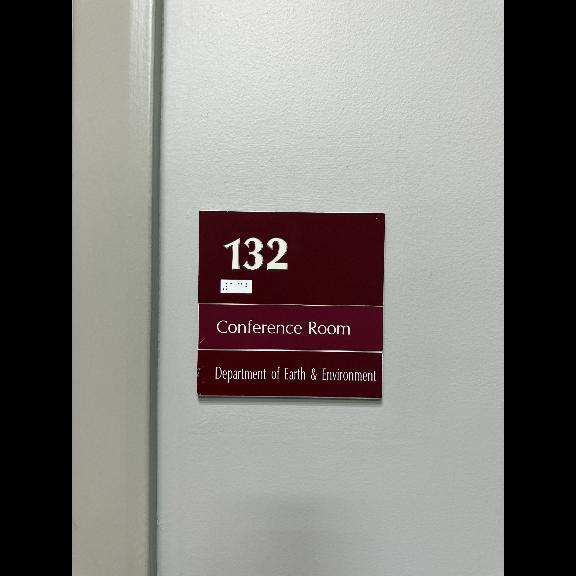

Training Epoch 3/10: 100%|██████████| 95/95 [02:27<00:00,  1.55s/it]


Average Training Loss: 4.783171869579115


Validation Epoch 3/10: 100%|██████████| 27/27 [00:20<00:00,  1.31it/s]


Average Validation Loss: 5.212442168483028


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response
failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.



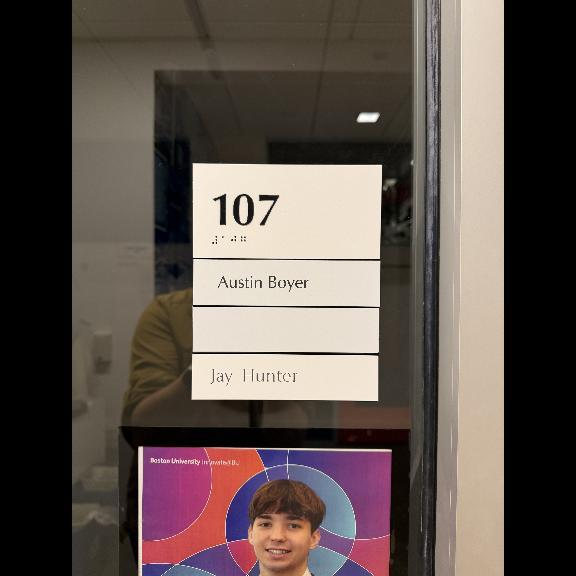
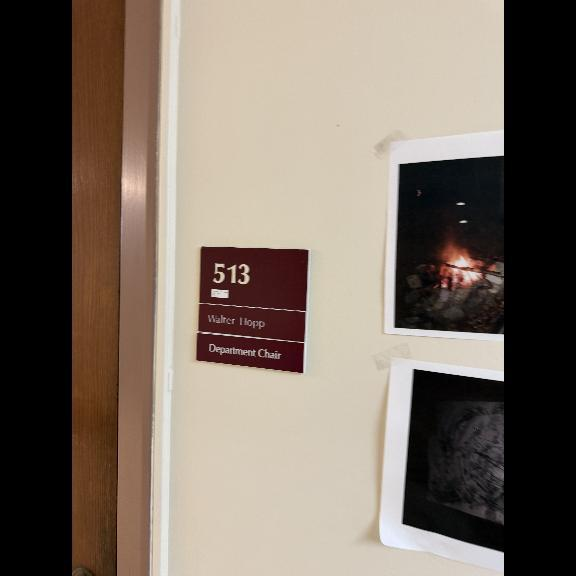
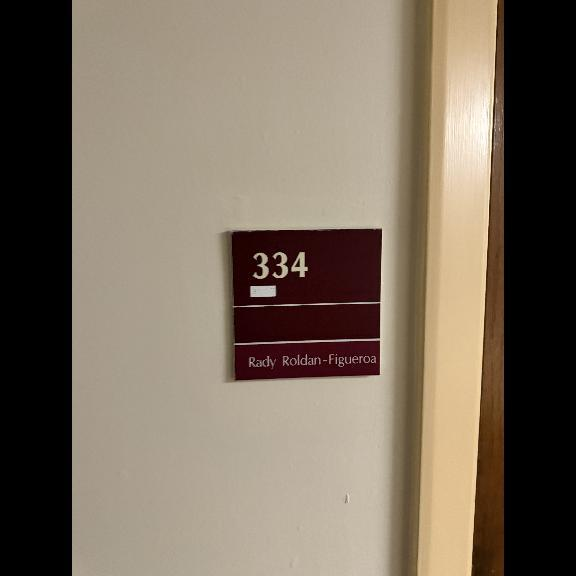
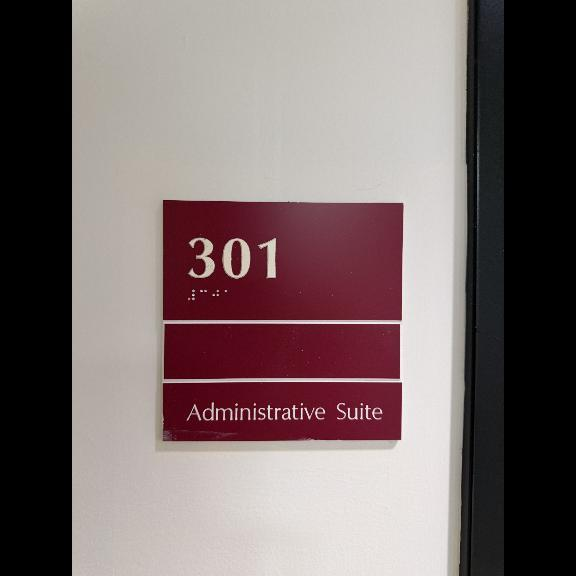
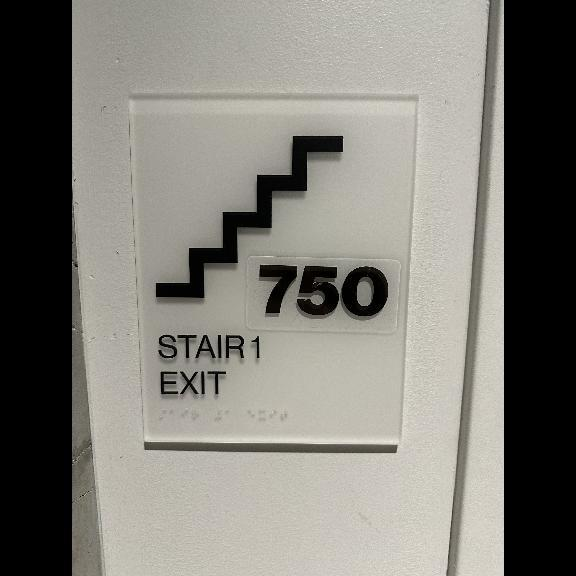
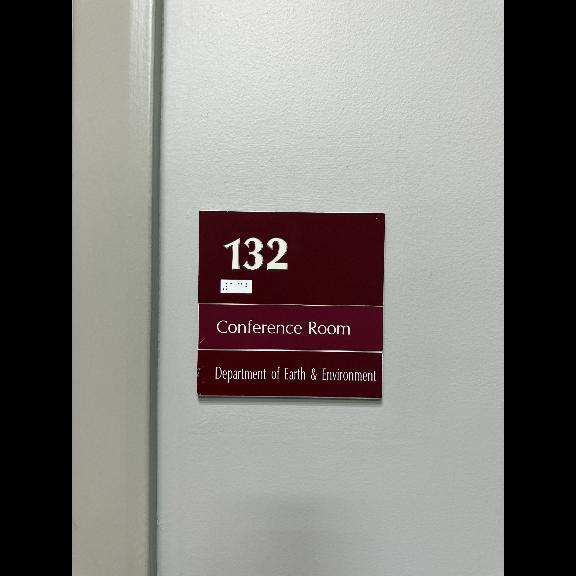

Training Epoch 4/10: 100%|██████████| 95/95 [02:27<00:00,  1.55s/it]


Average Training Loss: 4.685829925537109


Validation Epoch 4/10: 100%|██████████| 27/27 [00:20<00:00,  1.31it/s]
from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


Average Validation Loss: 4.7648009017661765
failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.
from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response
failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.
from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response
failed to render model response
failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.



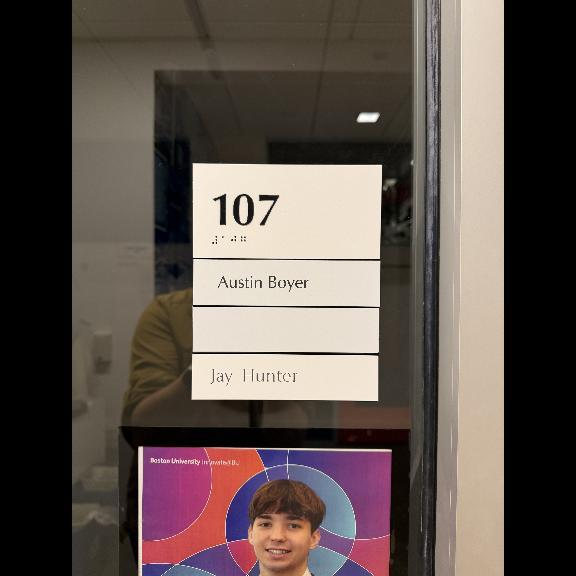
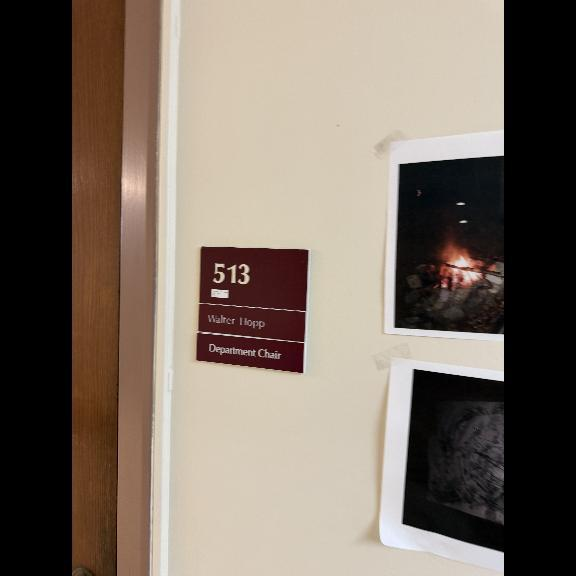
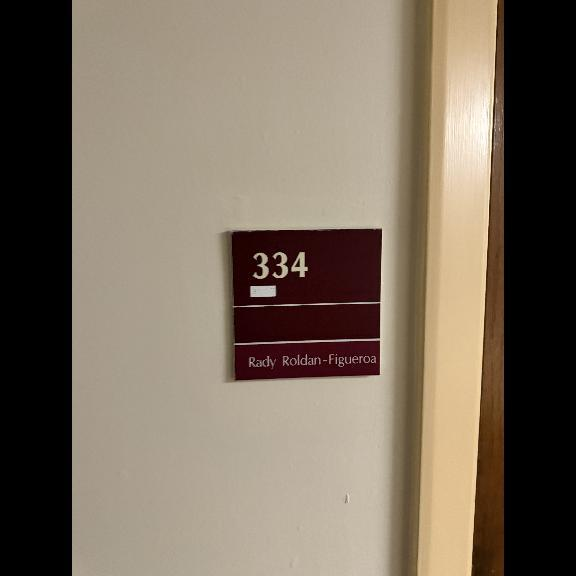
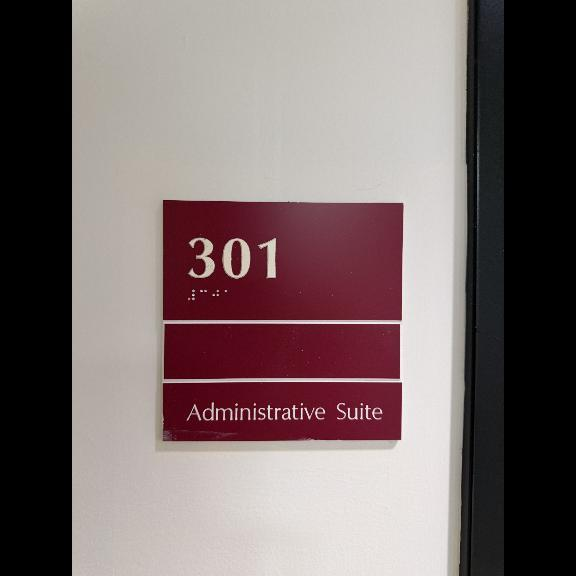
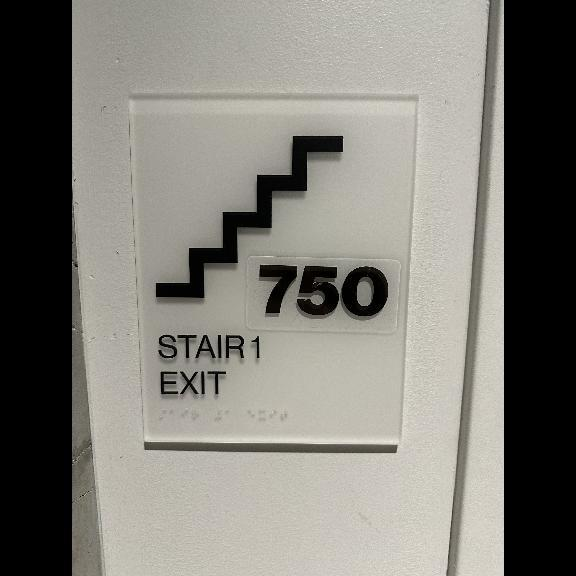
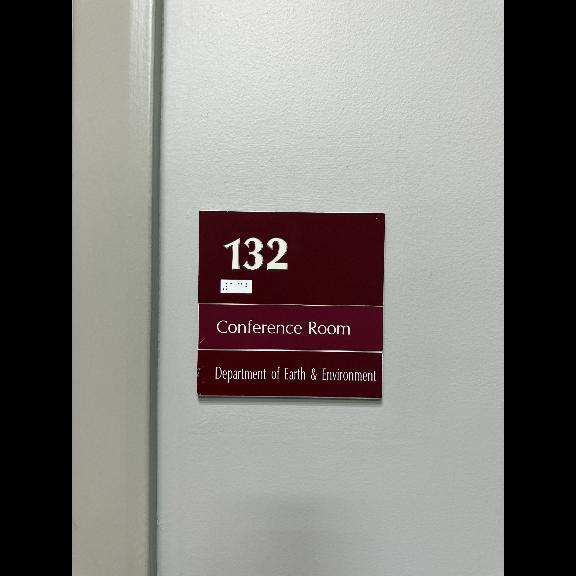

Training Epoch 5/10: 100%|██████████| 95/95 [02:27<00:00,  1.55s/it]


Average Training Loss: 4.644257452613429


Validation Epoch 5/10: 100%|██████████| 27/27 [00:20<00:00,  1.31it/s]


Average Validation Loss: 4.719133394735831


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response
failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.



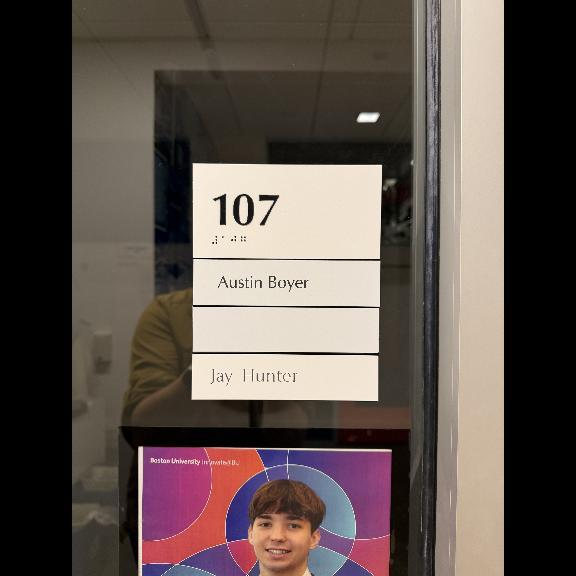
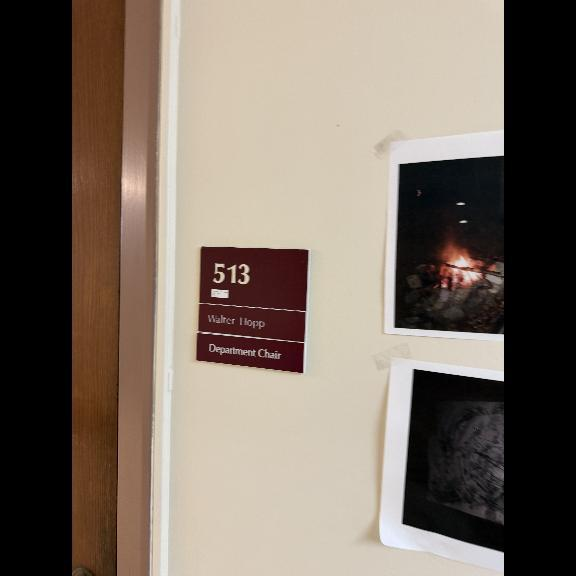
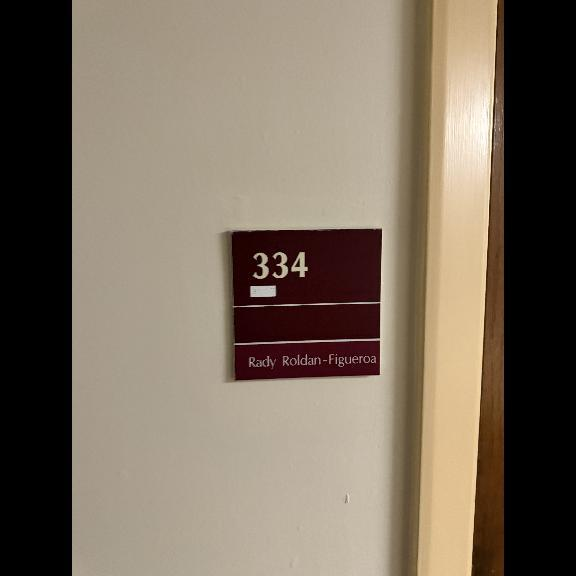
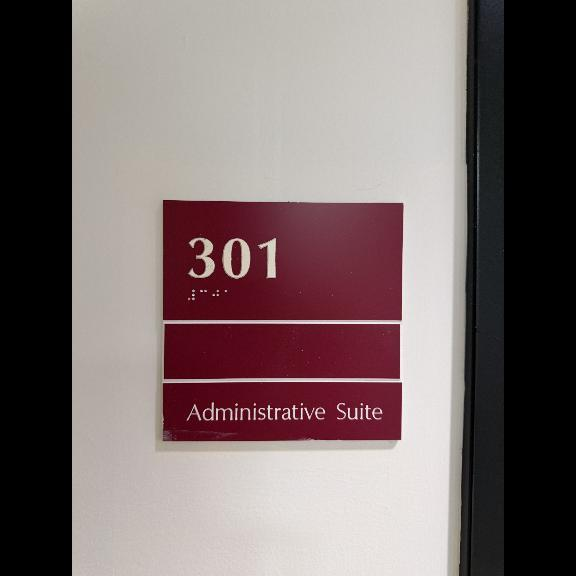
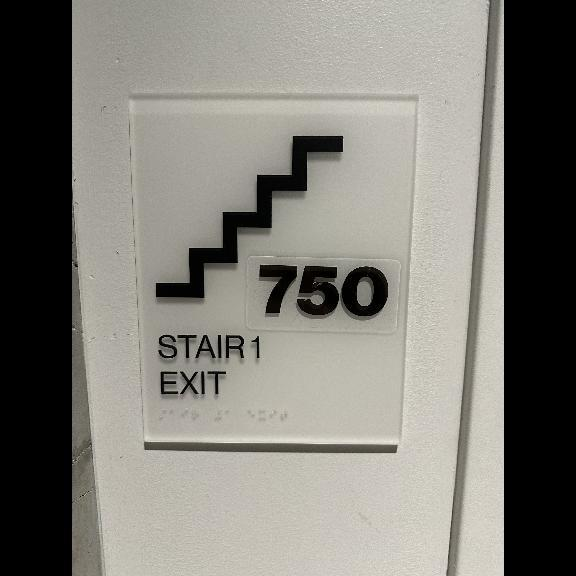
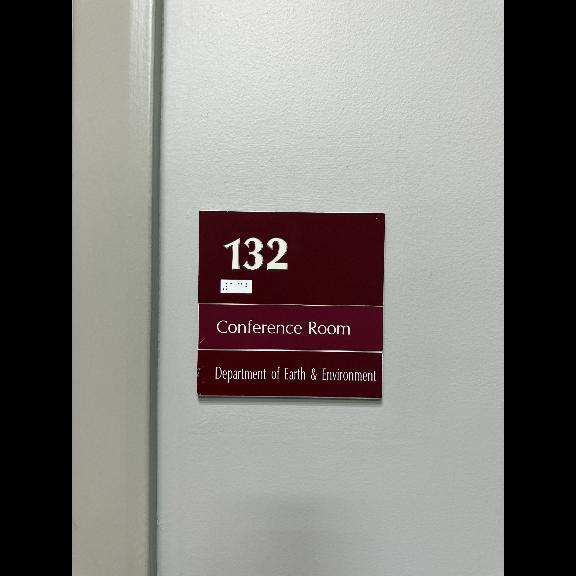

Training Epoch 6/10: 100%|██████████| 95/95 [02:27<00:00,  1.55s/it]


Average Training Loss: 4.558566582830329


Validation Epoch 6/10: 100%|██████████| 27/27 [00:20<00:00,  1.31it/s]
from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


Average Validation Loss: 4.827234480116102
failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.
from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response
failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.
from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response
failed to render model response
failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.



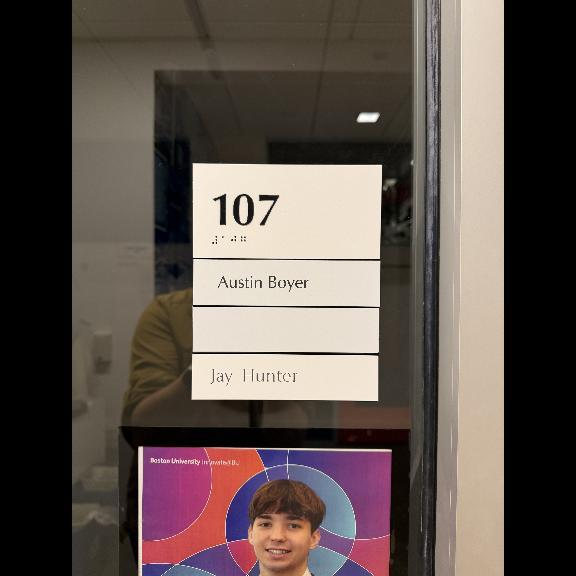
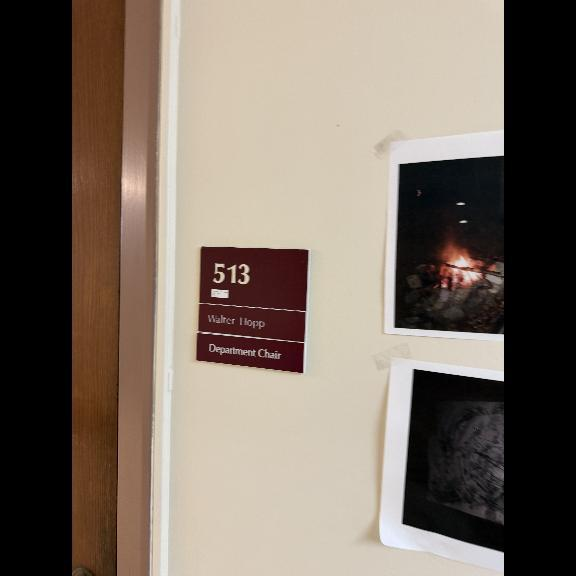
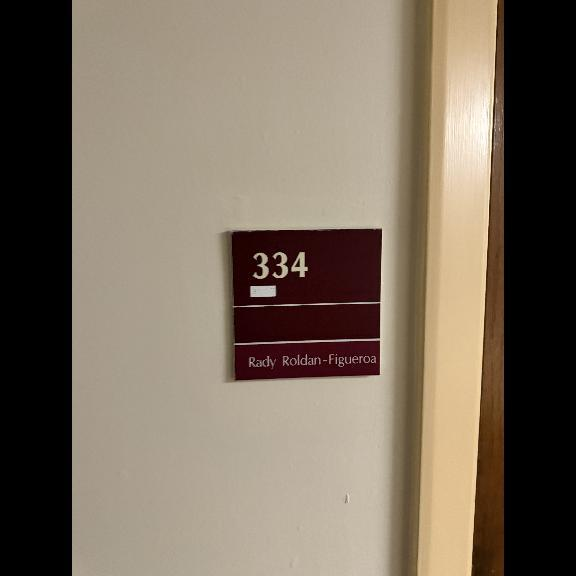
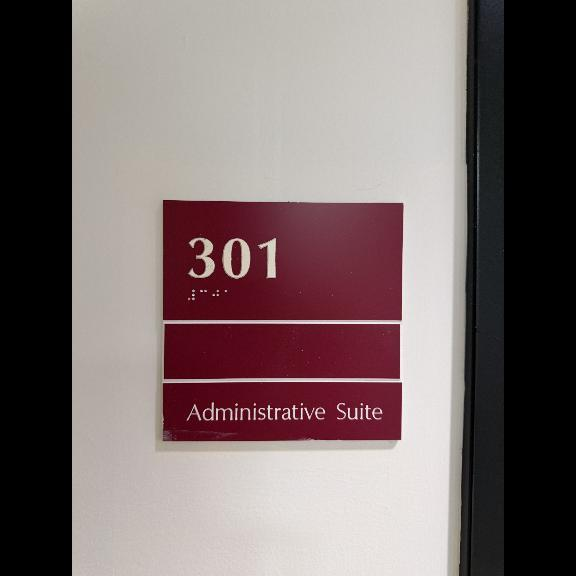
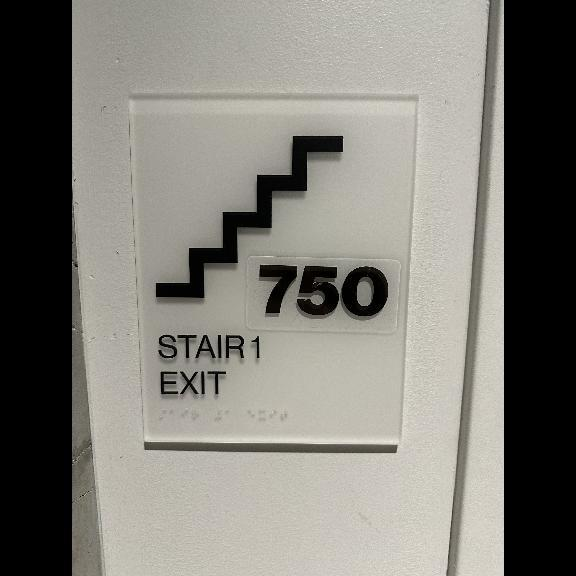
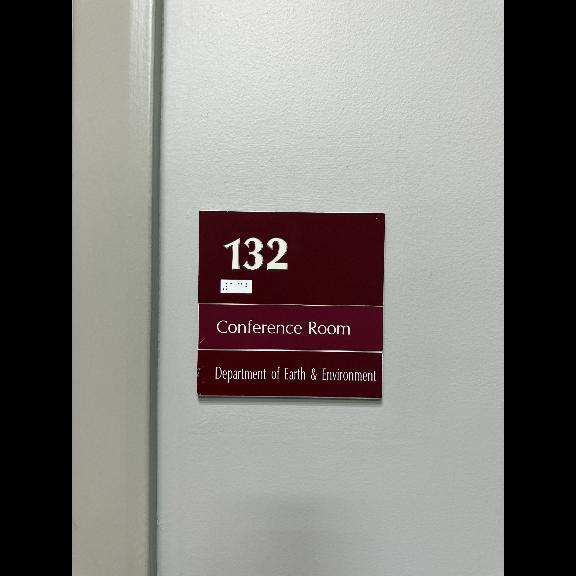

Training Epoch 7/10: 100%|██████████| 95/95 [02:27<00:00,  1.55s/it]


Average Training Loss: 4.565751409530639


Validation Epoch 7/10: 100%|██████████| 27/27 [00:20<00:00,  1.31it/s]


Average Validation Loss: 4.842717612231219


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response
failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.



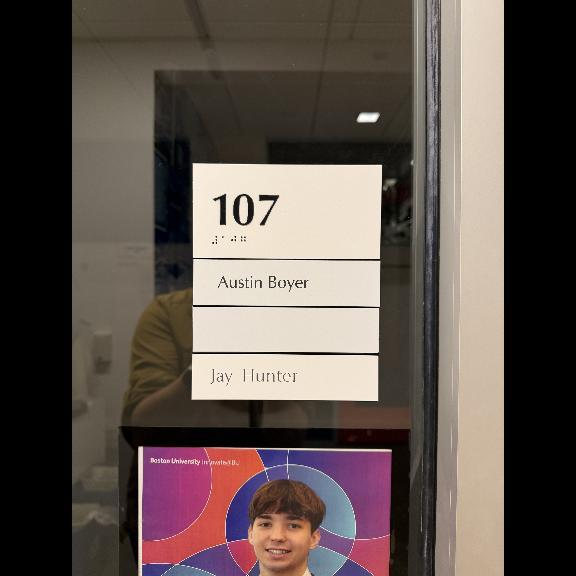
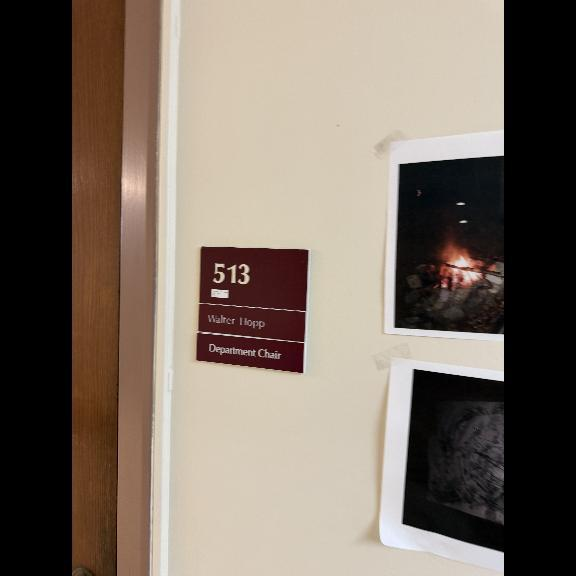
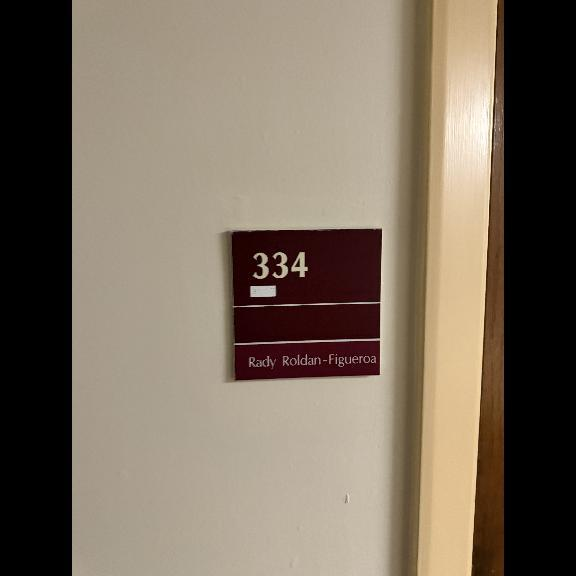
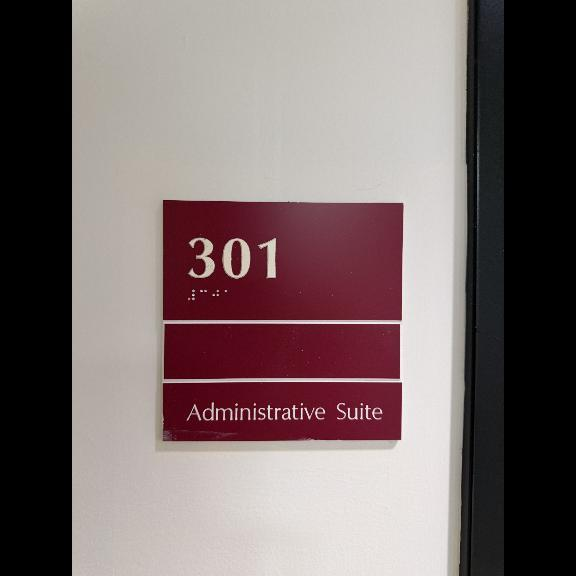
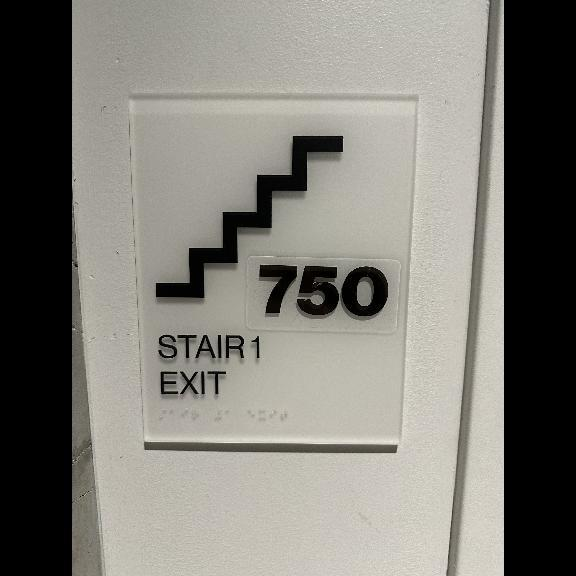
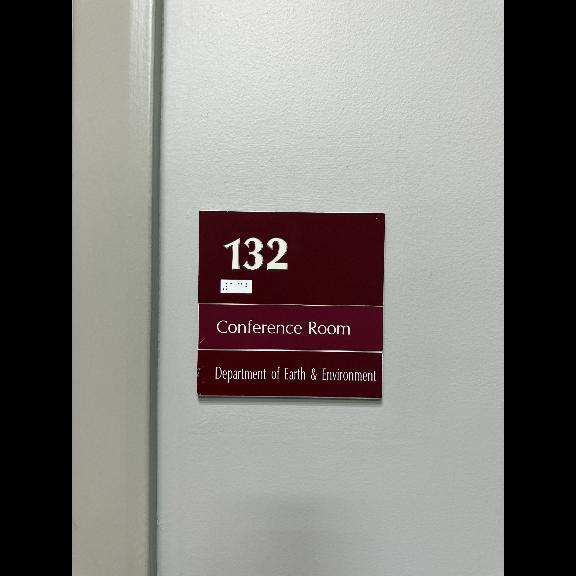

Training Epoch 8/10: 100%|██████████| 95/95 [02:27<00:00,  1.55s/it]


Average Training Loss: 4.511614194669222


Validation Epoch 8/10: 100%|██████████| 27/27 [00:20<00:00,  1.30it/s]
from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


Average Validation Loss: 4.806198526311804
failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.
from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response
failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.
from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response
failed to render model response
failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.



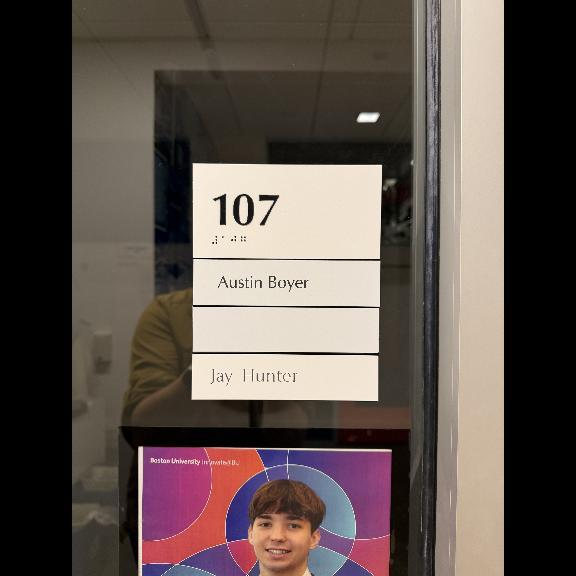
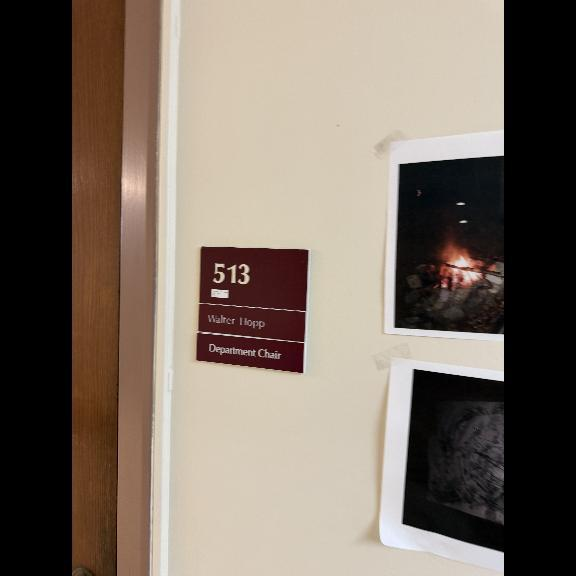
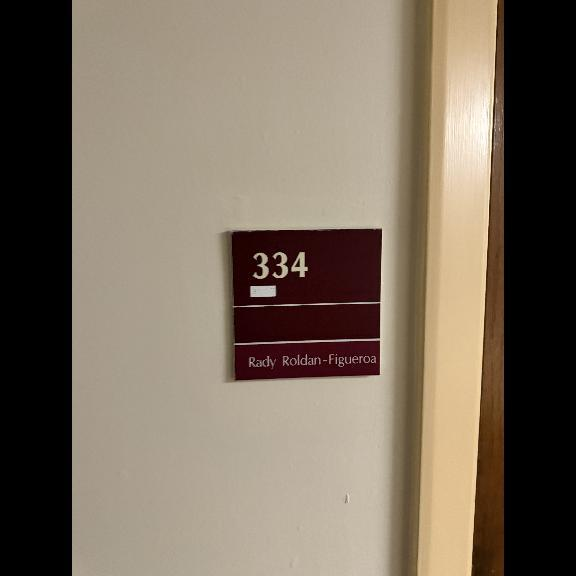
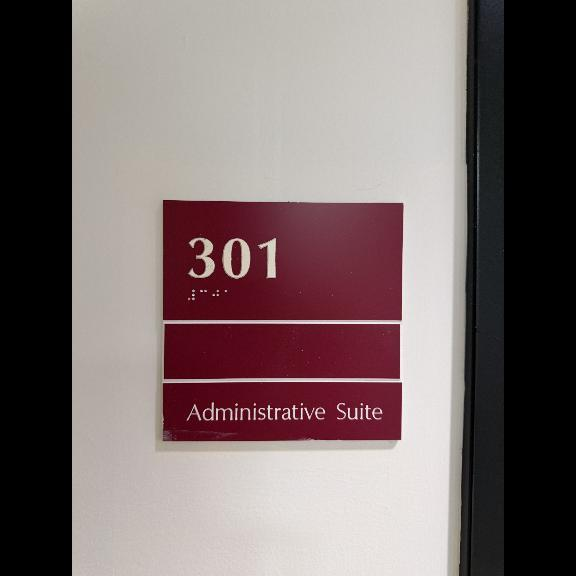
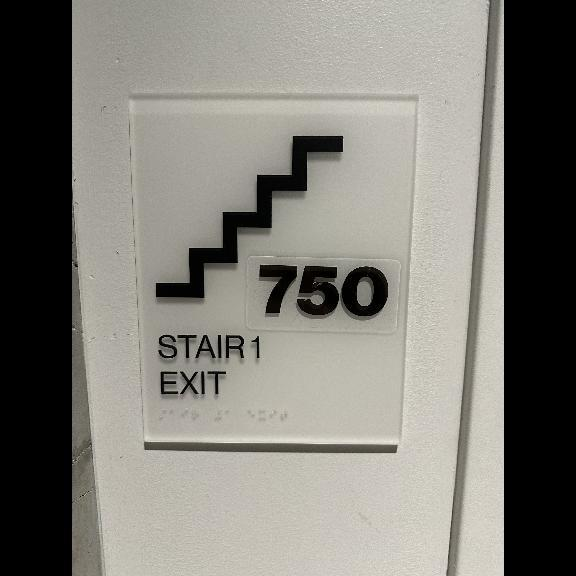
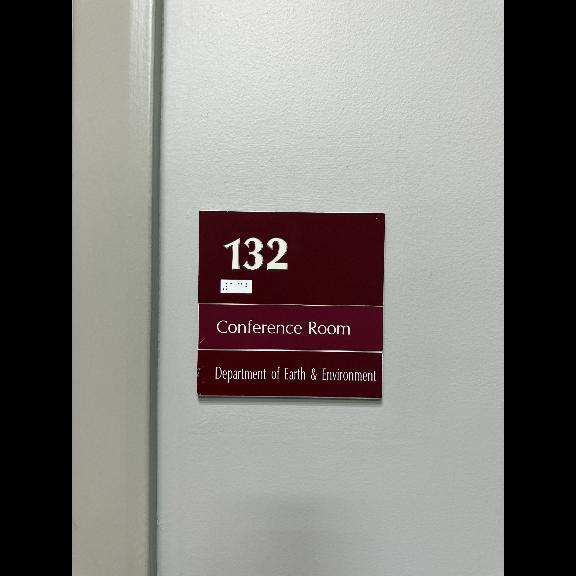

Training Epoch 9/10: 100%|██████████| 95/95 [02:27<00:00,  1.55s/it]


Average Training Loss: 4.422813952596564


Validation Epoch 9/10: 100%|██████████| 27/27 [00:20<00:00,  1.31it/s]


Average Validation Loss: 5.065084086524116


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response
failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.



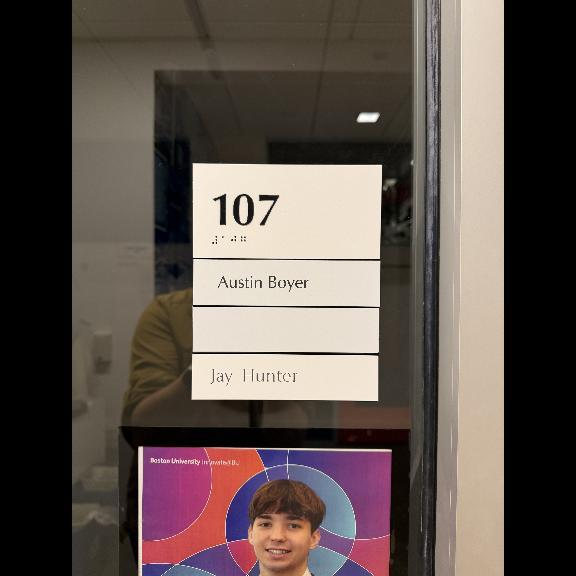
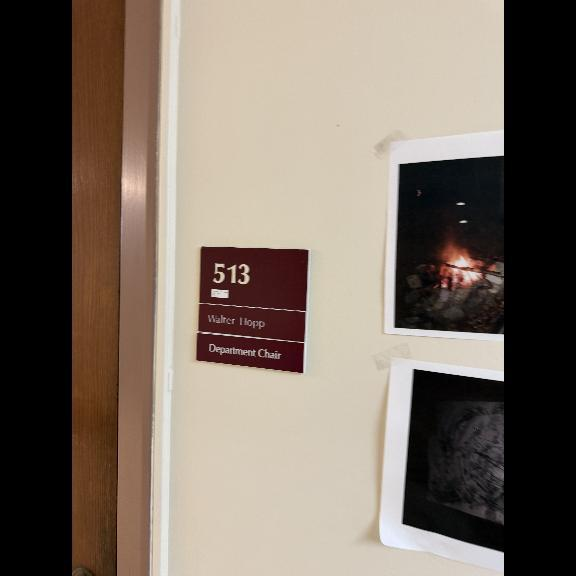
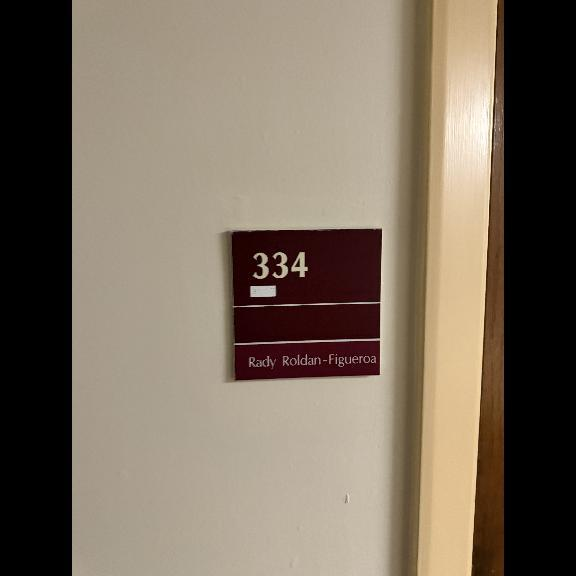
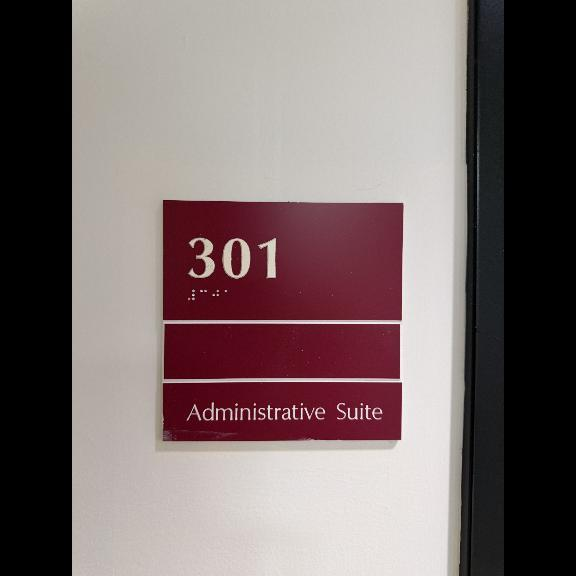
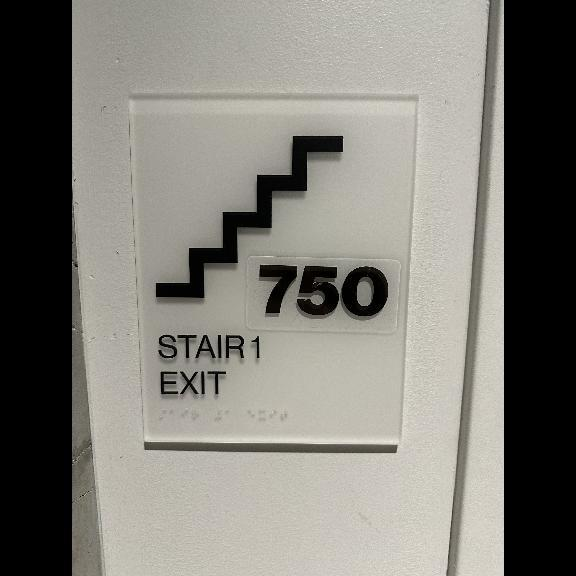
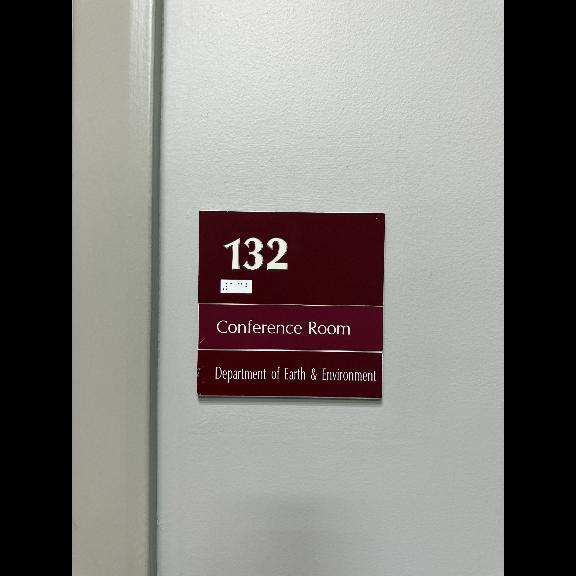

Training Epoch 10/10: 100%|██████████| 95/95 [02:27<00:00,  1.55s/it]


Average Training Loss: 4.292995560796637


Validation Epoch 10/10: 100%|██████████| 27/27 [00:20<00:00,  1.31it/s]


Average Validation Loss: 5.065148989359538


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response
failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.



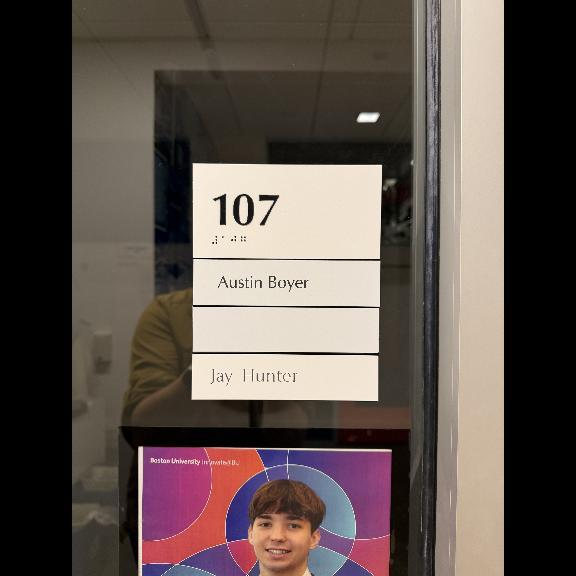
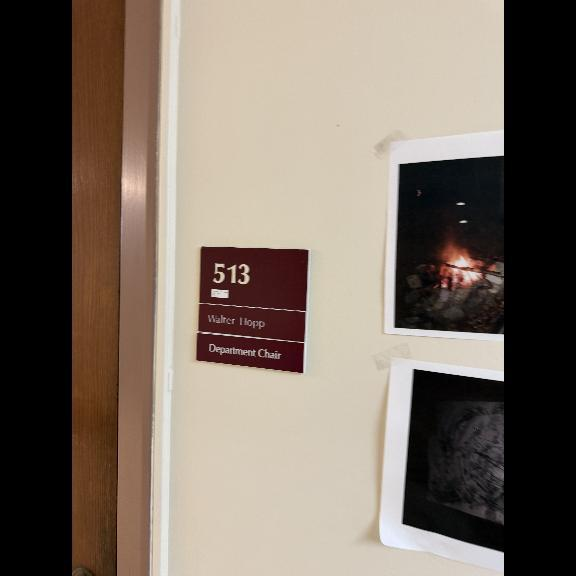
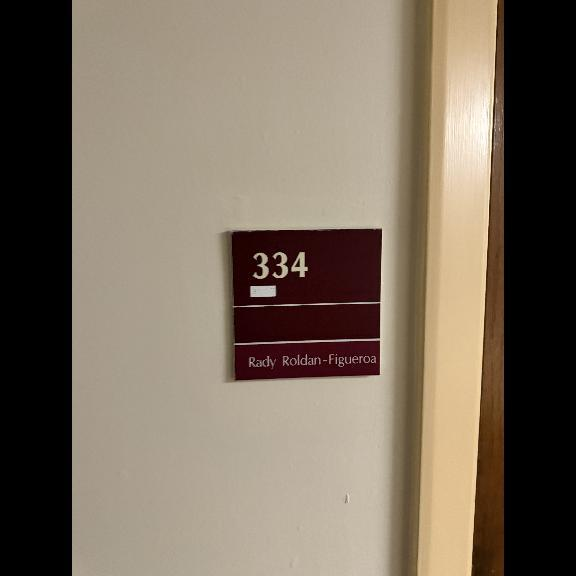
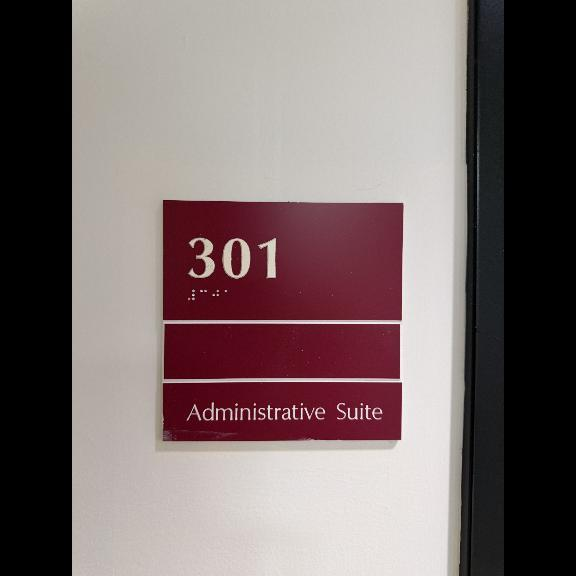
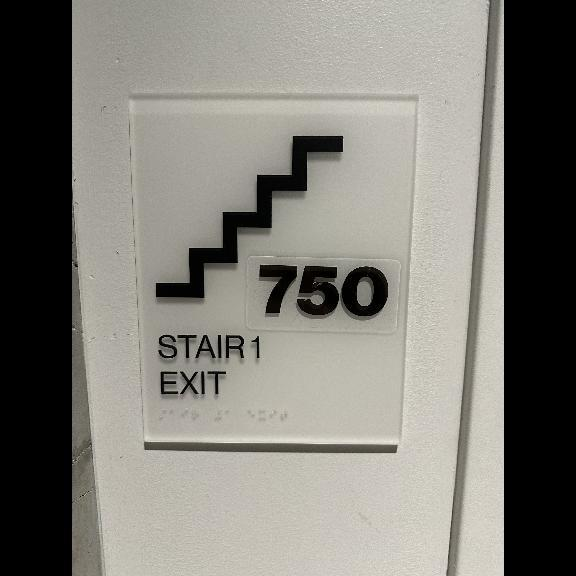
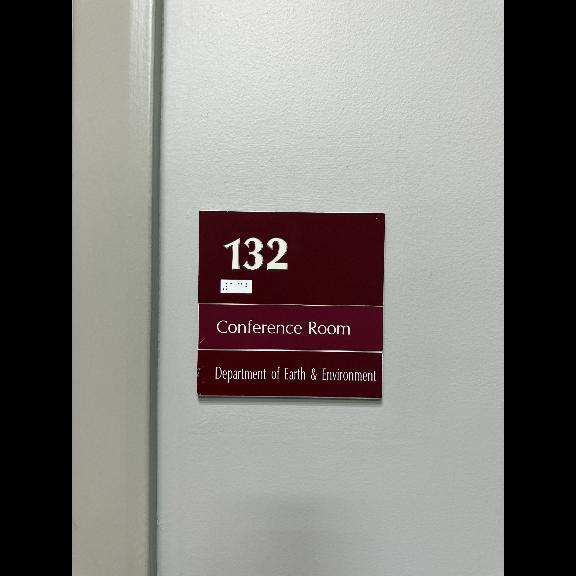

from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response
failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.



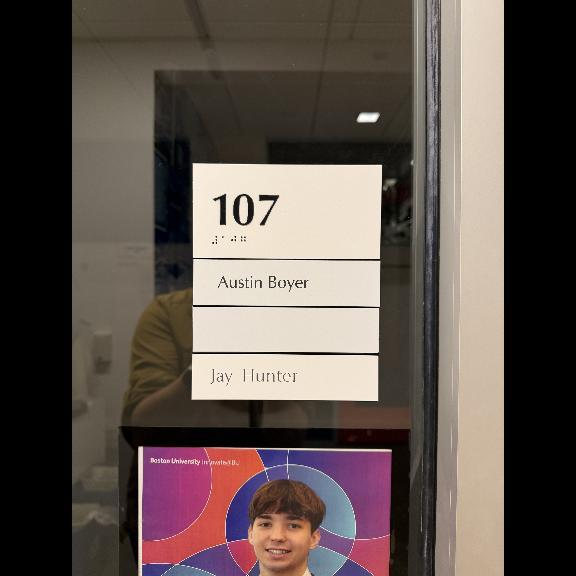
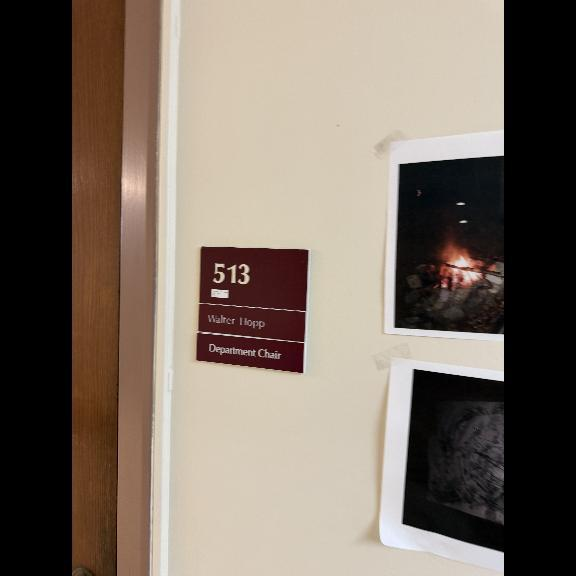
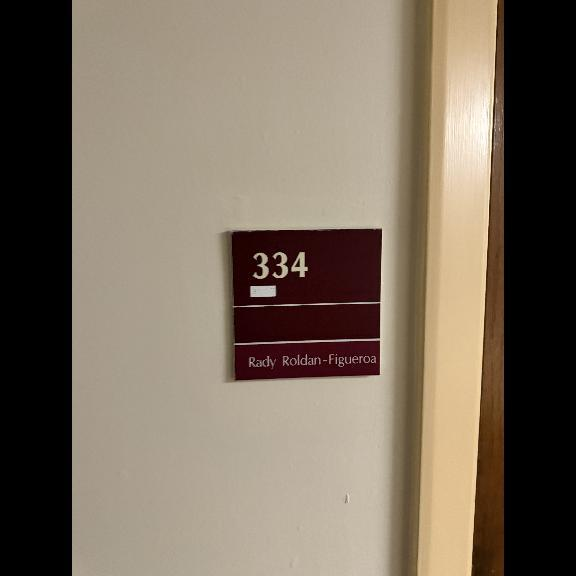
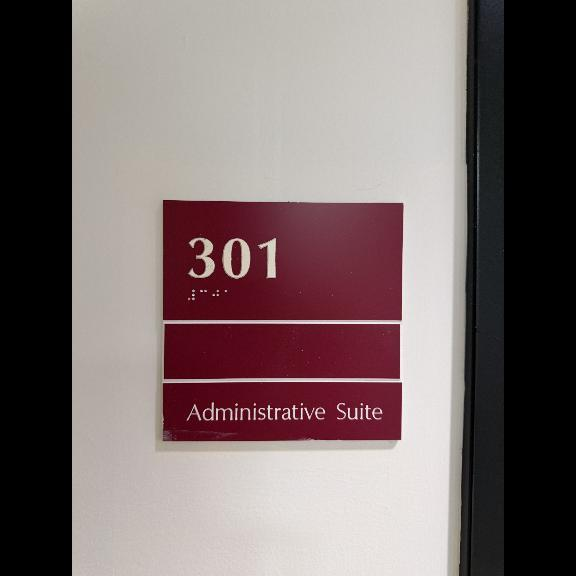
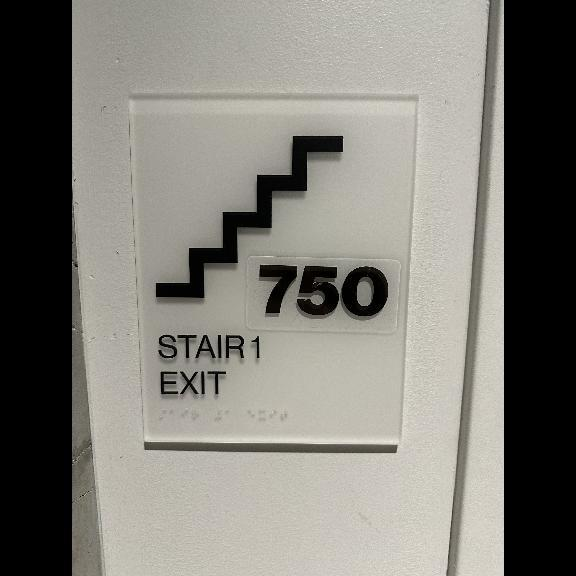
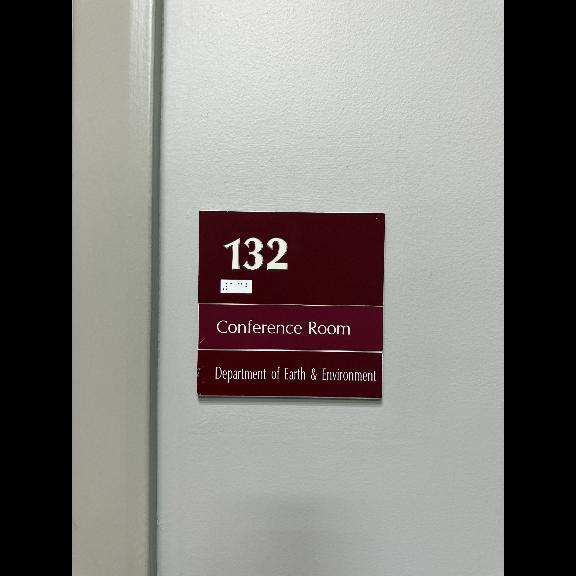

Training Epoch 1/10: 100%|██████████| 95/95 [02:27<00:00,  1.55s/it]


Average Training Loss: 107.13817698830053


Validation Epoch 1/10: 100%|██████████| 27/27 [00:20<00:00,  1.31it/s]


Average Validation Loss: 37.597383145932795


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response
failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.



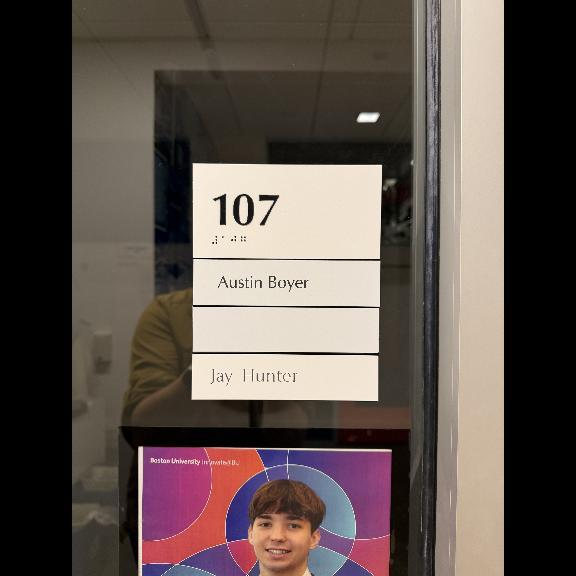
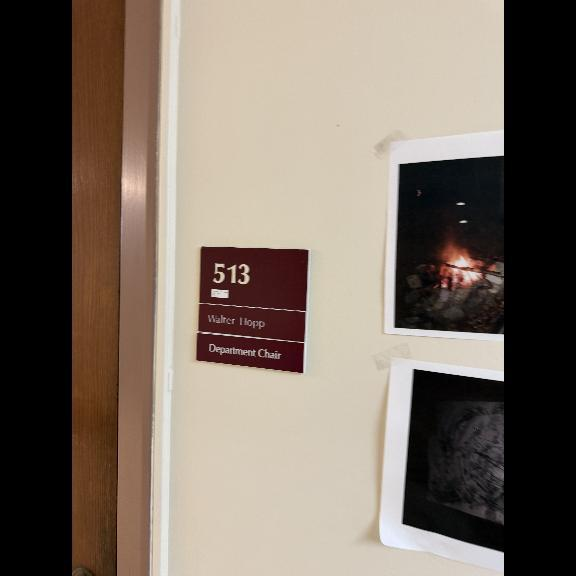
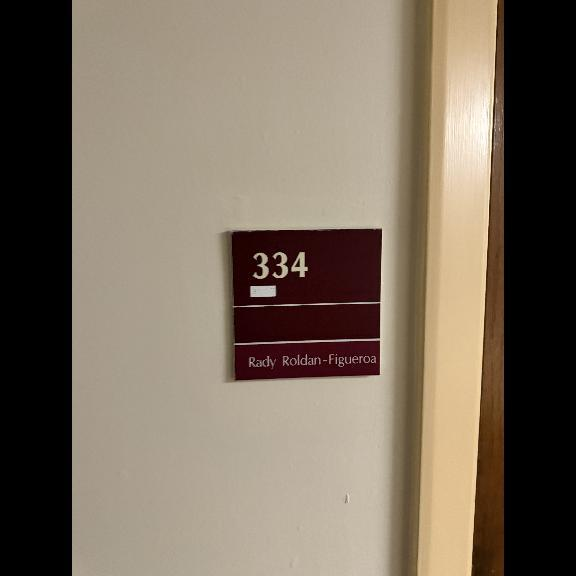
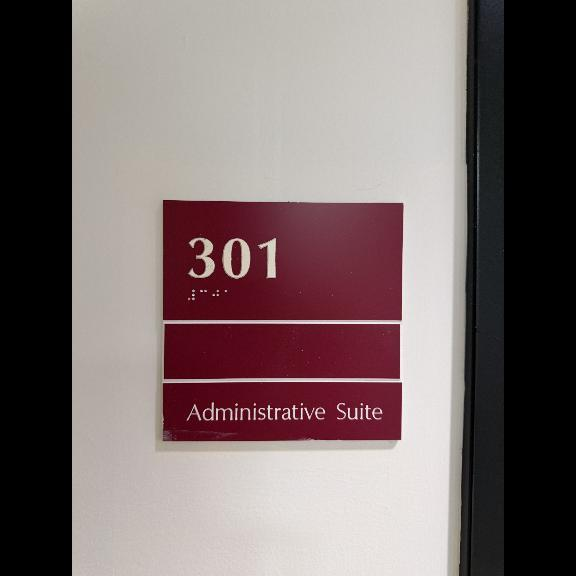
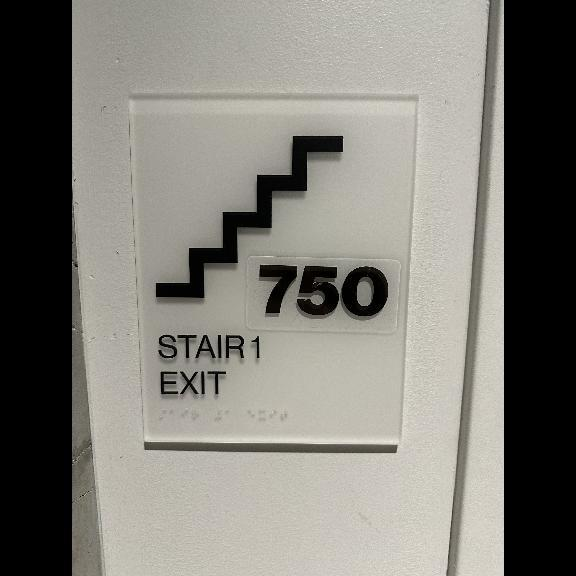
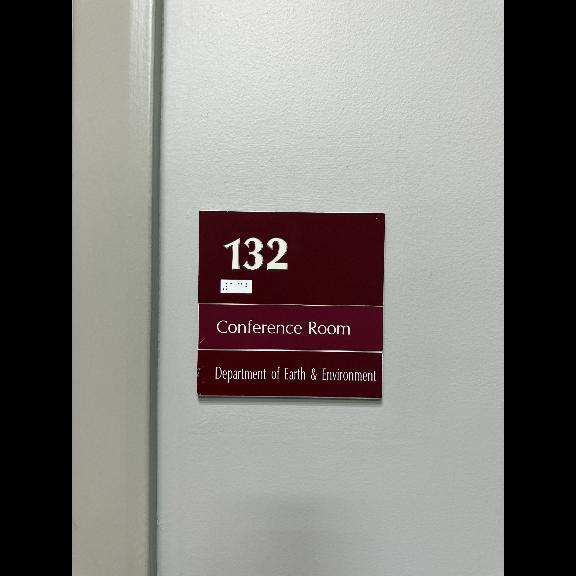

Training Epoch 2/10: 100%|██████████| 95/95 [02:26<00:00,  1.55s/it]


Average Training Loss: 40.70967437342593


Validation Epoch 2/10: 100%|██████████| 27/27 [00:20<00:00,  1.30it/s]
from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


Average Validation Loss: 17.483325428432888
failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.
from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response
failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.
from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response
failed to render model response
failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.



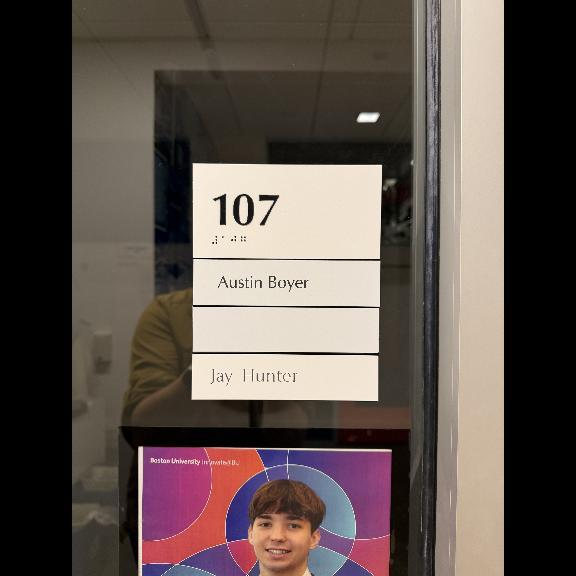
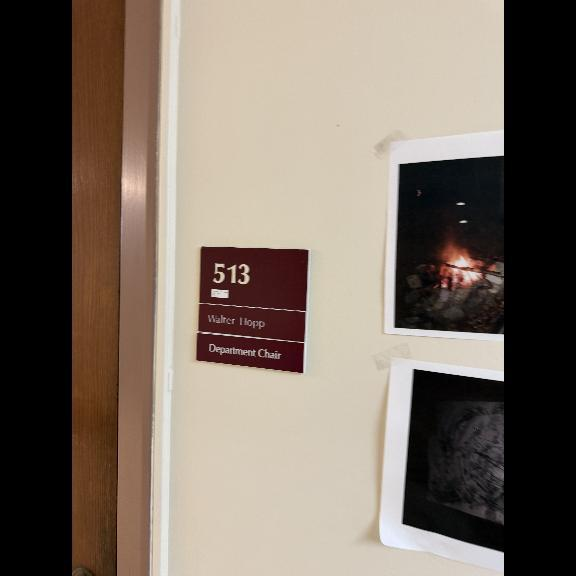
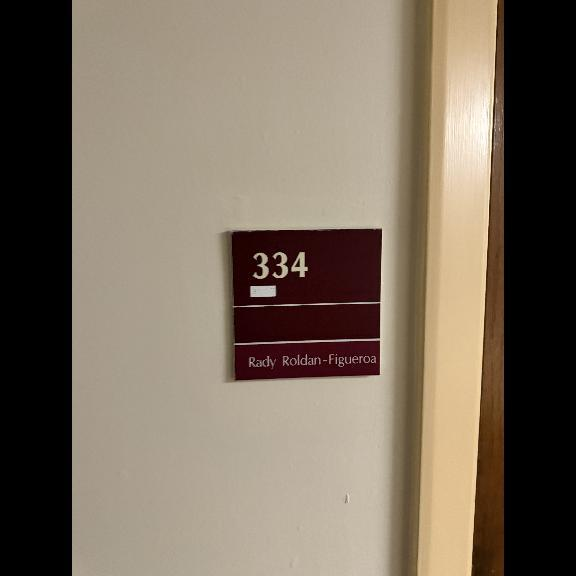
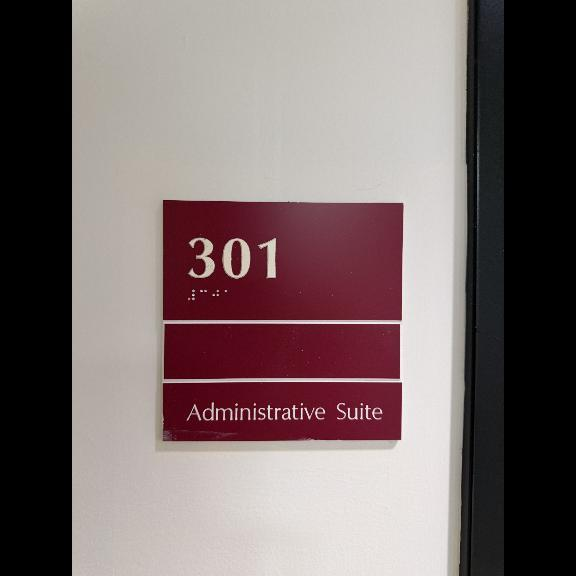
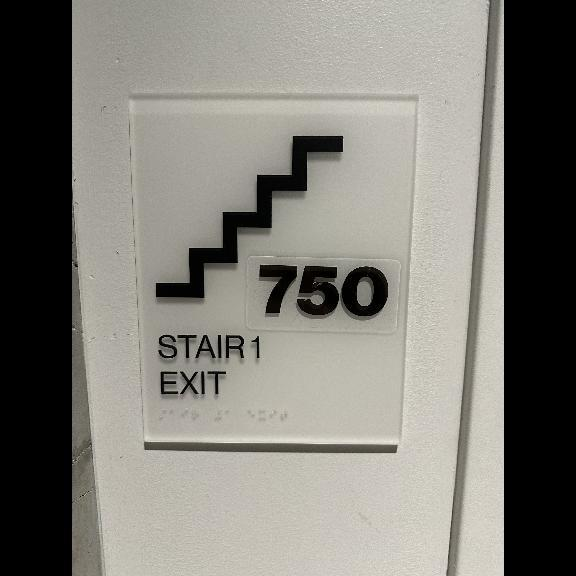
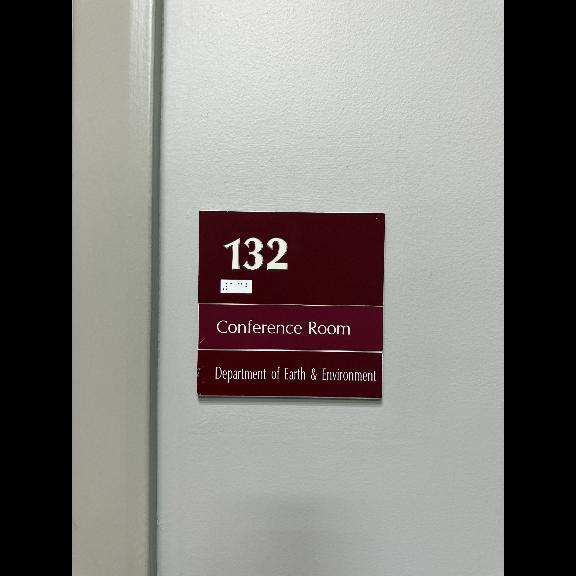

Training Epoch 3/10: 100%|██████████| 95/95 [02:27<00:00,  1.55s/it]


Average Training Loss: 22.611796067890367


Validation Epoch 3/10: 100%|██████████| 27/27 [00:20<00:00,  1.31it/s]


Average Validation Loss: 15.990897390577528


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response
failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.



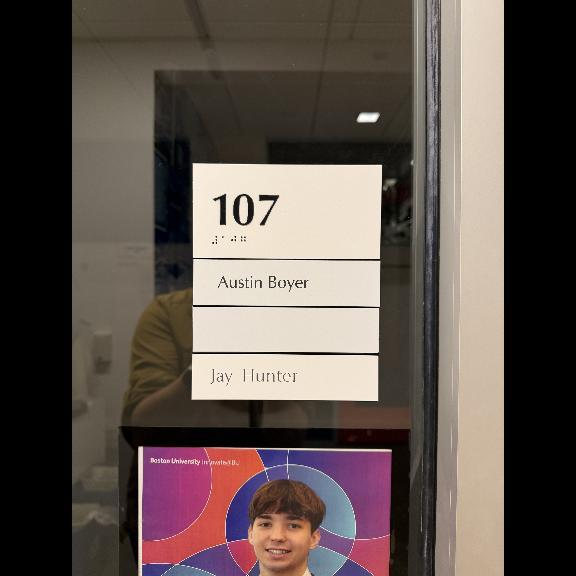
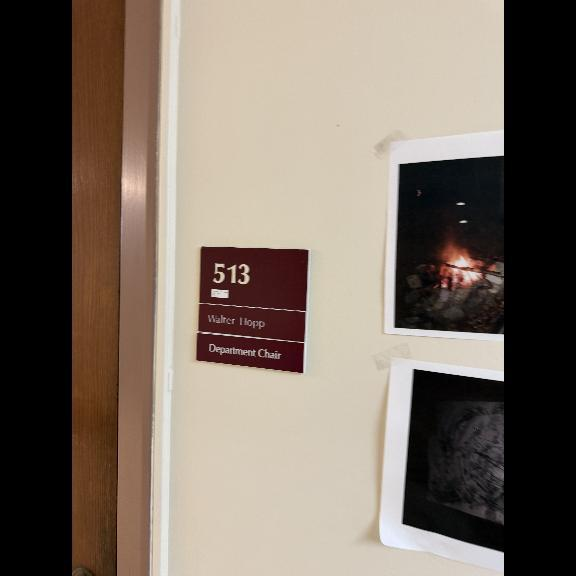
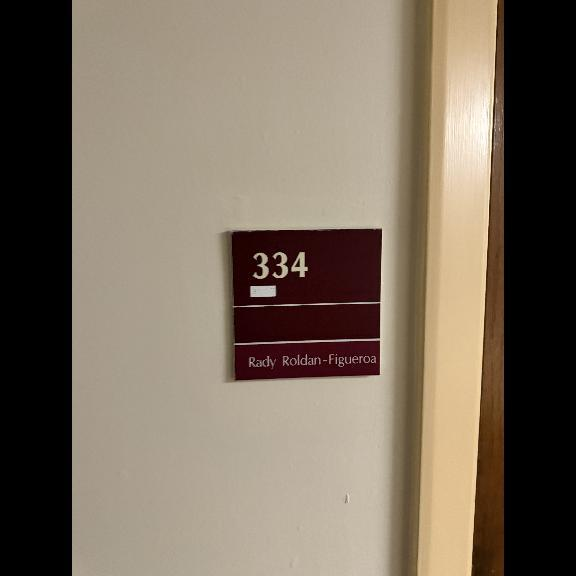
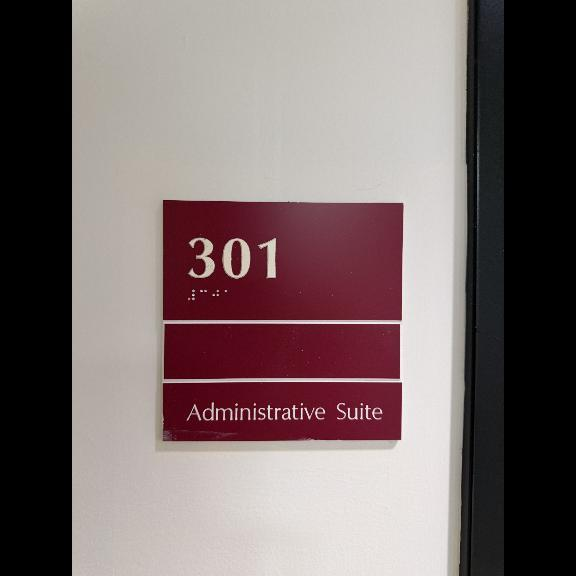
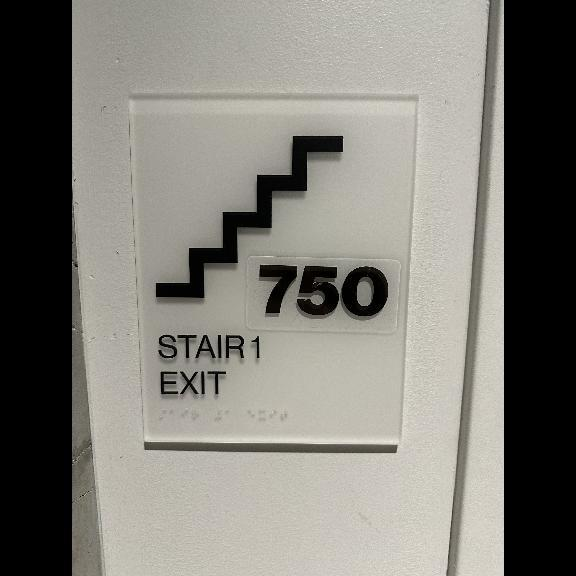
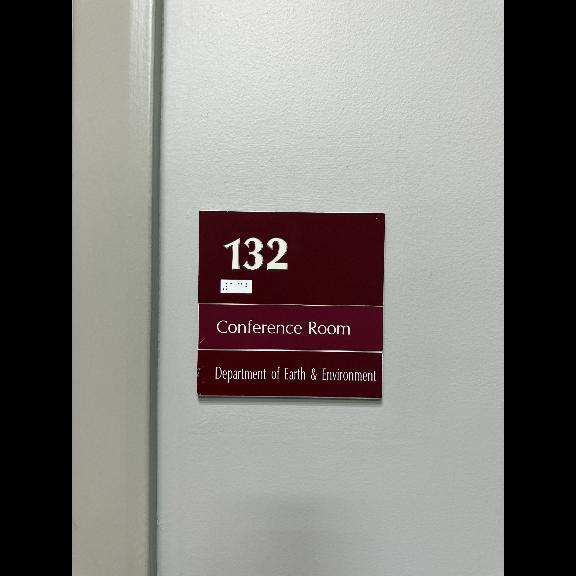

Training Epoch 4/10: 100%|██████████| 95/95 [02:26<00:00,  1.55s/it]


Average Training Loss: 11.51233417611373


Validation Epoch 4/10: 100%|██████████| 27/27 [00:20<00:00,  1.30it/s]


Average Validation Loss: 19.496938069661457


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response
failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.



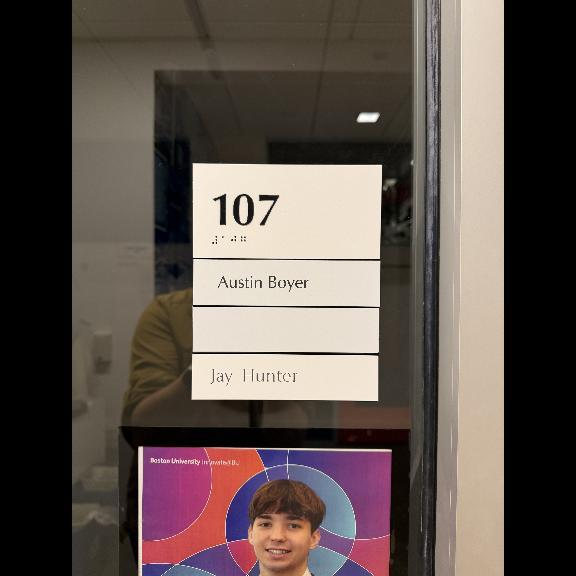
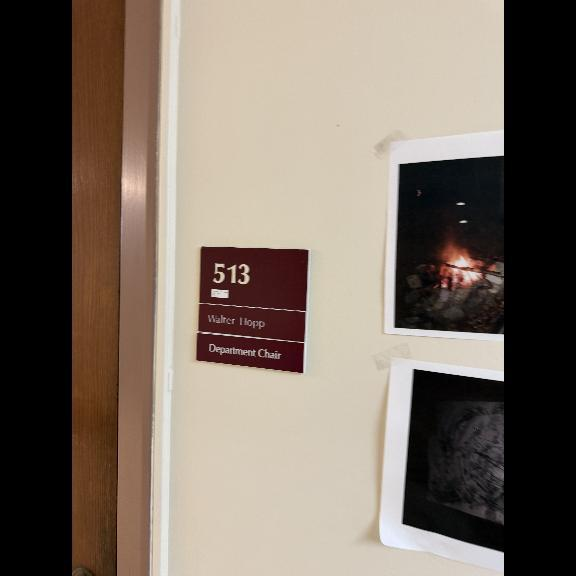
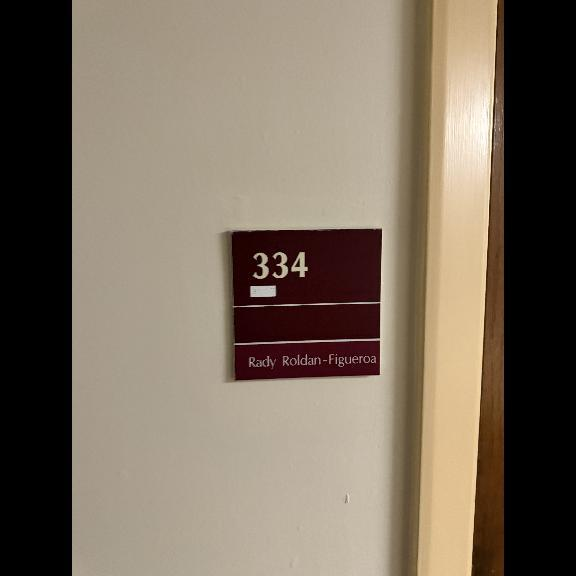
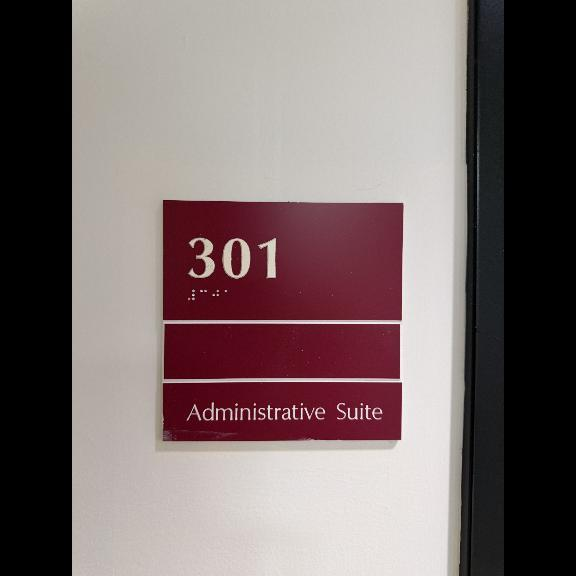
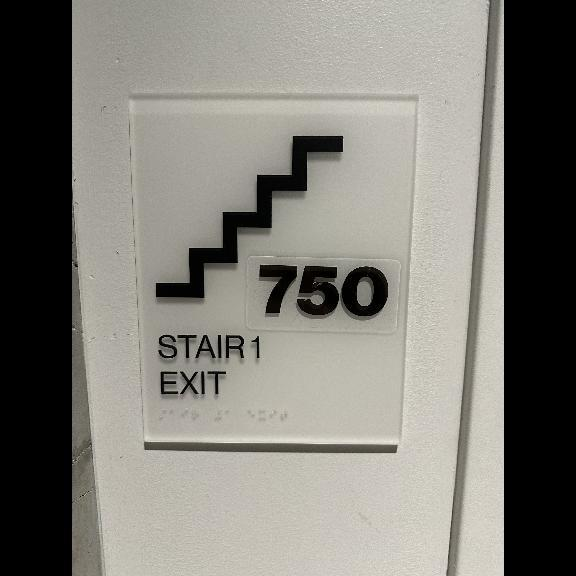
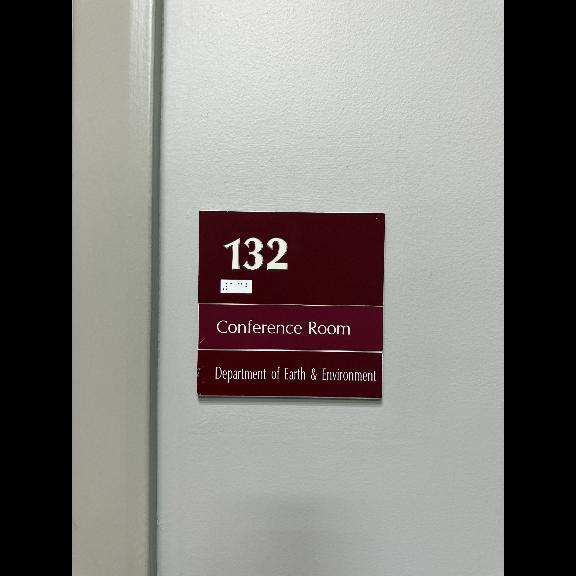

Training Epoch 5/10: 100%|██████████| 95/95 [02:26<00:00,  1.55s/it]


Average Training Loss: 7.483519574215538


Validation Epoch 5/10: 100%|██████████| 27/27 [00:20<00:00,  1.30it/s]


Average Validation Loss: 6.717046702349627


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response
failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.



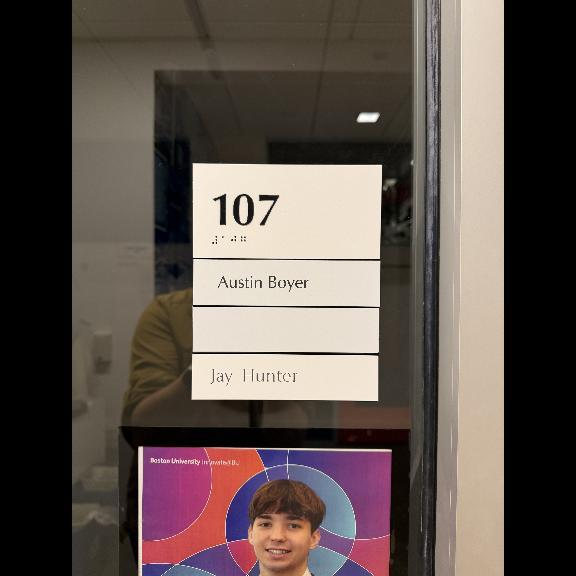
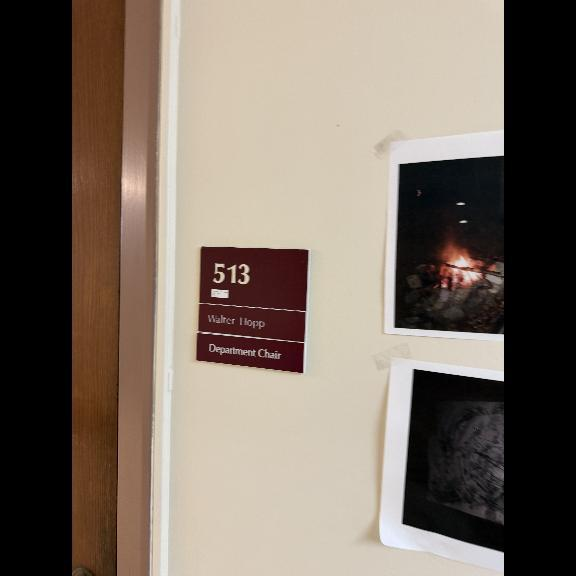
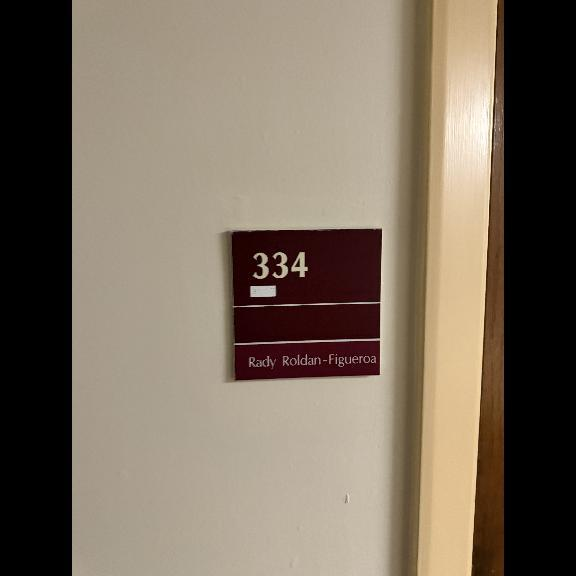
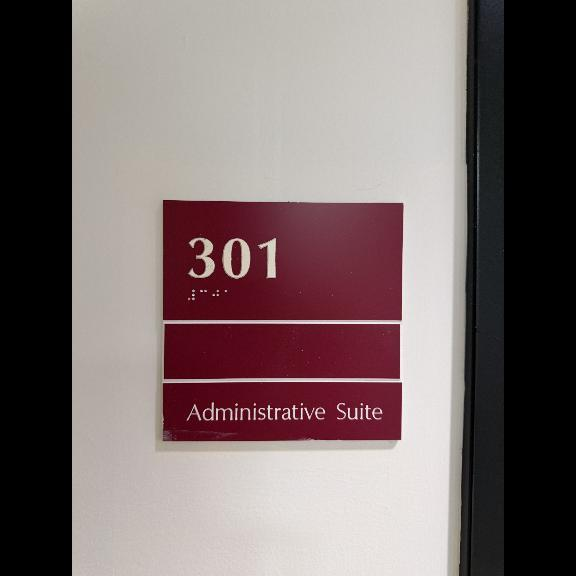
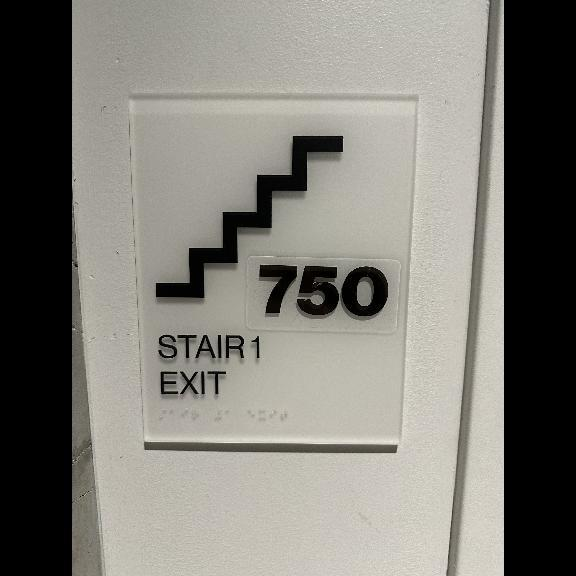
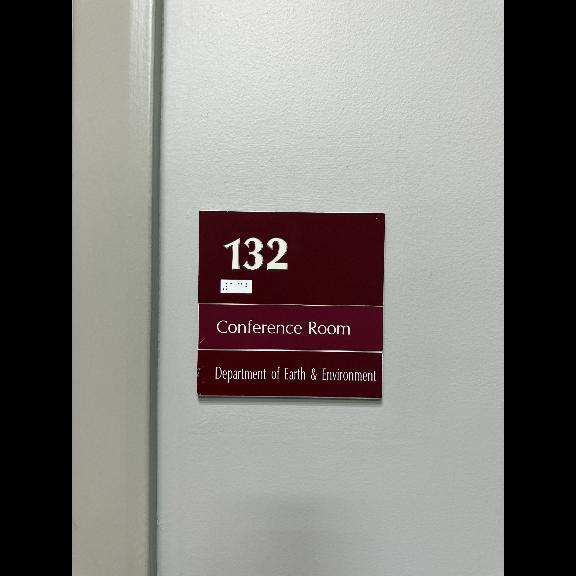

Training Epoch 6/10: 100%|██████████| 95/95 [02:26<00:00,  1.55s/it]


Average Training Loss: 5.250240516662598


Validation Epoch 6/10: 100%|██████████| 27/27 [00:20<00:00,  1.30it/s]
from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


Average Validation Loss: 6.388713395154035
failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.
from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response
failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.
from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response
failed to render model response
failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.



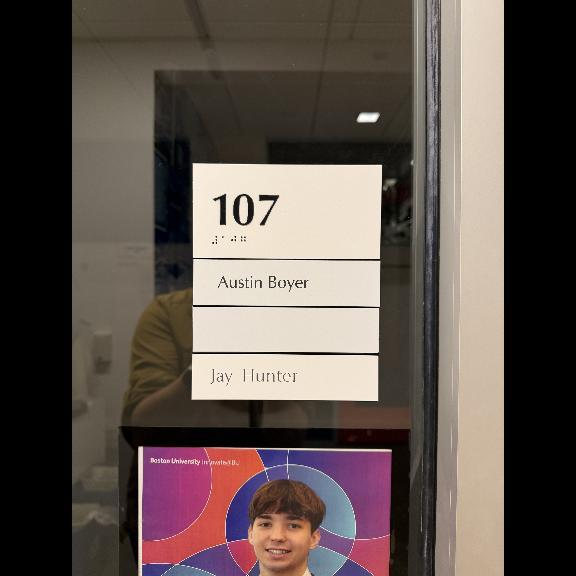
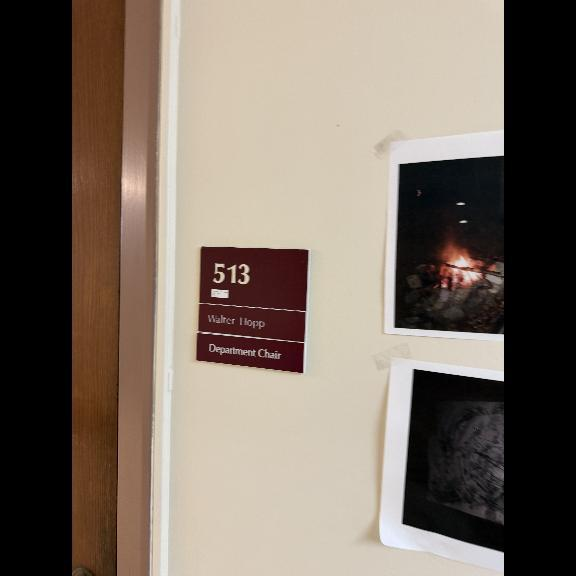
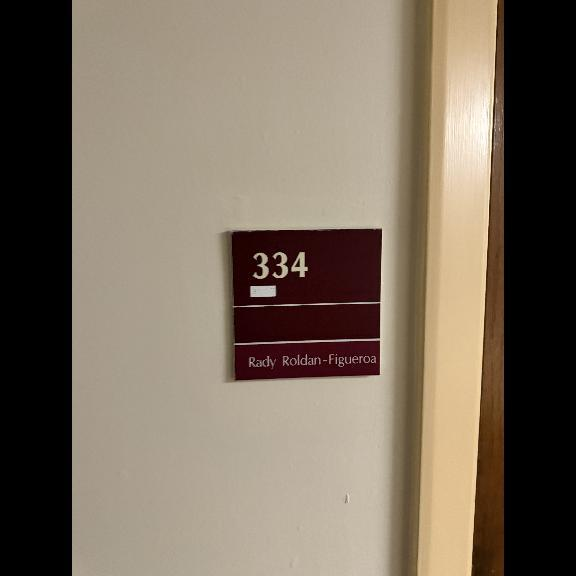
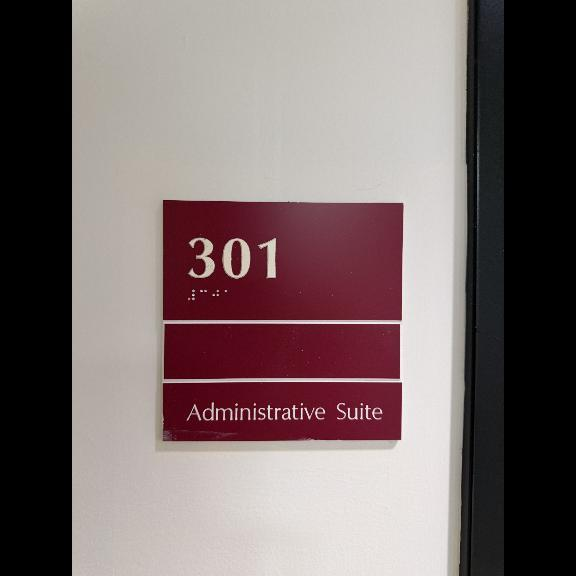
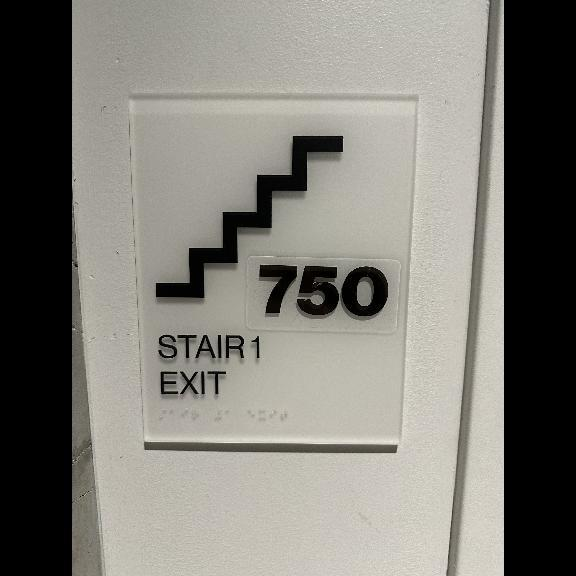
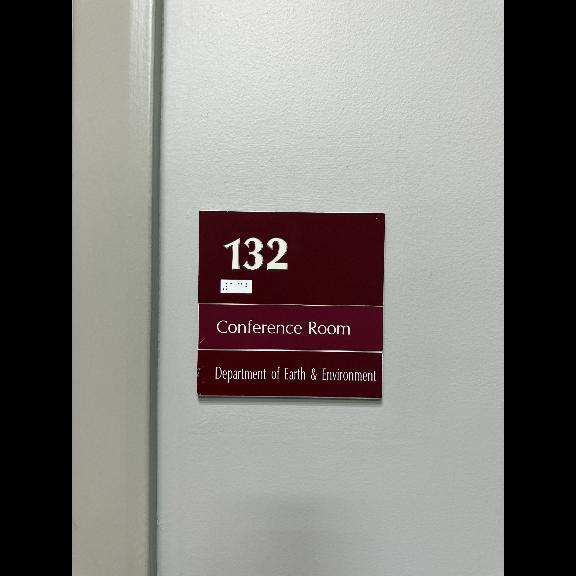

Training Epoch 7/10: 100%|██████████| 95/95 [02:26<00:00,  1.55s/it]


Average Training Loss: 5.026388544785349


Validation Epoch 7/10: 100%|██████████| 27/27 [00:20<00:00,  1.31it/s]


Average Validation Loss: 5.606129557998092


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response
failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.



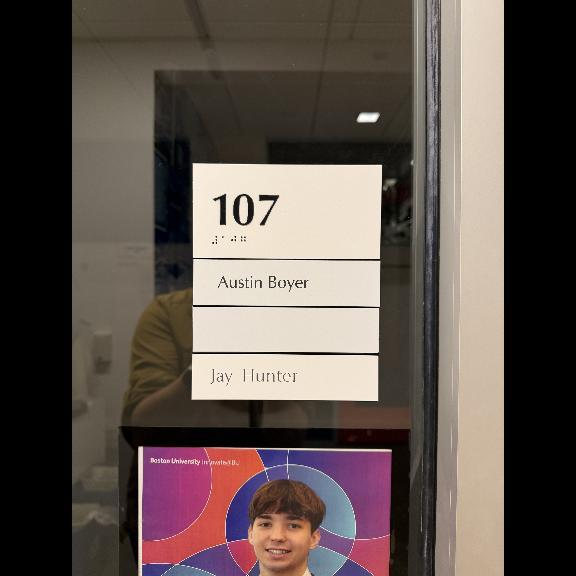
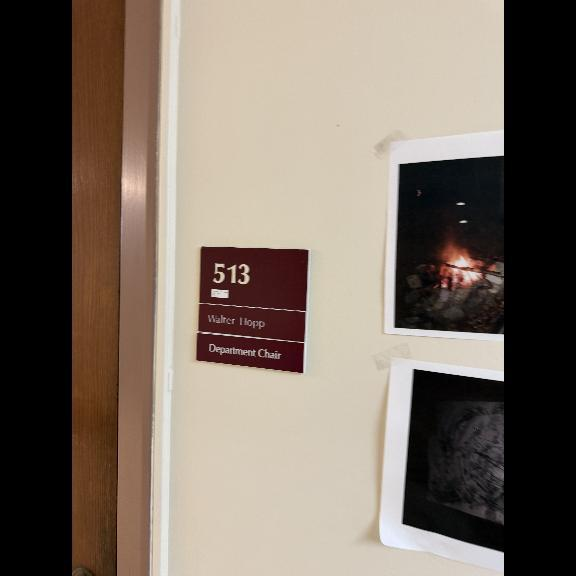
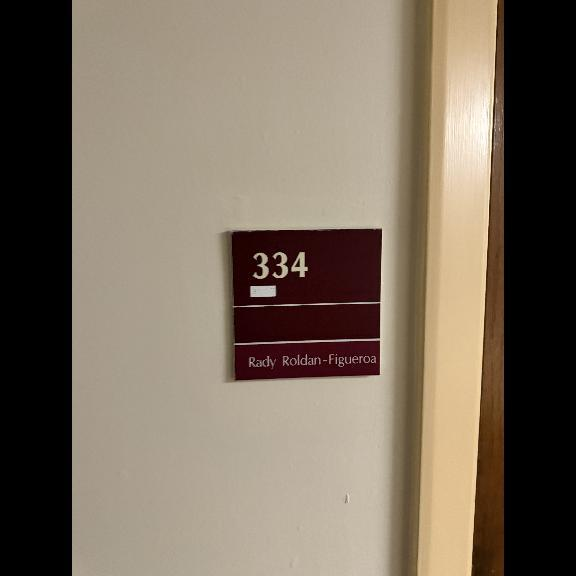
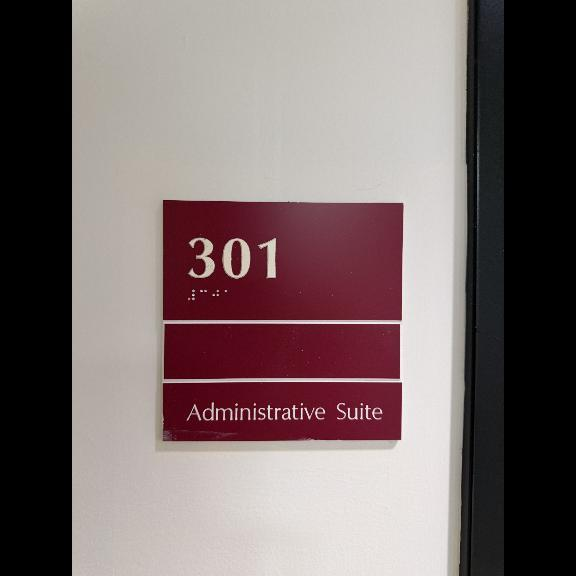
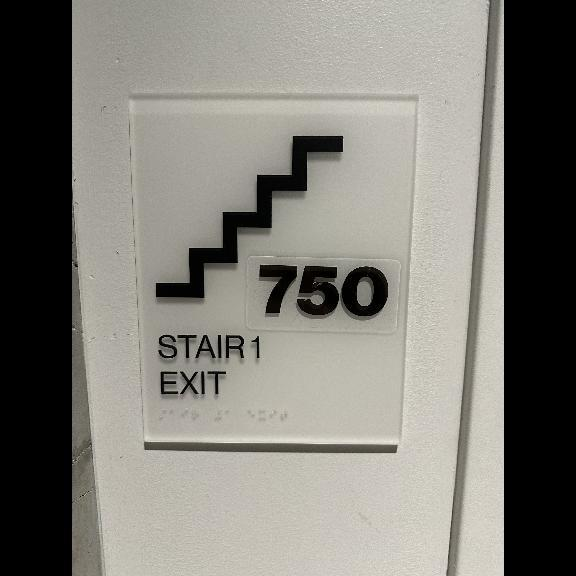
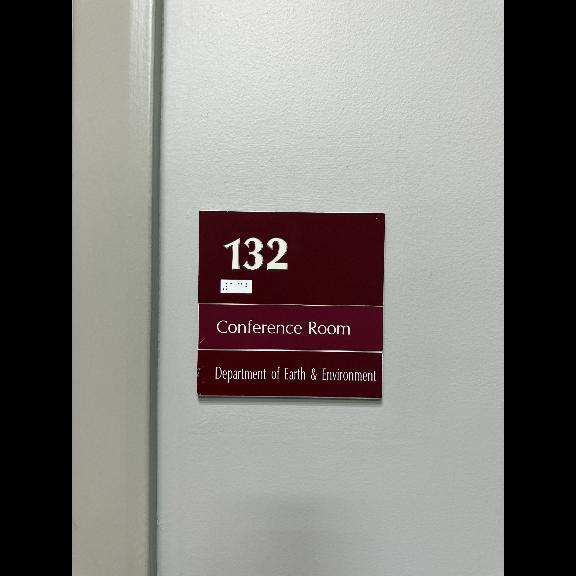

Training Epoch 8/10: 100%|██████████| 95/95 [02:26<00:00,  1.55s/it]


Average Training Loss: 4.83402839459871


Validation Epoch 8/10: 100%|██████████| 27/27 [00:20<00:00,  1.30it/s]


Average Validation Loss: 5.322566191355388


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response
failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.



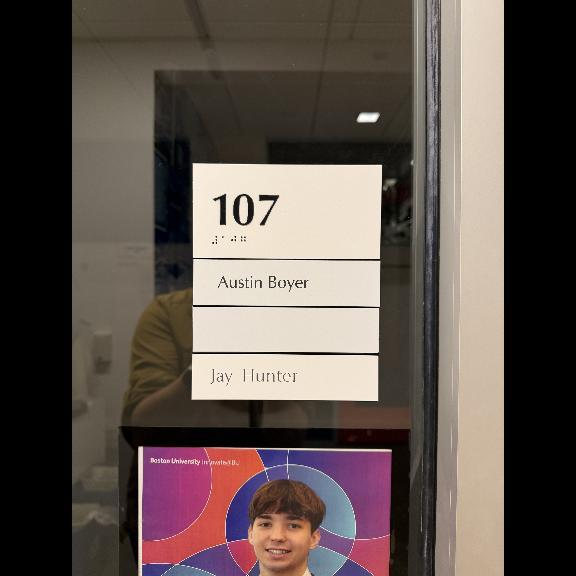
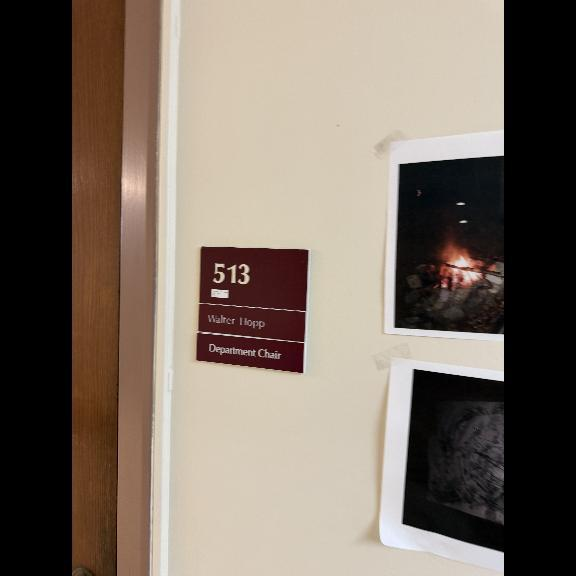
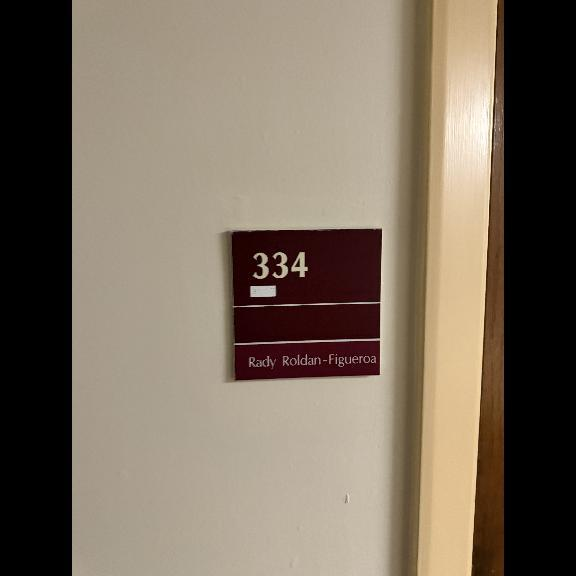
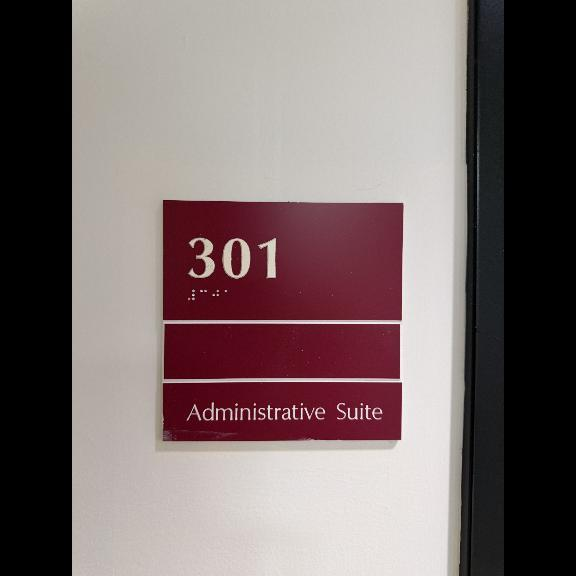
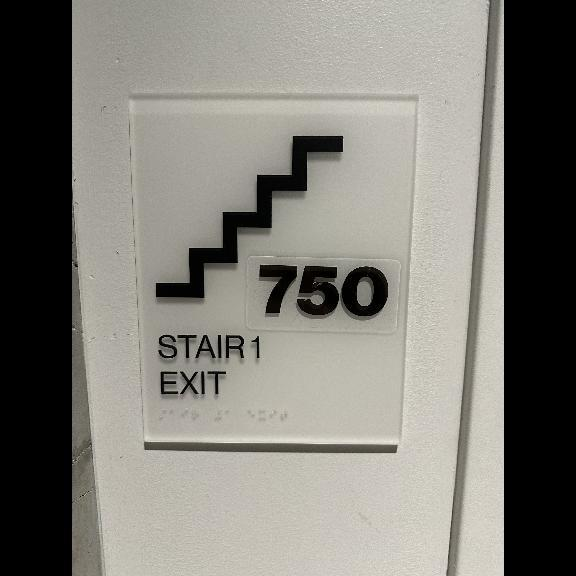
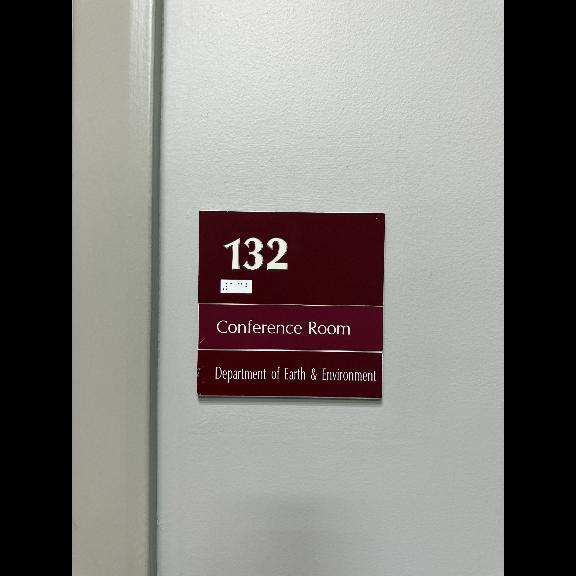

Training Epoch 9/10: 100%|██████████| 95/95 [02:26<00:00,  1.55s/it]


Average Training Loss: 4.772257852554321


Validation Epoch 9/10: 100%|██████████| 27/27 [00:20<00:00,  1.30it/s]


Average Validation Loss: 5.305645730760363


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response
failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.



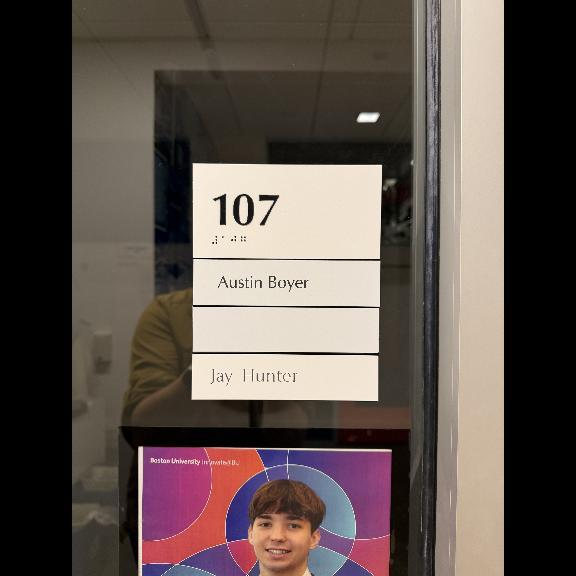
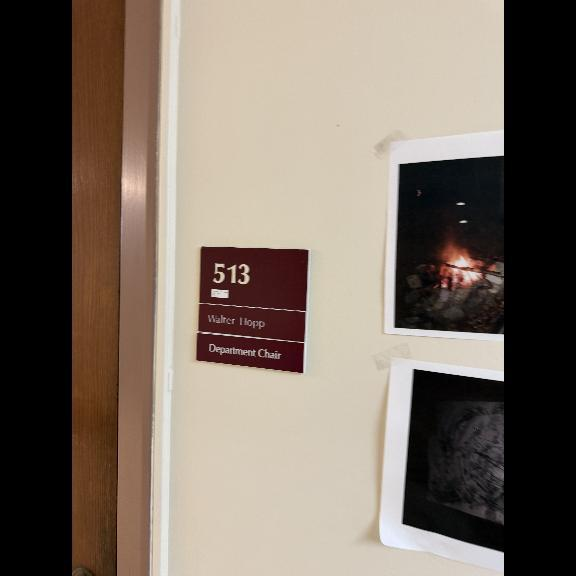
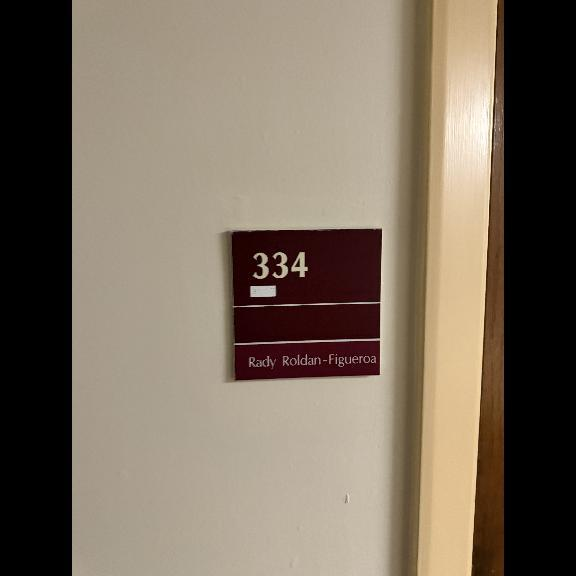
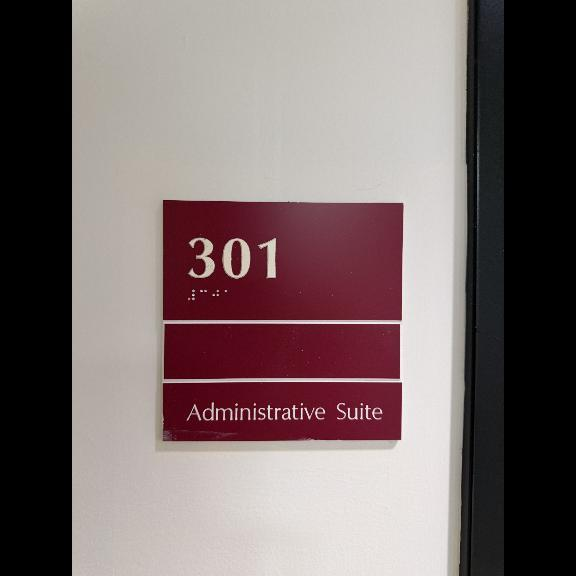
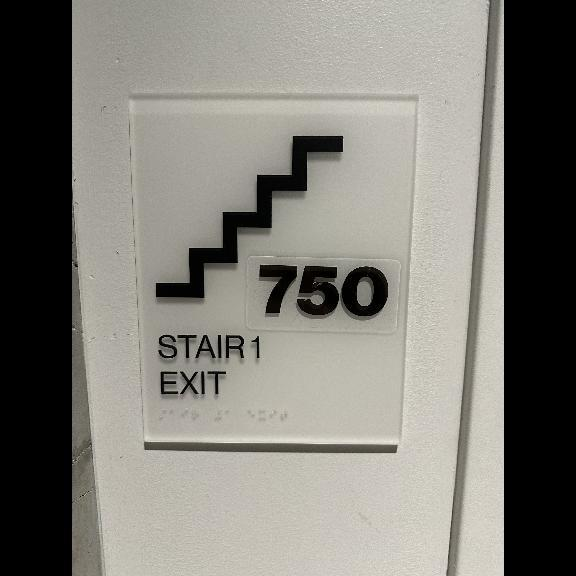
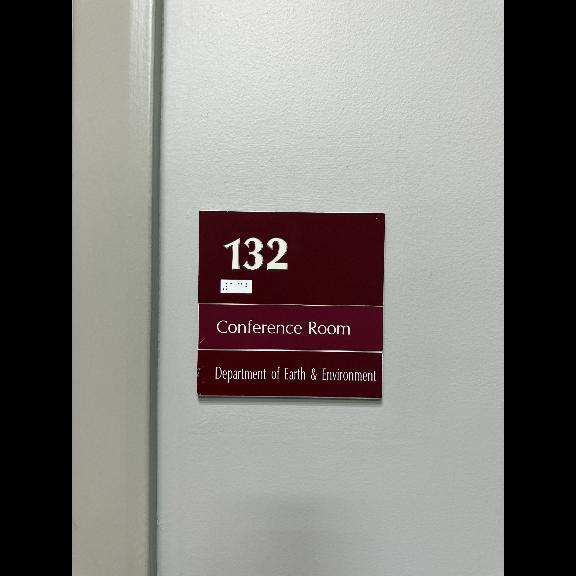

Training Epoch 10/10: 100%|██████████| 95/95 [02:26<00:00,  1.55s/it]


Average Training Loss: 4.6493203765467594


Validation Epoch 10/10: 100%|██████████| 27/27 [00:20<00:00,  1.31it/s]


Average Validation Loss: 5.241829077402751


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response
failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.



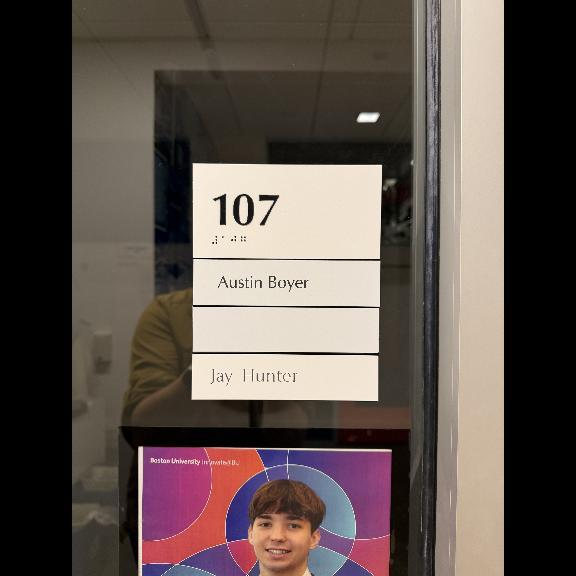
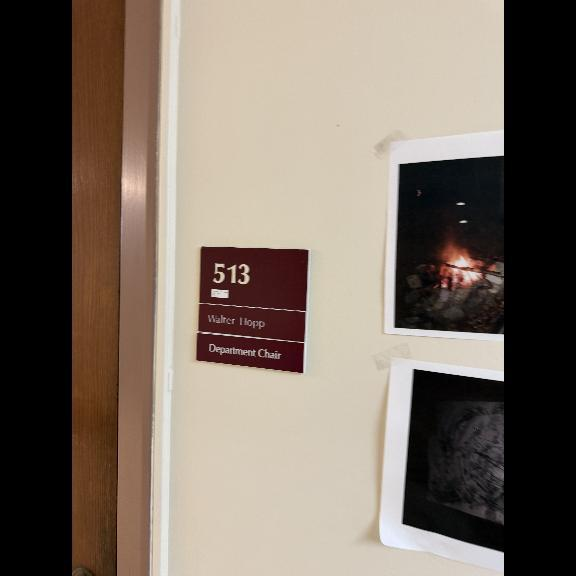
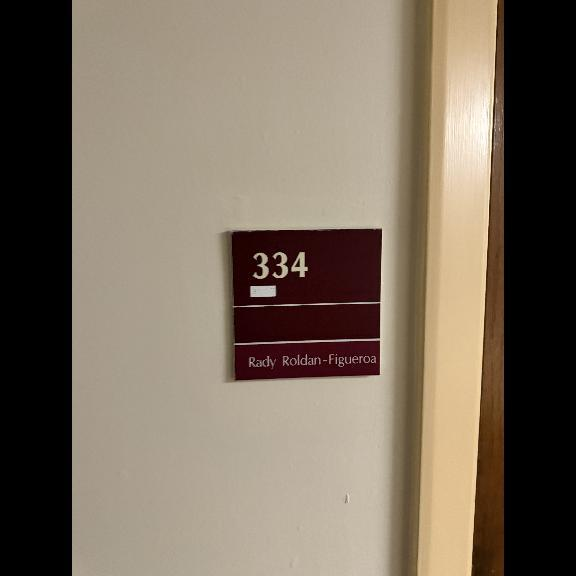
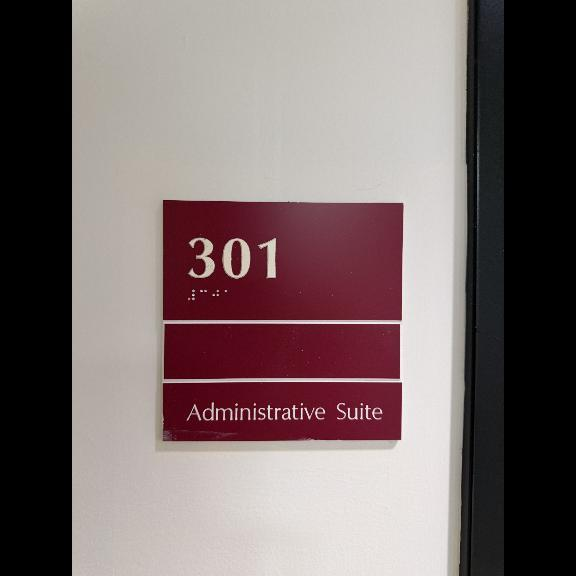
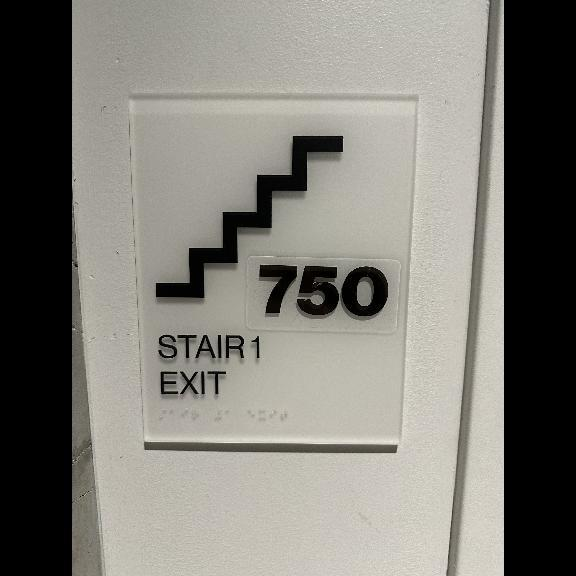
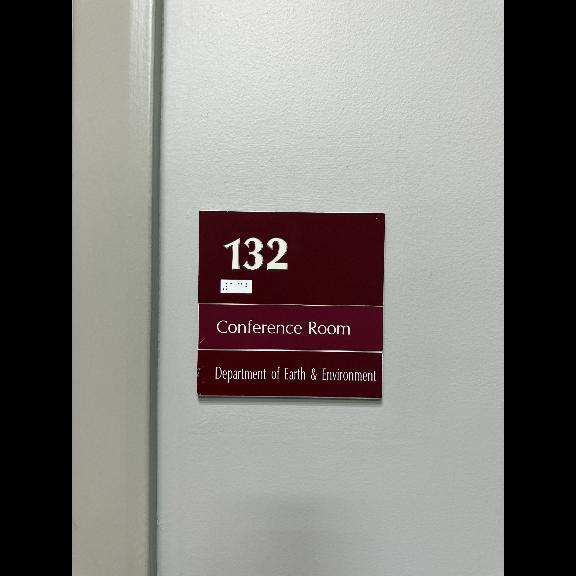

from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response
failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.



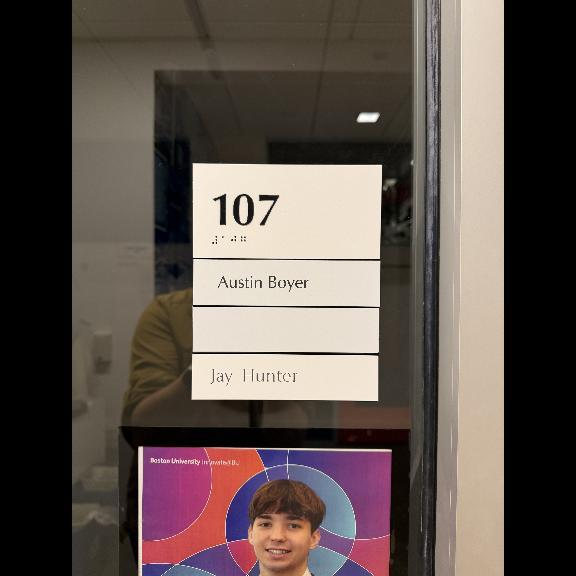
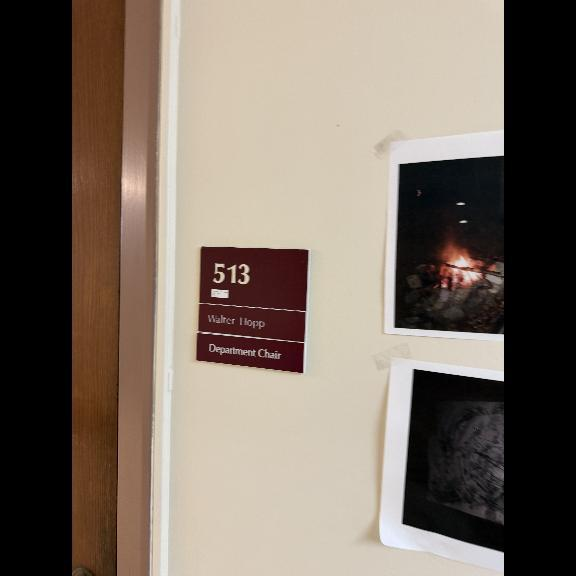
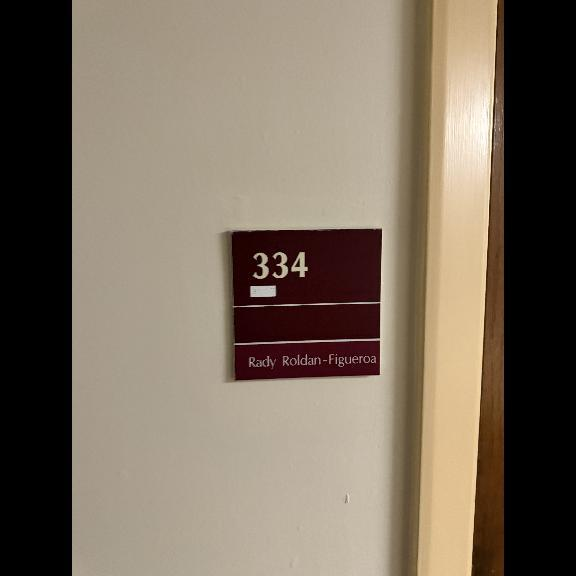
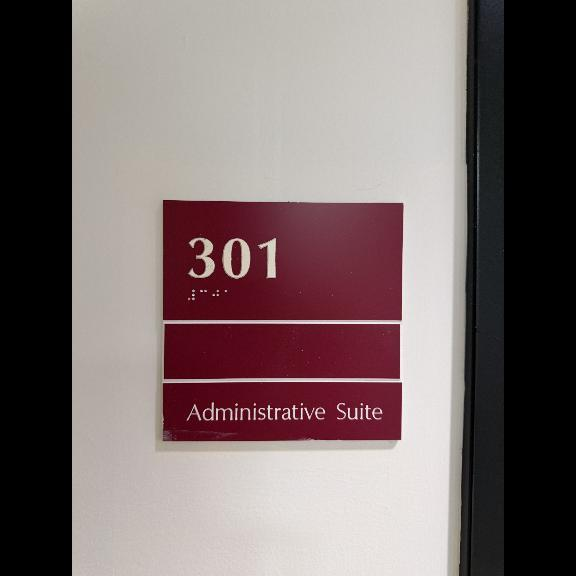
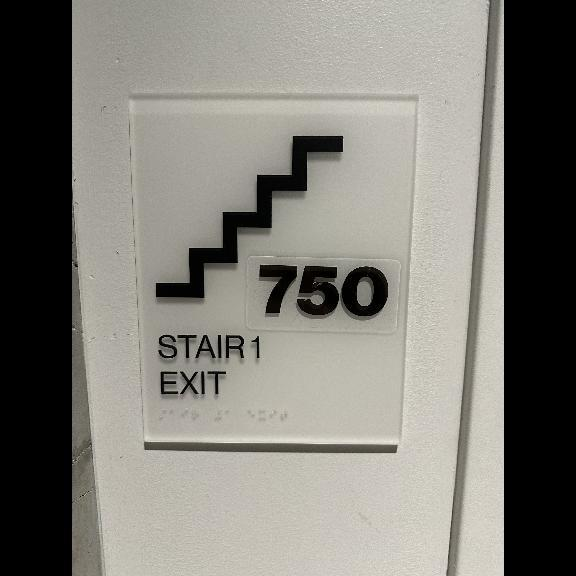
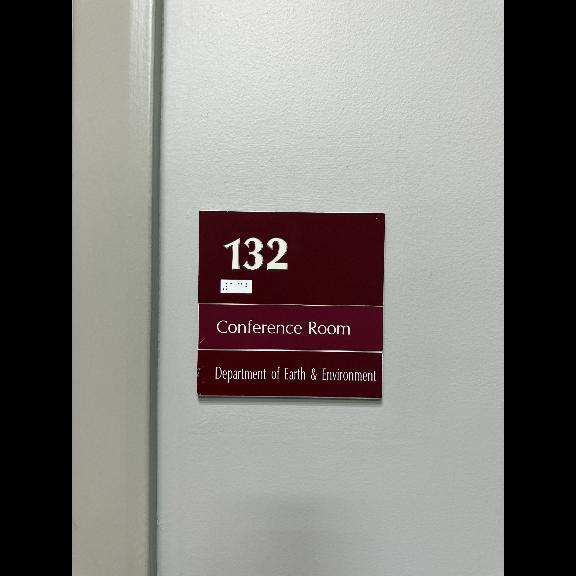

Training Epoch 1/10: 100%|██████████| 95/95 [02:18<00:00,  1.46s/it]


Average Training Loss: nan


Validation Epoch 1/10: 100%|██████████| 27/27 [00:19<00:00,  1.40it/s]
from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


Average Validation Loss: nan
failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.
from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response
failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.
from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response
failed to render model response
failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.



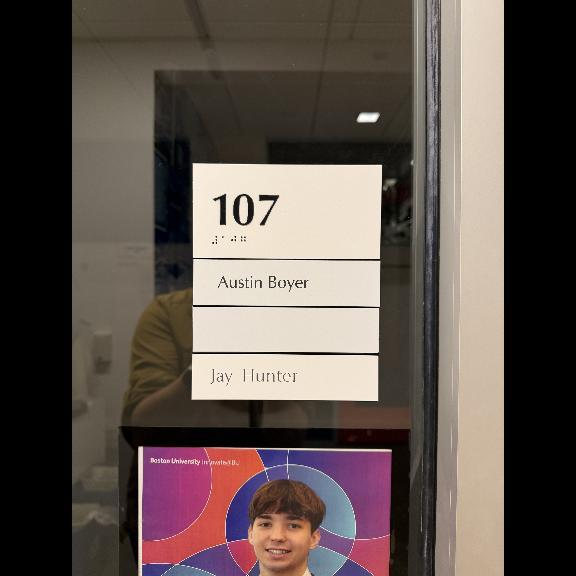
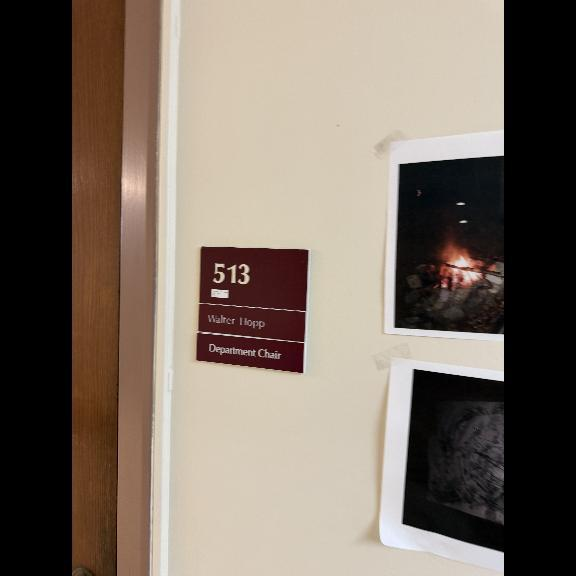
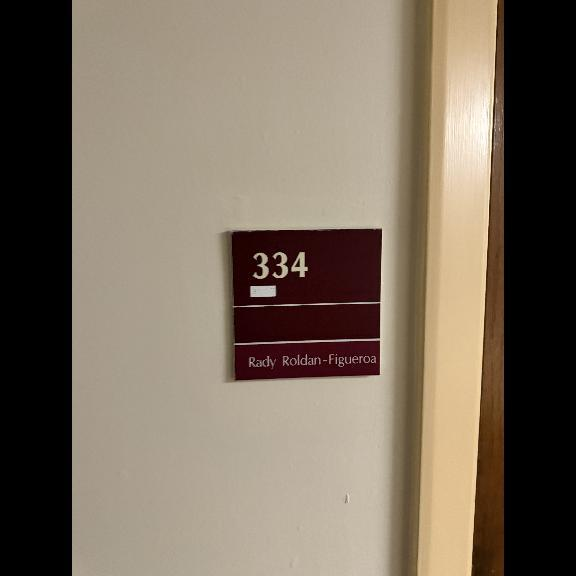
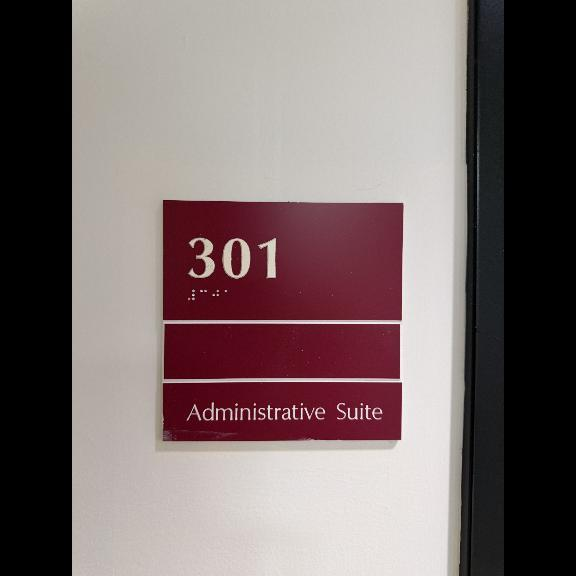
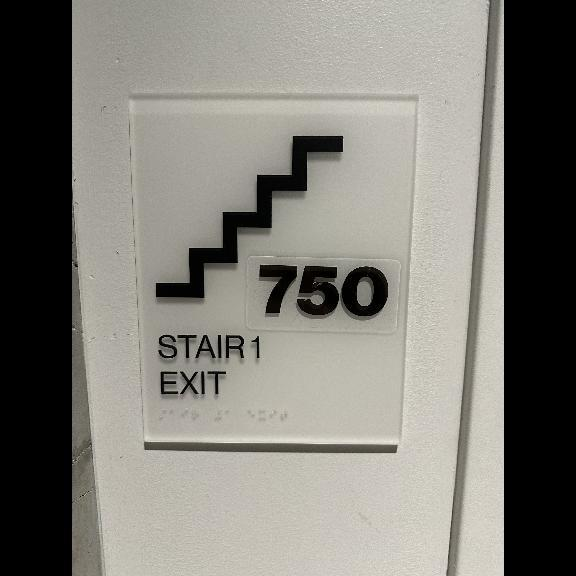
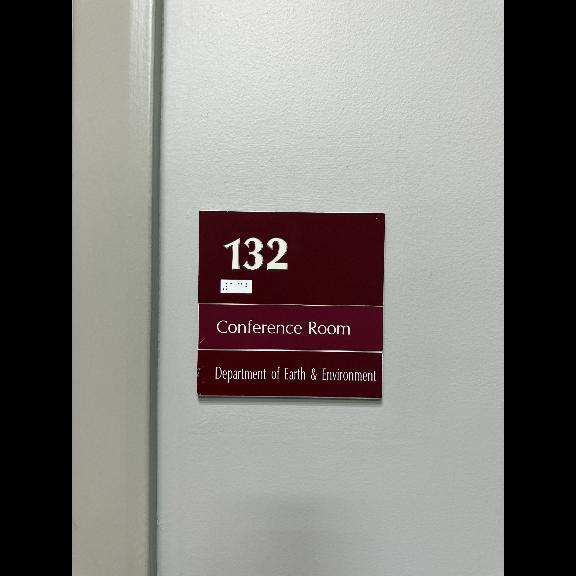

Training Epoch 2/10: 100%|██████████| 95/95 [02:18<00:00,  1.46s/it]


Average Training Loss: nan


Validation Epoch 2/10: 100%|██████████| 27/27 [00:19<00:00,  1.39it/s]
from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


Average Validation Loss: nan
failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.
from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response
failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.
from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response
failed to render model response
failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.



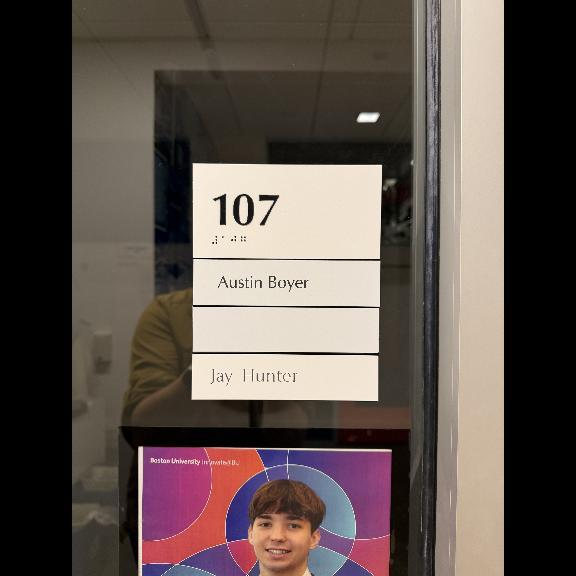
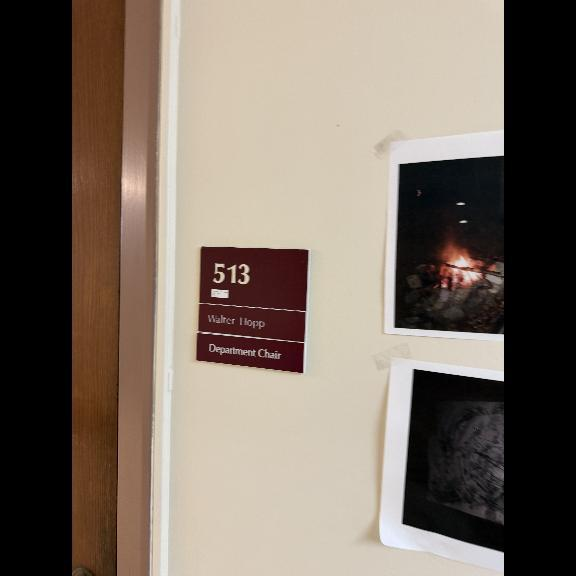
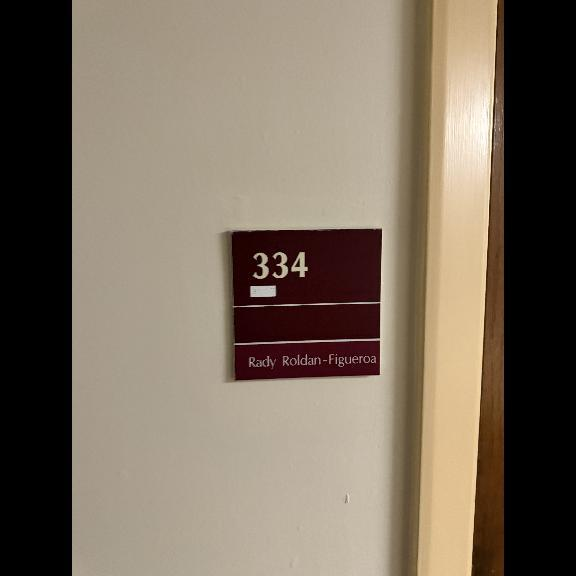
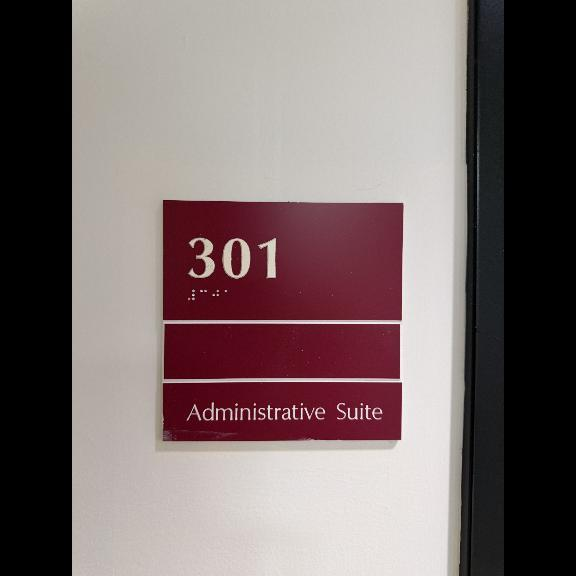
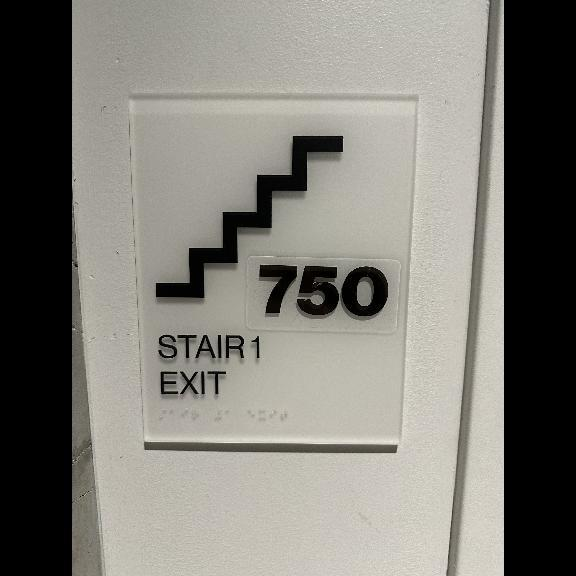
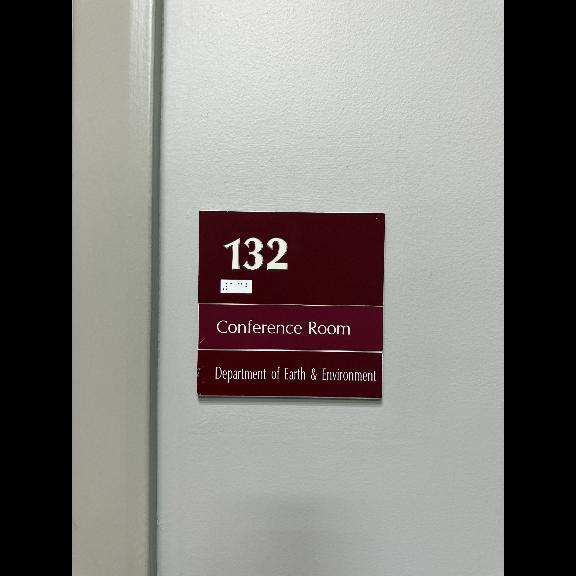

Training Epoch 3/10: 100%|██████████| 95/95 [02:18<00:00,  1.46s/it]


Average Training Loss: nan


Validation Epoch 3/10: 100%|██████████| 27/27 [00:19<00:00,  1.40it/s]
from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


Average Validation Loss: nan
failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.
from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response
failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.
from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response
failed to render model response
failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.



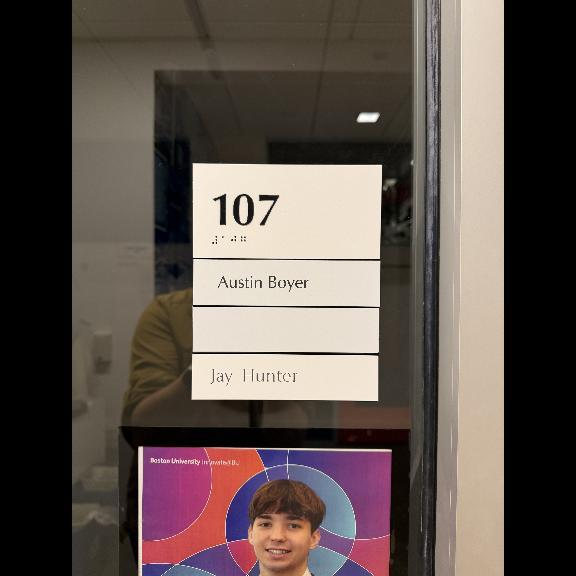
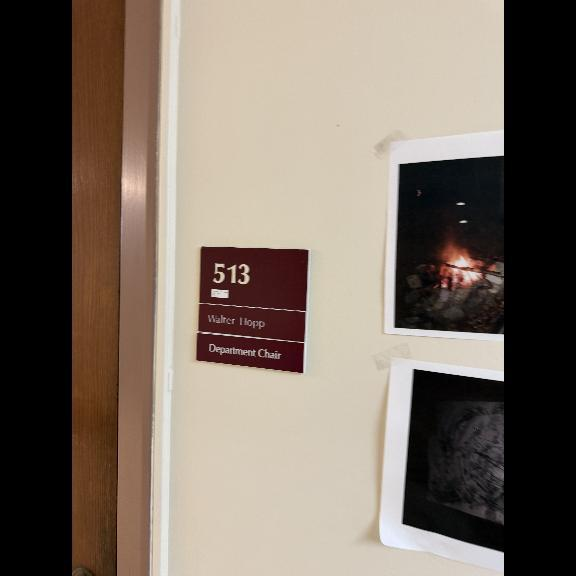
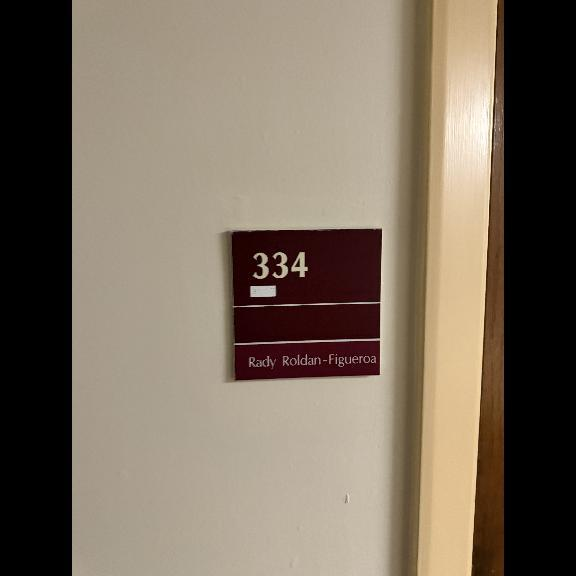
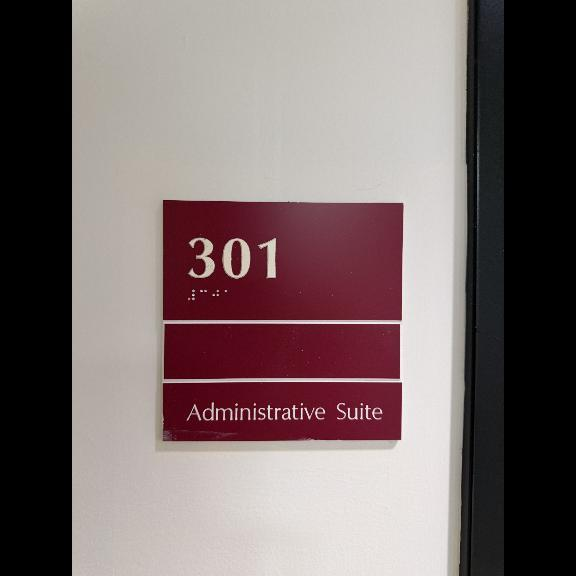
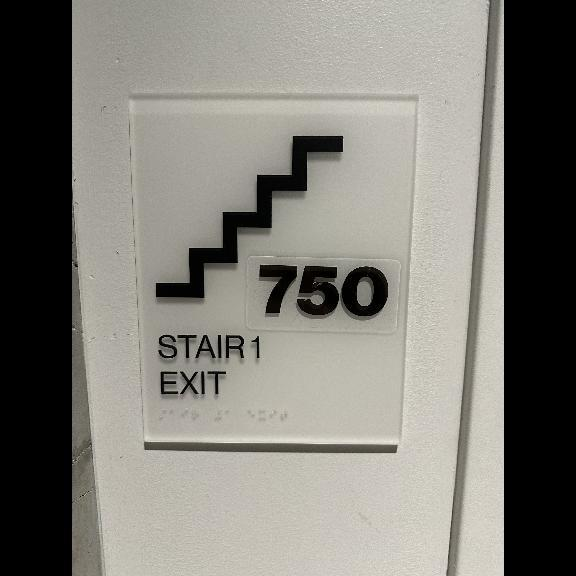
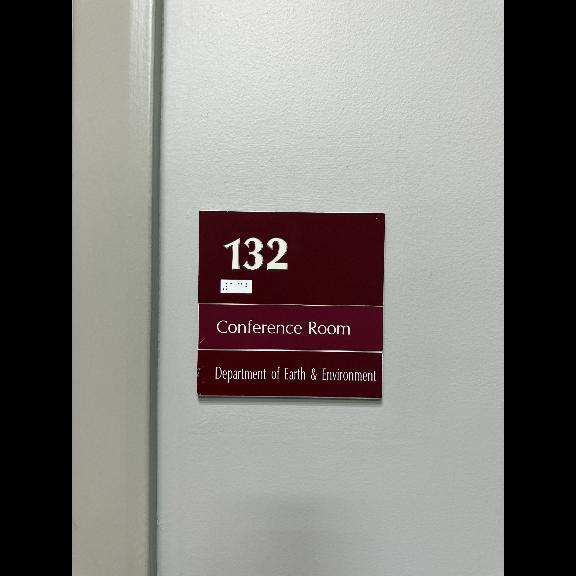

Training Epoch 4/10: 100%|██████████| 95/95 [02:18<00:00,  1.45s/it]


Average Training Loss: nan


Validation Epoch 4/10: 100%|██████████| 27/27 [00:19<00:00,  1.39it/s]
from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


Average Validation Loss: nan
failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.
from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response
failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.
from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response
failed to render model response
failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.



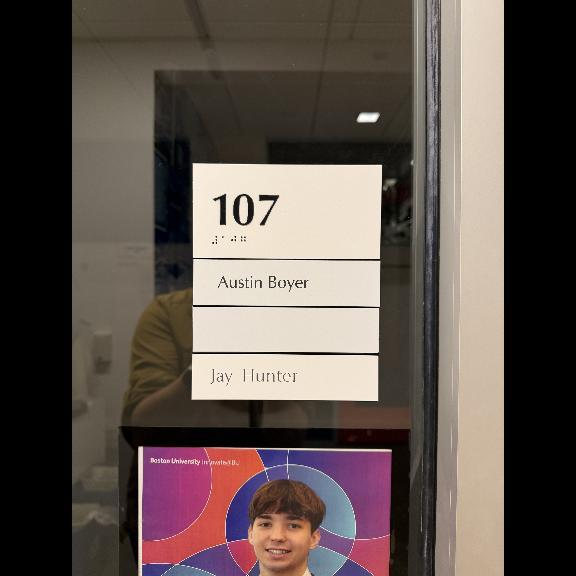
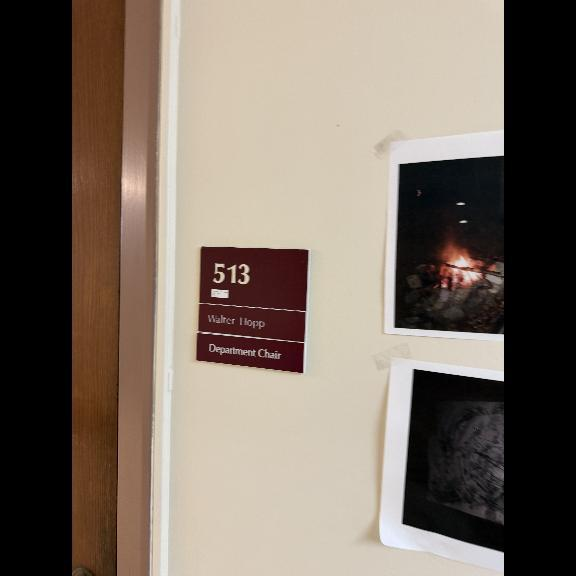
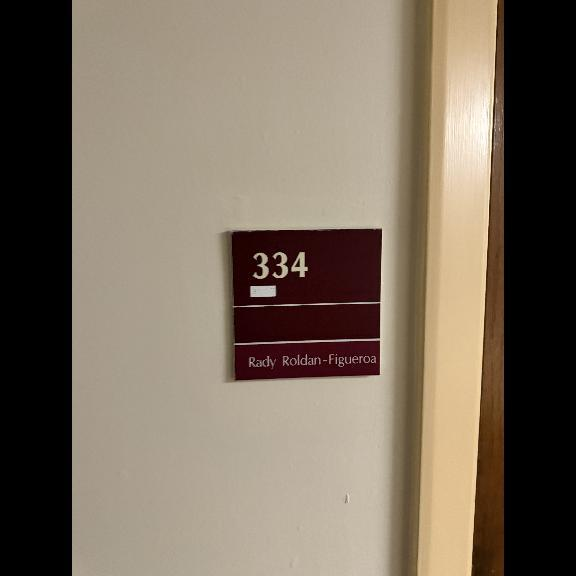
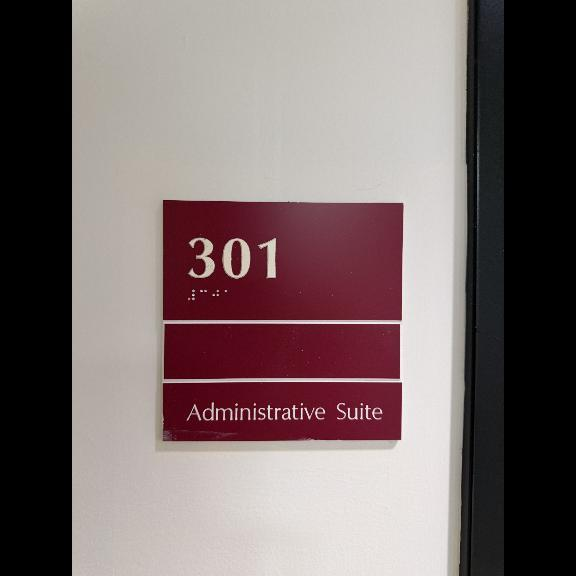
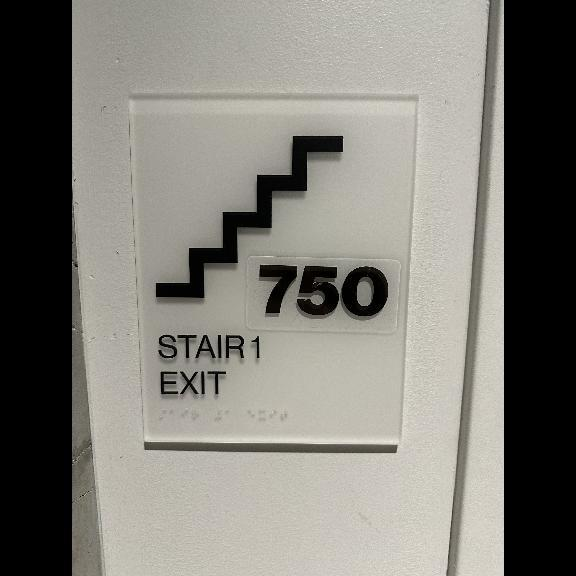
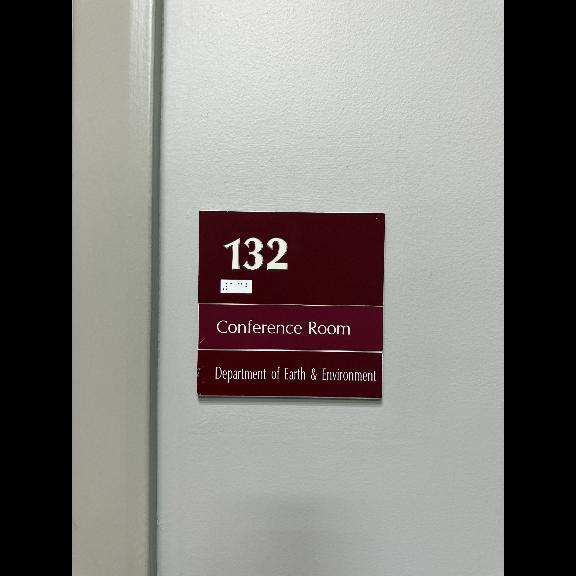

Training Epoch 5/10: 100%|██████████| 95/95 [02:18<00:00,  1.45s/it]


Average Training Loss: nan


Validation Epoch 5/10: 100%|██████████| 27/27 [00:19<00:00,  1.40it/s]
from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


Average Validation Loss: nan
failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.
from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response
failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.
from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response
failed to render model response
failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.



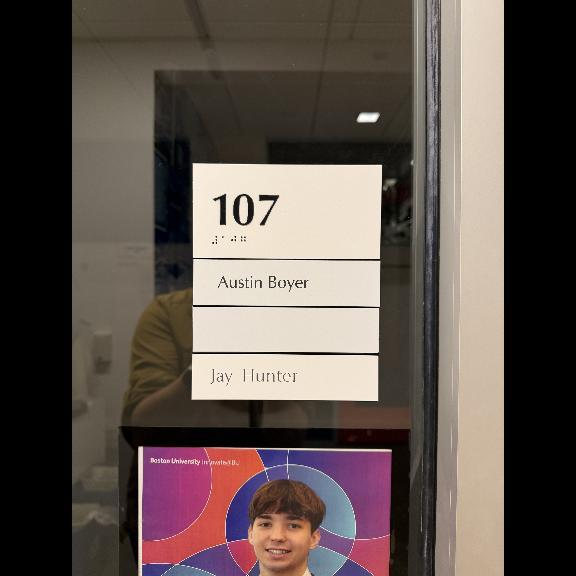
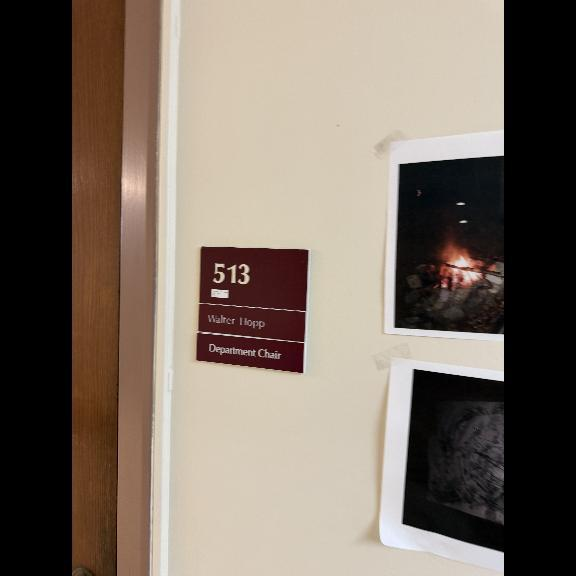
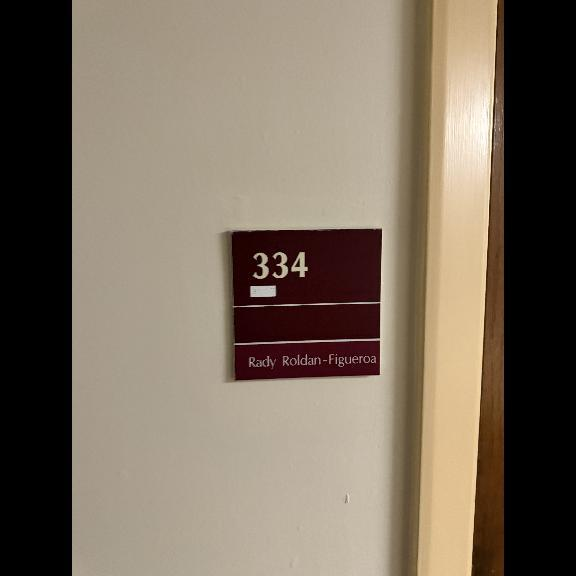
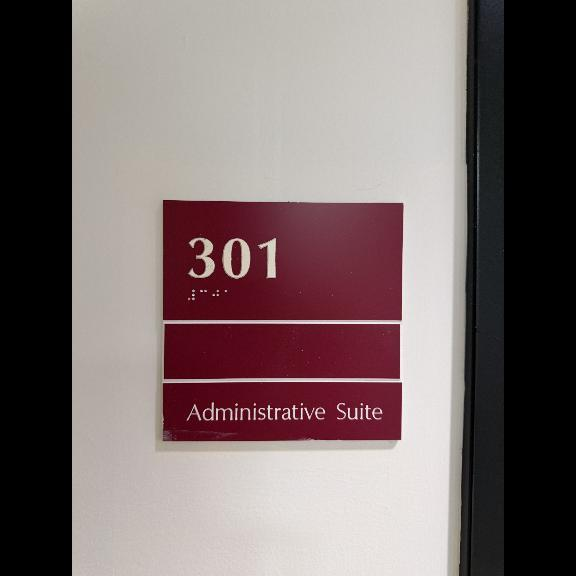
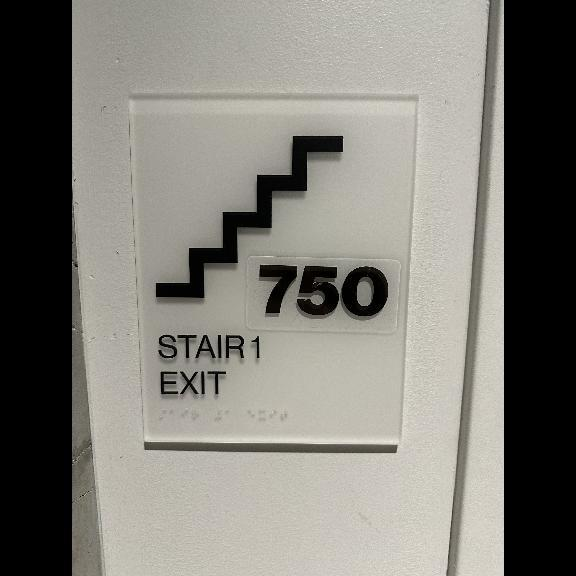
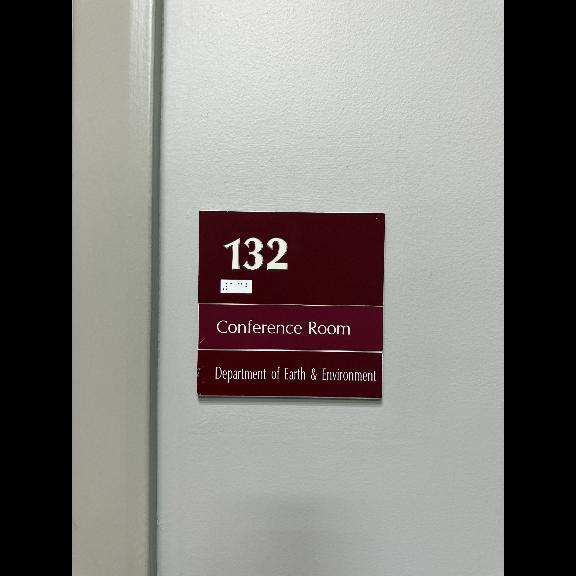

Training Epoch 6/10: 100%|██████████| 95/95 [02:18<00:00,  1.45s/it]


Average Training Loss: nan


Validation Epoch 6/10: 100%|██████████| 27/27 [00:19<00:00,  1.40it/s]
from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


Average Validation Loss: nan
failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.
from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response
failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.
from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response
failed to render model response
failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.



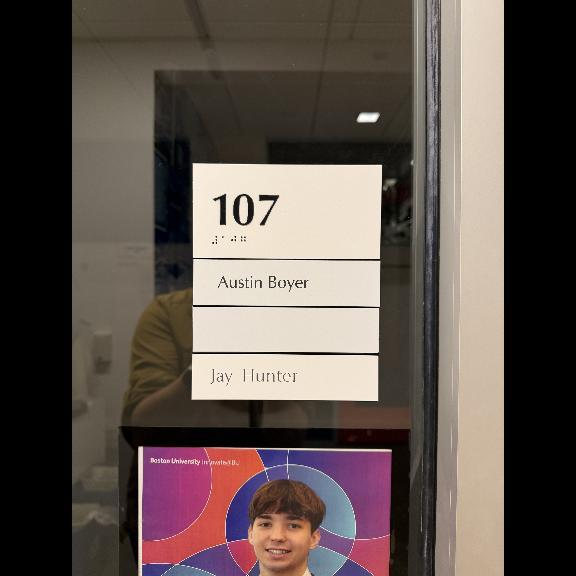
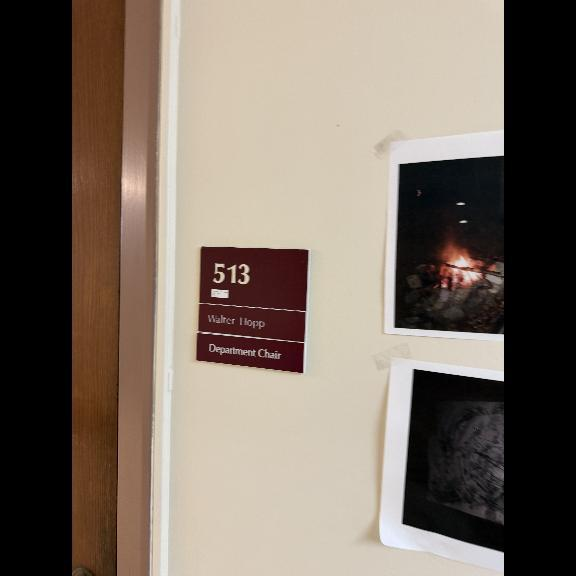
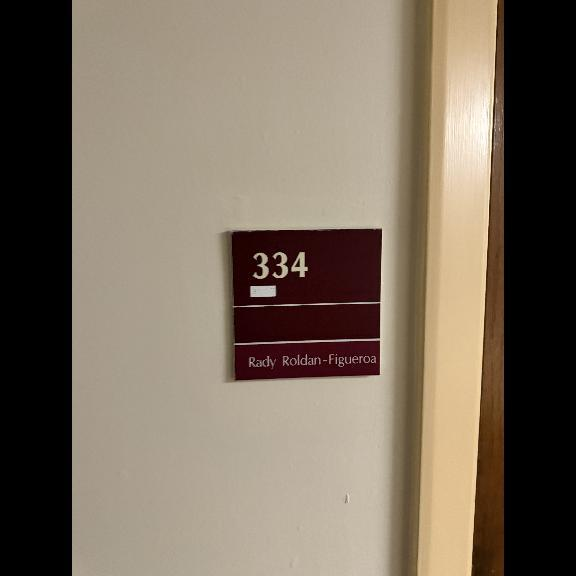
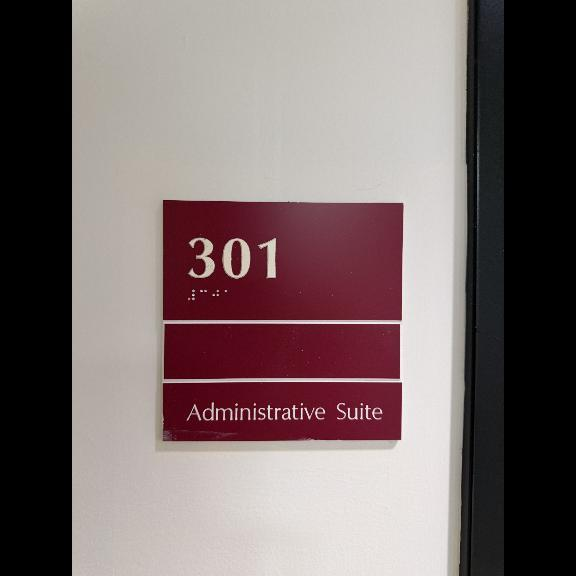
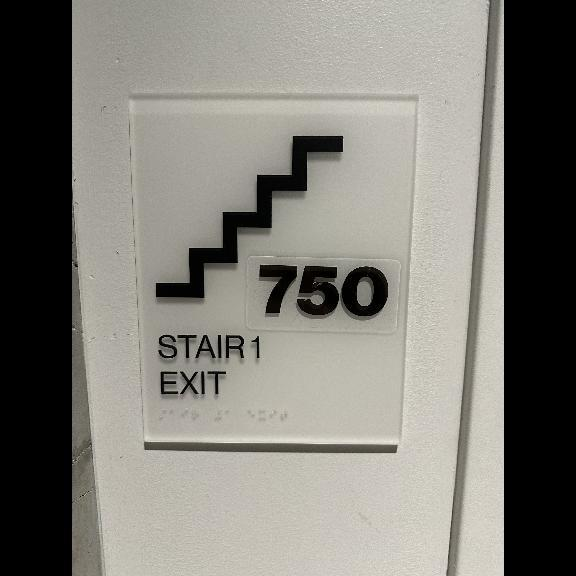
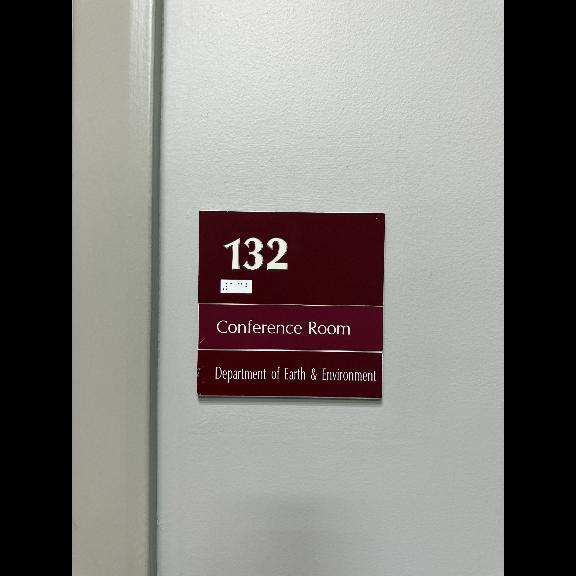

Training Epoch 7/10: 100%|██████████| 95/95 [02:18<00:00,  1.46s/it]


Average Training Loss: nan


Validation Epoch 7/10: 100%|██████████| 27/27 [00:19<00:00,  1.39it/s]
from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


Average Validation Loss: nan
failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.
from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response
failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.
from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response
failed to render model response
failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.



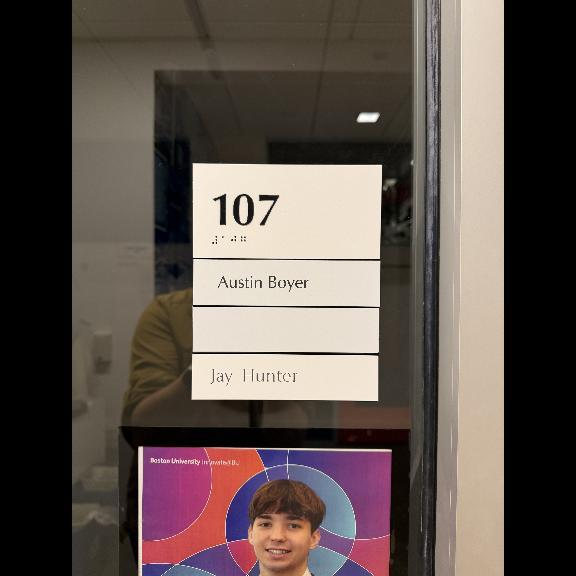
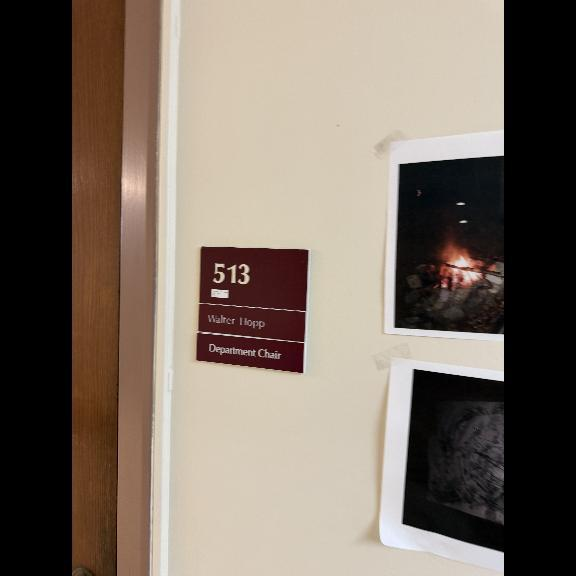
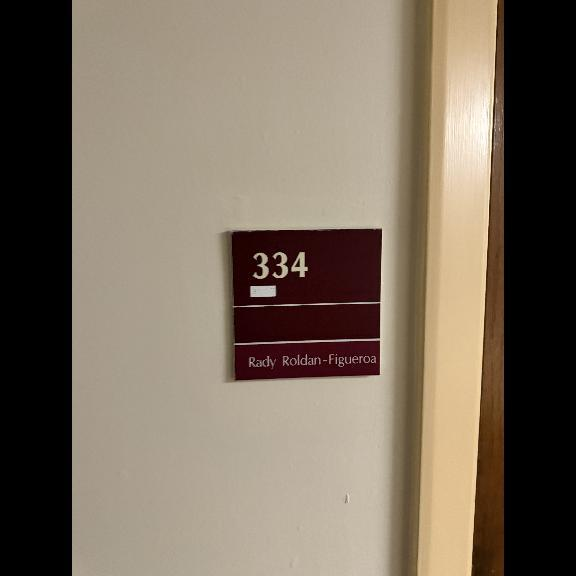
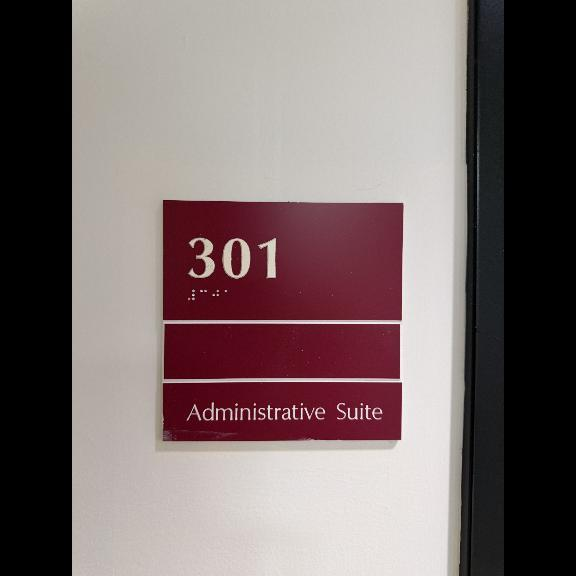
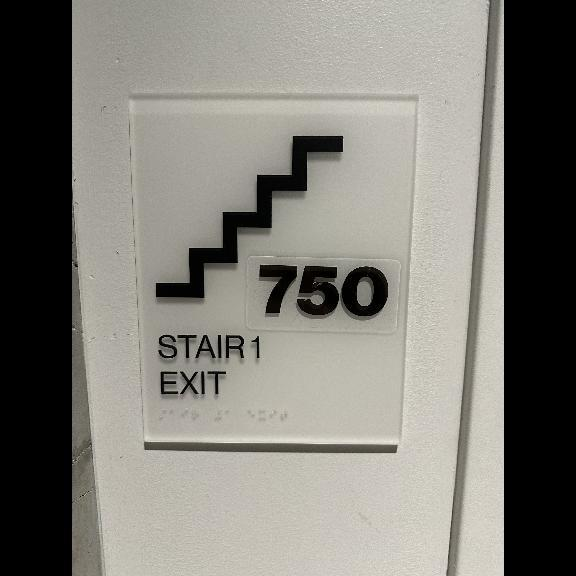
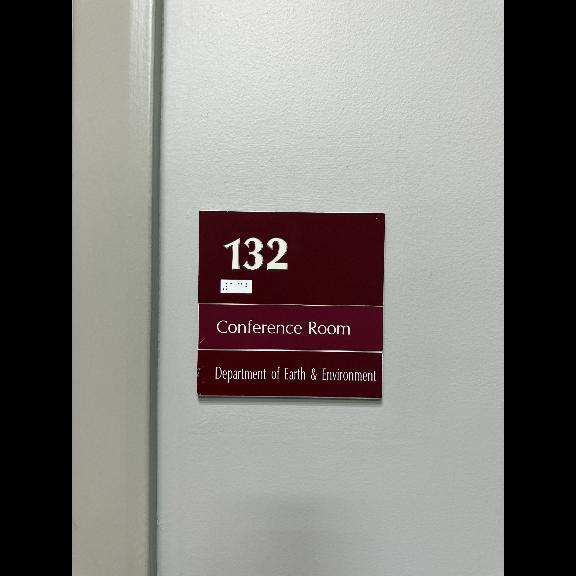

Training Epoch 8/10: 100%|██████████| 95/95 [02:18<00:00,  1.45s/it]


Average Training Loss: nan


Validation Epoch 8/10: 100%|██████████| 27/27 [00:19<00:00,  1.40it/s]
from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


Average Validation Loss: nan
failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.
from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response
failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.
from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response
failed to render model response
failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.



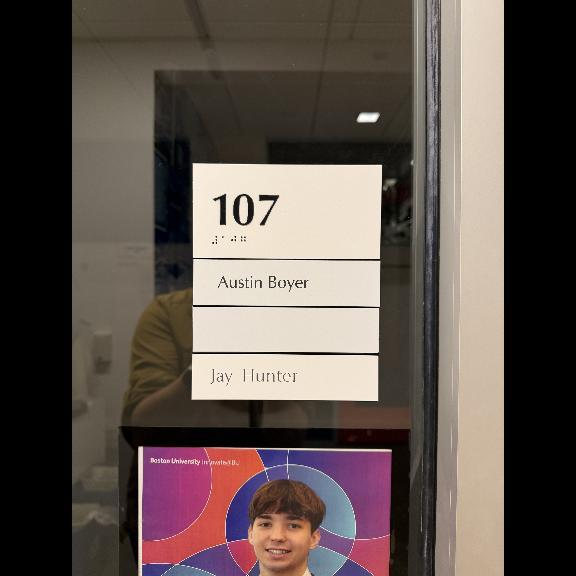
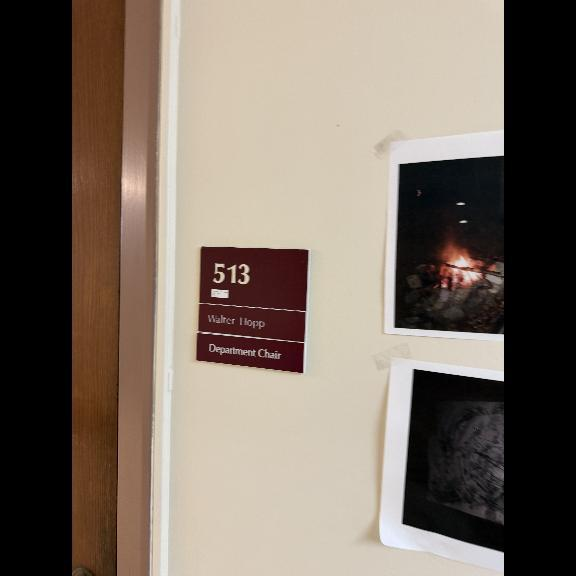
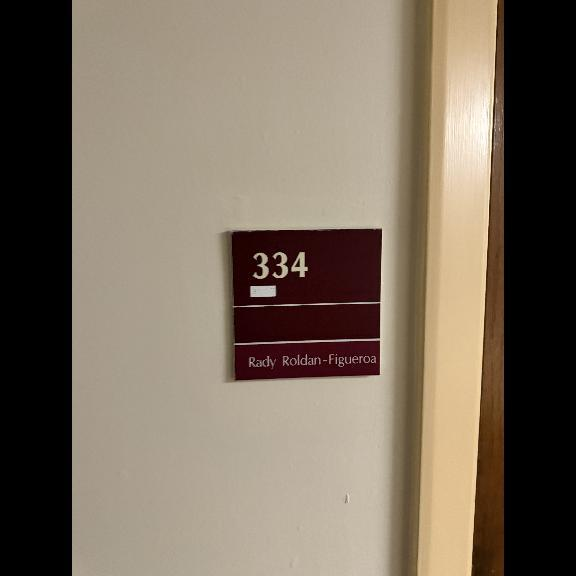
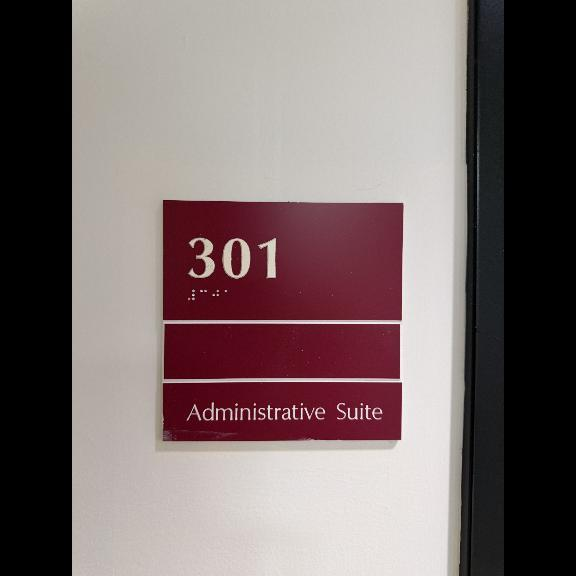
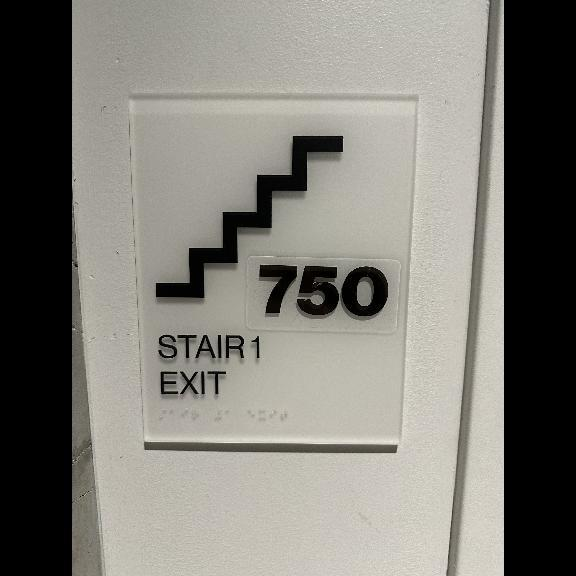
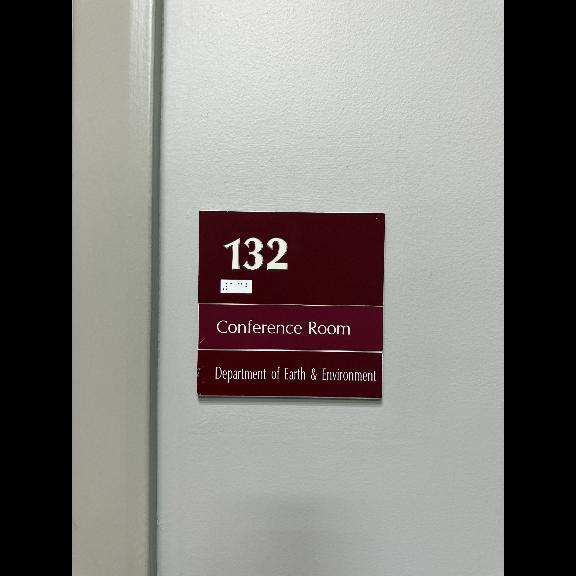

Training Epoch 9/10: 100%|██████████| 95/95 [02:18<00:00,  1.46s/it]


Average Training Loss: nan


Validation Epoch 9/10: 100%|██████████| 27/27 [00:19<00:00,  1.39it/s]
from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


Average Validation Loss: nan
failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.
from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response
failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.
from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response
failed to render model response
failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.



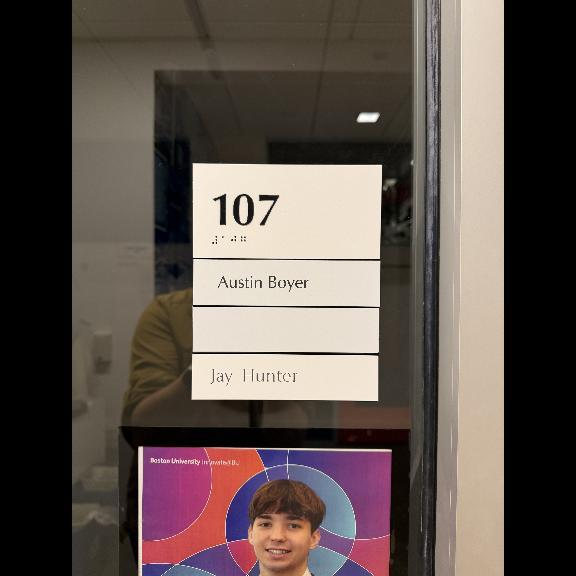
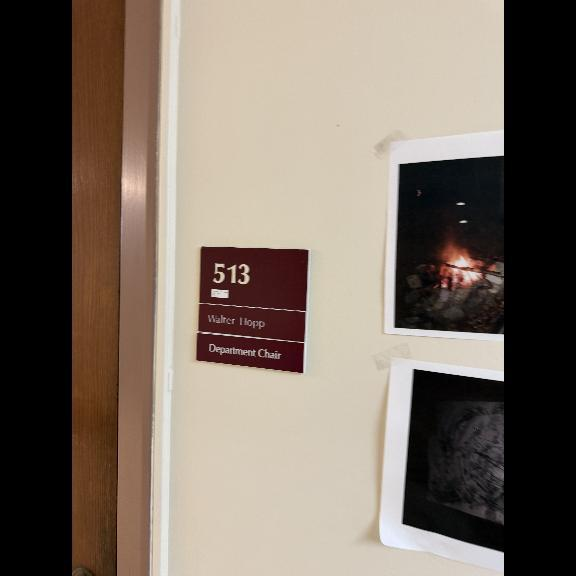
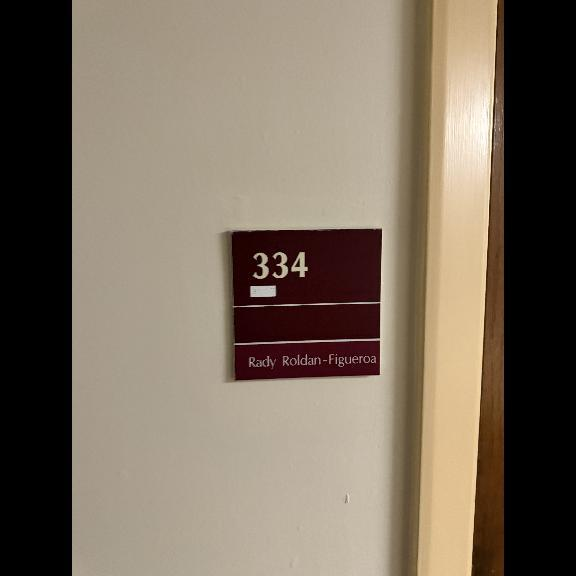
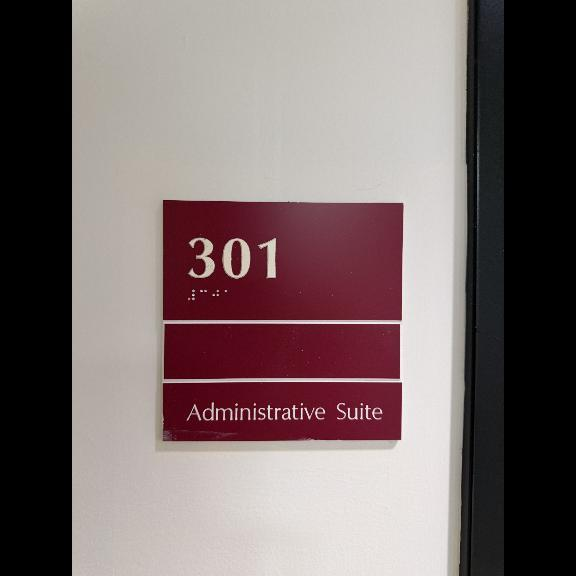
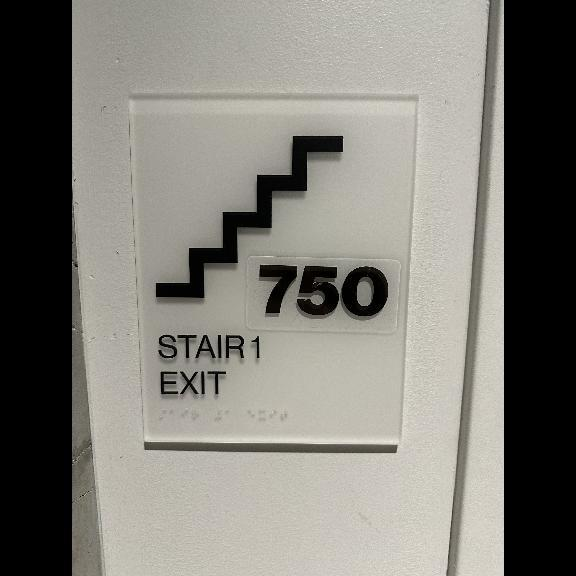
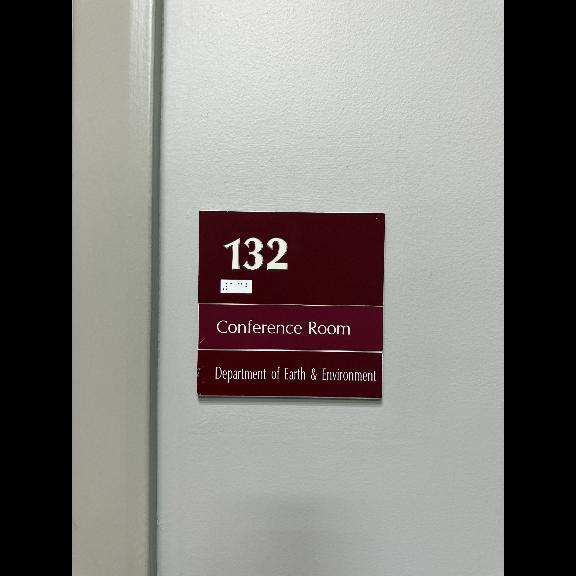

Training Epoch 10/10: 100%|██████████| 95/95 [02:18<00:00,  1.46s/it]


Average Training Loss: nan


Validation Epoch 10/10: 100%|██████████| 27/27 [00:19<00:00,  1.40it/s]
from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


Average Validation Loss: nan
failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.
from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response
failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.
from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.


failed to render model response
failed to render model response
failed to render model response


from_lmm is deprecated: `Detections.from_lmm` property is deprecated and will be removed in `supervision-0.31.0`. Use Detections.from_vlm instead.



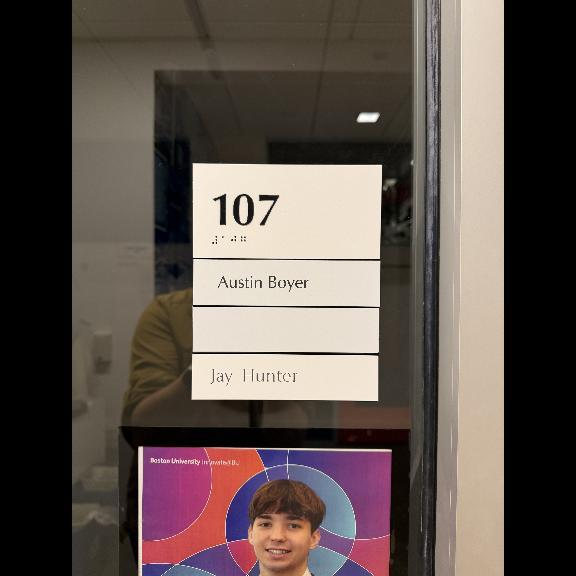
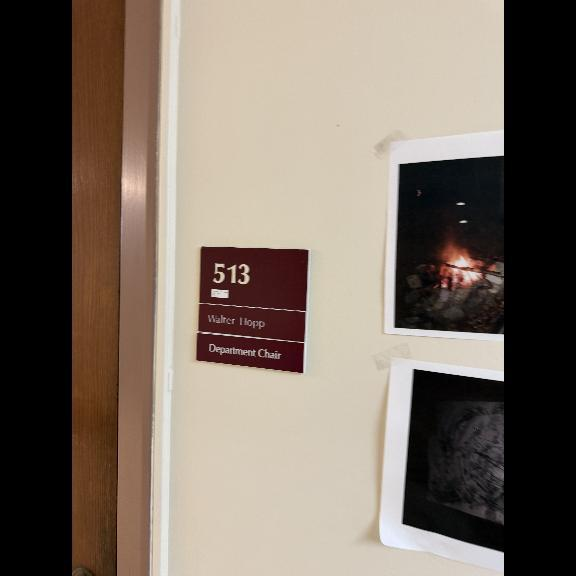
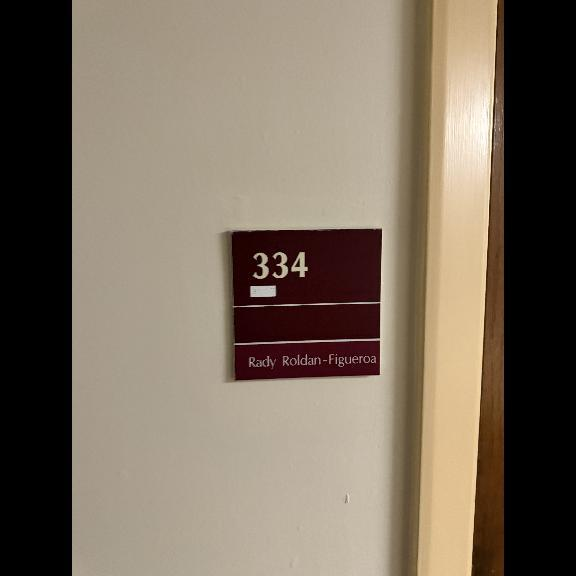
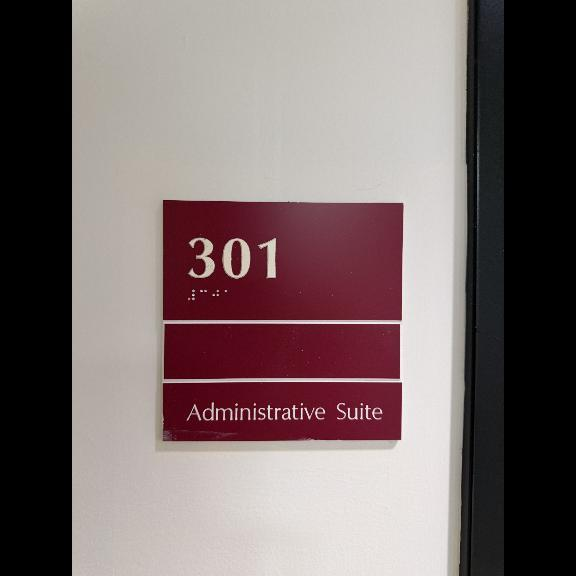
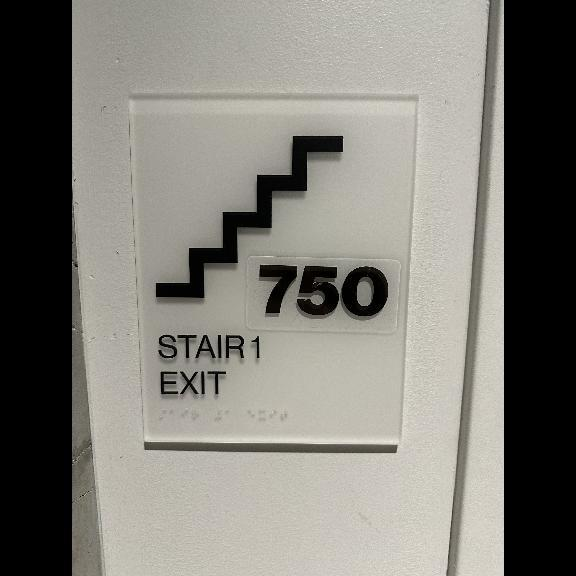
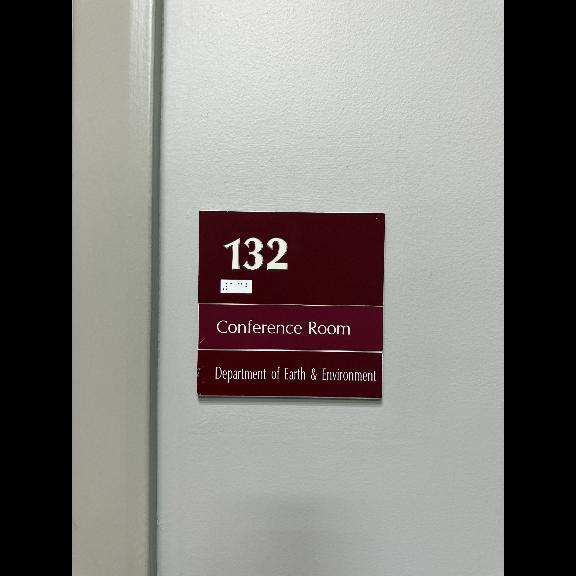

CPU times: user 2h 23min 52s, sys: 3min 59s, total: 2h 27min 51s
Wall time: 2h 27min 18s


In [ ]:
# @title Run train loop

%%time

EPOCHS = 10
LR = 5e-6

loss_per_epoch = []
for i in range(5):
  LR = LR * 10 #increases learning rate each epoch
  loss_per_epoch = train_model(train_loader, val_loader, peft_model, processor, epochs=EPOCHS, lr=LR, loss_per_epoch=loss_per_epoch)

In [ ]:
print(loss_per_epoch)

[(2.0071769381824294, 1.1601671554424144), (1.1018818140029907, 1.1565129889382257), (1.0122899695446617, 1.1865068409177992), (0.9666330111654181, 1.2203340552471302), (0.9291087319976405, 1.2239184158819694), (0.9025580371681012, 1.2746615167017337), (0.8724158061178107, 1.2830640806092157), (0.8553347336618524, 1.3079335512938324), (0.8430803606384679, 1.3217434264995434), (0.8241476648732236, 1.3289751829924408), (1.1326487754520618, 1.2738825171082109), (1.0214648654586391, 1.2615868316756353), (0.9439002783674942, 1.2978006932470534), (0.8093416835132398, 1.4501760866906908), (0.7097498184756229, 1.611859416520154), (0.6020115720598321, 1.6982586979866028), (0.4930594819156747, 1.9638979744028162), (0.37165876540698506, 2.155383485334891), (0.28448220852174255, 2.3935737433256925), (0.23199545317574552, 2.4208534646917275), (7.013690008772047, 4.827779434345387), (4.926807539086592, 4.779771928434019), (4.783171869579115, 5.212442168483028), (4.685829925537109, 4.7648009017661765

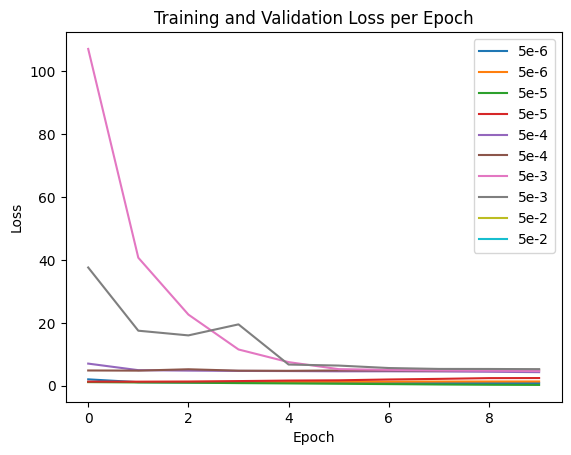

In [ ]:
#10 epochs per run
#5 runs
num_runs = len(loss_per_epoch)/10
run1 = loss_per_epoch[:10]
run2 = loss_per_epoch[10:20]
run3 = loss_per_epoch[20:30]
run4 = loss_per_epoch[30:40]
run5 = loss_per_epoch[40:]
plt.plot(run1, label='5e-6')  #LR = LR * (0.8 ** i)
plt.plot(run2, label='5e-5')
plt.plot(run3, label='5e-4')
plt.plot(run4, label='5e-3')
plt.plot(run5, label='5e-2')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss per Epoch')
plt.legend()
plt.savefig("all_train_val_losses.png")

In [ ]:
import os
from google.colab import files

folder = "/content"

# List files directly in the folder
for filename in os.listdir(folder):
    full_path = os.path.join(folder, filename)

    # skip directories
    if os.path.isdir(full_path):
        continue

    # only download PNGs
    if filename.lower().endswith(".png"):
        files.download(full_path)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
!zip -r model_checkpoints.zip model_checkpoints

  adding: model_checkpoints/ (stored 0%)
  adding: model_checkpoints/epoch_4/ (stored 0%)
  adding: model_checkpoints/epoch_4/tokenizer_config.json (deflated 95%)
  adding: model_checkpoints/epoch_4/processing_florence2.py (deflated 79%)
  adding: model_checkpoints/epoch_4/vocab.json (deflated 59%)
  adding: model_checkpoints/epoch_4/preprocessor_config.json (deflated 54%)
  adding: model_checkpoints/epoch_4/tokenizer.json (deflated 83%)
  adding: model_checkpoints/epoch_4/merges.txt (deflated 53%)
  adding: model_checkpoints/epoch_4/adapter_config.json (deflated 57%)
  adding: model_checkpoints/epoch_4/processor_config.json (deflated 38%)
  adding: model_checkpoints/epoch_4/special_tokens_map.json (deflated 98%)
  adding: model_checkpoints/epoch_4/adapter_model.safetensors (deflated 7%)
  adding: model_checkpoints/epoch_4/added_tokens.json (deflated 79%)
  adding: model_checkpoints/epoch_4/README.md (deflated 65%)
  adding: model_checkpoints/epoch_9/ (stored 0%)
  adding: model_checkp

In [ ]:
from google.colab import files
files.download("model_checkpoints.zip")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
torch.save(model.state_dict(), "florence2_weights_all.pt")
model.save_pretrained("/content/florence2-lora", safe_serialization=False)
processor.save_pretrained("/content/florence2-lora/")


['/content/florence2-lora/processor_config.json']

In [ ]:
!zip -r florence2-LoRA.zip florence2-lora
!zip -r florence2-weights-all.zip florence2_weights_all.pt

  adding: florence2-lora/ (stored 0%)
  adding: florence2-lora/tokenizer_config.json (deflated 95%)
  adding: florence2-lora/processing_florence2.py (deflated 79%)
  adding: florence2-lora/config.json (deflated 76%)
  adding: florence2-lora/vocab.json (deflated 59%)
  adding: florence2-lora/preprocessor_config.json (deflated 54%)
  adding: florence2-lora/tokenizer.json (deflated 83%)
  adding: florence2-lora/merges.txt (deflated 53%)
  adding: florence2-lora/processor_config.json (deflated 38%)
  adding: florence2-lora/special_tokens_map.json (deflated 98%)
  adding: florence2-lora/modeling_florence2.py (deflated 83%)
  adding: florence2-lora/pytorch_model.bin (deflated 41%)
  adding: florence2-lora/configuration_florence2.py (deflated 76%)
  adding: florence2-lora/added_tokens.json (deflated 79%)
  adding: florence2-lora/generation_config.json (deflated 47%)
  adding: florence2_weights_all.pt (deflated 41%)


In [ ]:
from google.colab import files
files.download("florence2-LoRA.zip")
files.download("florence2-weights-all.zip")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
peft_model.save_pretrained("/content/florence2-lora")
processor.save_pretrained("/content/florence2-lora/")
!ls -la /content/florence2-lora/